# Phi analysis on Amyloid beta

## Using FoldX results on double filament Ab structures (4-mers x 2 for most, 3-mers for 2nao):
- 2nao
- 5kk3
- 5oqv
- 7q4b
- 7q4m
- 8ezd
- 8eze

(structures 2beg and 2mxu are absent as their PDBs are single filament only)

## And calculating phi values

## This notebook: looking at differnt groups of mutations (conservative mutations and/or with small dd(Ea) effect) as well as those with ddG > min_ddG

17.04.2024

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import scipy

# for plotting
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

In [2]:
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_columns', 300)

In [3]:
%%bash

pip freeze

archspec @ file:///croot/archspec_1697725767277/work
arcplot==0.1.4
asttokens @ file:///home/conda/feedstock_root/build_artifacts/asttokens_1698341106958/work
biopython==1.83
boltons @ file:///work/ci_py311/boltons_1677685195580/work
Brotli @ file:///work/ci_py311/brotli-split_1676830125088/work
certifi @ file:///home/conda/feedstock_root/build_artifacts/certifi_1707022139797/work/certifi
cffi @ file:///croot/cffi_1700254295673/work
charset-normalizer @ file:///tmp/build/80754af9/charset-normalizer_1630003229654/work
comm @ file:///home/conda/feedstock_root/build_artifacts/comm_1710320294760/work
conda-content-trust @ file:///croot/conda-content-trust_1693490622020/work
conda-package-handling @ file:///croot/conda-package-handling_1690999929514/work
conda_package_streaming @ file:///croot/conda-package-streaming_1690987966409/work
contourpy==1.2.0
cryptography @ file:///croot/cryptography_1702070282333/work
cycler==0.12.1
debugpy @ file:///croot/debugpy_1690905042057/work
decorator @ f

# Read in first order dd(Ea) from doubles analysis

In [4]:
# going on to calculate phi values using ddEa from doubles run with all 3 datasets, Sigmoid fit

mochi_dir = '/lustre/scratch126/gengen/projects/amyloid_beta_epistasis/Doubles_analysis/all_vars_analysis/mochi_results/'



In [5]:
# here will look only at runs with all 3 doubles datasets
# Sigmoid fit

curr_path = mochi_dir + '20240219_max_terms_order_1_Sigmoid_l2_regularization_factor_1e-05_all_3_doubles_datasets_all_variants'       

weights_Nucleation = pd.read_csv(curr_path + '/weights/weights_Nucleation.txt',
                                sep='\t')


In [6]:
weights_Nucleation

,id,id_ref,Pos,Pos_ref,fold_1,fold_2,fold_3,fold_4,fold_5,fold_6,fold_7,fold_8,fold_9,fold_10,n,mean,std,ci95,trait_name,mean_kcal/mol,std_kcal/mol,ci95_kcal/mol
0,WT,WT,NaN,NaN,0.371381,0.391369,0.357266,0.348474,0.372521,0.341733,0.358259,0.353224,0.374944,0.356986,10,0.362616,0.014747,0.057808,Nucleation,0.218317,0.008879,0.034804
1,D1*,D1*,1.0,1.0,-2.213683,-2.545237,-2.185623,-2.583970,-2.320398,-2.029718,-2.038322,-2.851886,-2.372507,-2.080908,10,-2.322225,0.270011,1.058444,Nucleation,-1.398121,0.162563,0.637248
2,D1A,D1A,1.0,1.0,0.047495,0.067011,0.077061,0.008786,0.037928,0.066478,0.067405,0.073109,0.027157,0.099418,10,0.057185,0.026726,0.104765,Nucleation,0.034429,0.016091,0.063075
3,D1C,D1C,1.0,1.0,0.020790,-0.018463,0.064381,0.025494,0.063339,0.093359,0.062324,0.084942,0.114450,0.044598,10,0.055521,0.038954,0.152699,Nucleation,0.033427,0.023453,0.091934
4,D1E,D1E,1.0,1.0,-0.053183,-0.059048,-0.048736,-0.055957,-0.051849,-0.058691,-0.070539,-0.051149,-0.047641,-0.064017,10,-0.056081,0.007176,0.028130,Nucleation,-0.033764,0.004320,0.016936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
836,A42T,A42T,42.0,42.0,0.145117,0.149020,0.219678,0.186265,0.082041,0.077438,0.125795,0.167661,0.201935,0.257585,10,0.161254,0.057718,0.226253,Nucleation,0.097084,0.034749,0.136218
837,A42V,A42V,42.0,42.0,0.229532,0.334067,0.283984,0.229813,0.256938,0.260202,0.229795,0.320931,0.256699,0.279617,10,0.268158,0.036916,0.144711,Nucleation,0.161447,0.022226,0.087125
838,A42W,A42W,42.0,42.0,-1.611651,-1.768430,-1.426433,-1.168376,-1.707580,-1.035545,-1.801229,-1.726302,-1.276101,-1.233302,10,-1.475495,0.282040,1.105598,Nucleation,-0.888338,0.169805,0.665637
839,A42Y,A42Y,42.0,42.0,-0.916438,-0.897971,-1.026022,-1.039680,-1.146212,-0.833155,-0.995114,-0.729666,-1.002822,-0.952950,10,-0.954003,0.116918,0.458318,Nucleation,-0.574368,0.070392,0.275936


In [7]:
# only select conservative mutations
# for now only aliphatic --> aliphatic (A, I, L, M, V - as deifned in Bolognesi Abeta papers)
# and aromatic --> aromatic (F, W, Y)

aa_lists = {}

aa_lists['aliphatic'] = ['A', 'I', 'L', 'M', 'V']
aa_lists['aromatic'] = ['F', 'W', 'Y']
aa_lists['negative'] = ['E', 'D']
aa_lists['positive'] = ['R', 'K']
aa_lists['polar'] = ['S', 'H', 'Q', 'T', 'C', 'N']
aa_lists['glycine'] = ['G']
aa_lists['proline'] = ['P']


# 0 here means not conservative in the sense
weights_Nucleation['conservative'] = [0 for i in range(len(weights_Nucleation))]
# also add indicator of all mutations (Will need this later on)
weights_Nucleation['all'] = [1 for i in range(len(weights_Nucleation))]

for idx in list(weights_Nucleation.index):
    curr_mutation = weights_Nucleation.loc[idx, 'id']
    
    wt_aa = curr_mutation[0]
    mut_aa = curr_mutation[-1]
    
    for aa_class, aa_list in aa_lists.items():
        if wt_aa in aa_list:
            wt_aa_class = aa_class
        
        if mut_aa in aa_list:
            mut_aa_class = aa_class
    
    if curr_mutation != 'WT':  
        # don't need to consider stop codons here
        if mut_aa != '*':       
            if wt_aa_class == mut_aa_class:
                weights_Nucleation.loc[idx,'conservative'] = 1

    

In [8]:
np.unique(weights_Nucleation['conservative'], return_counts=True)

(array([0, 1]), array([725, 116]))

In [9]:
weights_Nucleation

,id,id_ref,Pos,Pos_ref,fold_1,fold_2,fold_3,fold_4,fold_5,fold_6,fold_7,fold_8,fold_9,fold_10,n,mean,std,ci95,trait_name,mean_kcal/mol,std_kcal/mol,ci95_kcal/mol,conservative,all
0,WT,WT,NaN,NaN,0.371381,0.391369,0.357266,0.348474,0.372521,0.341733,0.358259,0.353224,0.374944,0.356986,10,0.362616,0.014747,0.057808,Nucleation,0.218317,0.008879,0.034804,0,1
1,D1*,D1*,1.0,1.0,-2.213683,-2.545237,-2.185623,-2.583970,-2.320398,-2.029718,-2.038322,-2.851886,-2.372507,-2.080908,10,-2.322225,0.270011,1.058444,Nucleation,-1.398121,0.162563,0.637248,0,1
2,D1A,D1A,1.0,1.0,0.047495,0.067011,0.077061,0.008786,0.037928,0.066478,0.067405,0.073109,0.027157,0.099418,10,0.057185,0.026726,0.104765,Nucleation,0.034429,0.016091,0.063075,0,1
3,D1C,D1C,1.0,1.0,0.020790,-0.018463,0.064381,0.025494,0.063339,0.093359,0.062324,0.084942,0.114450,0.044598,10,0.055521,0.038954,0.152699,Nucleation,0.033427,0.023453,0.091934,0,1
4,D1E,D1E,1.0,1.0,-0.053183,-0.059048,-0.048736,-0.055957,-0.051849,-0.058691,-0.070539,-0.051149,-0.047641,-0.064017,10,-0.056081,0.007176,0.028130,Nucleation,-0.033764,0.004320,0.016936,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
836,A42T,A42T,42.0,42.0,0.145117,0.149020,0.219678,0.186265,0.082041,0.077438,0.125795,0.167661,0.201935,0.257585,10,0.161254,0.057718,0.226253,Nucleation,0.097084,0.034749,0.136218,0,1
837,A42V,A42V,42.0,42.0,0.229532,0.334067,0.283984,0.229813,0.256938,0.260202,0.229795,0.320931,0.256699,0.279617,10,0.268158,0.036916,0.144711,Nucleation,0.161447,0.022226,0.087125,1,1
838,A42W,A42W,42.0,42.0,-1.611651,-1.768430,-1.426433,-1.168376,-1.707580,-1.035545,-1.801229,-1.726302,-1.276101,-1.233302,10,-1.475495,0.282040,1.105598,Nucleation,-0.888338,0.169805,0.665637,0,1
839,A42Y,A42Y,42.0,42.0,-0.916438,-0.897971,-1.026022,-1.039680,-1.146212,-0.833155,-0.995114,-0.729666,-1.002822,-0.952950,10,-0.954003,0.116918,0.458318,Nucleation,-0.574368,0.070392,0.275936,0,1


In [10]:
# add ddEa, bc weights_Nucleation['mean_kcal/mol'] is -ddEa
weights_Nucleation['ddEa'] = - weights_Nucleation['mean_kcal/mol']

In [11]:
# let's find mode of the mild effects peak and take mutations around it more stringently

mode_mild_ddEa_effects_mutations = scipy.stats.mode((np.round(weights_Nucleation['ddEa'], 1)))[0]
mode_mild_ddEa_effects_mutations

0.1

### Mode of the left peak (mild ddEa effect mutations)

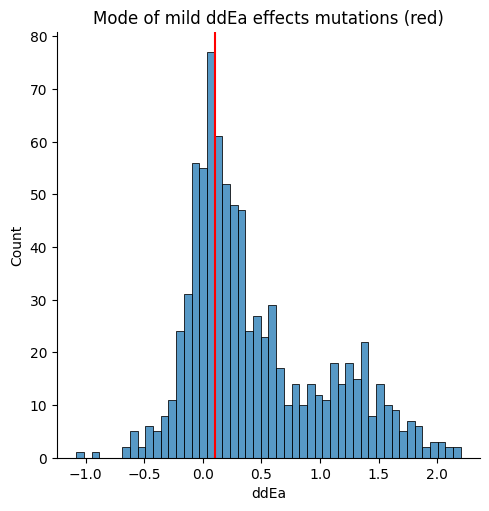

In [12]:
sns.displot(weights_Nucleation['ddEa'], bins=50)
#sns.displot(weights_Nucleation[weights_Nucleation['conservative_mut'] == 1]['ddEa'], bins=50)

plt.title("Mode of mild ddEa effects mutations (red)")
plt.axvline(mode_mild_ddEa_effects_mutations, color='r')


### Playing around with different thresholds to see what pattern of mild effects mutations we get

In [13]:
windows = [1.5, 1, 0.5, 0.2, 0.1, 0.05] # variable stringency of mild ddEa effects mutations


In [14]:
for window in windows:
    #print(cutoff)
    weights_Nucleation['mild_ddEa_effect_window_' + str(window)] = [1 if mode_mild_ddEa_effects_mutations - window/2 < weights_Nucleation.loc[idx,'ddEa'] < mode_mild_ddEa_effects_mutations + window/2 else 0 for idx in list(weights_Nucleation.index)]
    
    print('with window', str(window) + ' around mode:', len(weights_Nucleation[weights_Nucleation['mild_ddEa_effect_window_' + str(window)] == 1]), 'out of', len(weights_Nucleation), 
          'mutations are selected as mild ddEa effect')
    #print(window, np.unique(weights_Nucleation['mild_ddEa_effect_window_' + str(window)], return_counts=True))

with window 1.5 around mode: 635 out of 841 mutations are selected as mild ddEa effect
with window 1 around mode: 568 out of 841 mutations are selected as mild ddEa effect
with window 0.5 around mode: 414 out of 841 mutations are selected as mild ddEa effect
with window 0.2 around mode: 200 out of 841 mutations are selected as mild ddEa effect
with window 0.1 around mode: 106 out of 841 mutations are selected as mild ddEa effect
with window 0.05 around mode: 50 out of 841 mutations are selected as mild ddEa effect


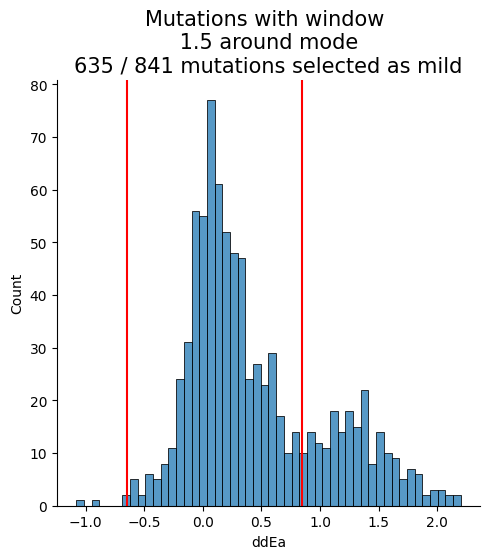

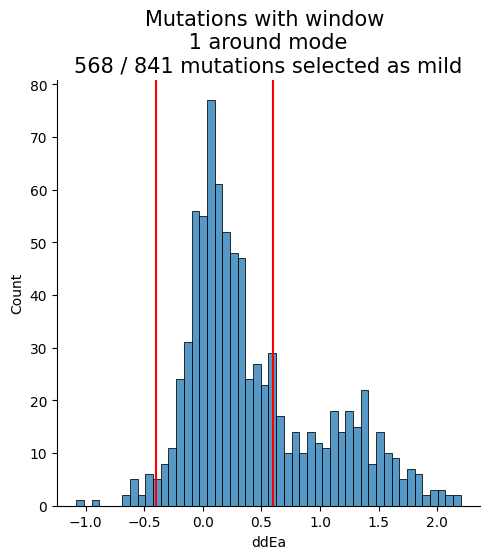

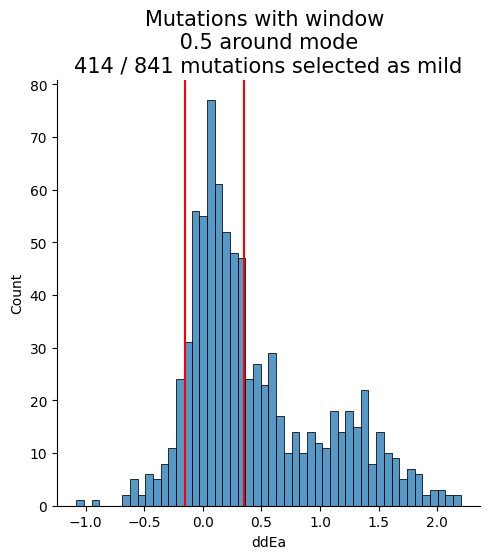

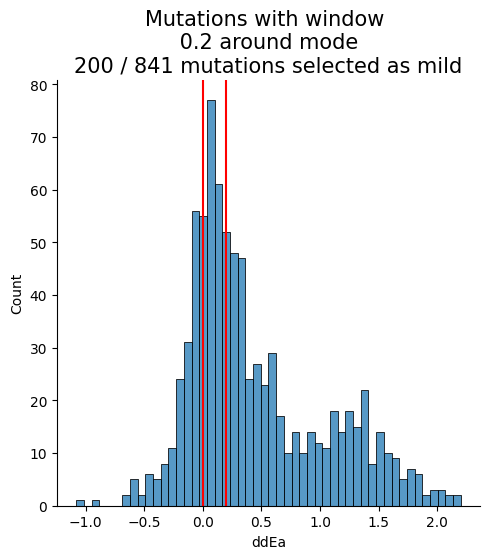

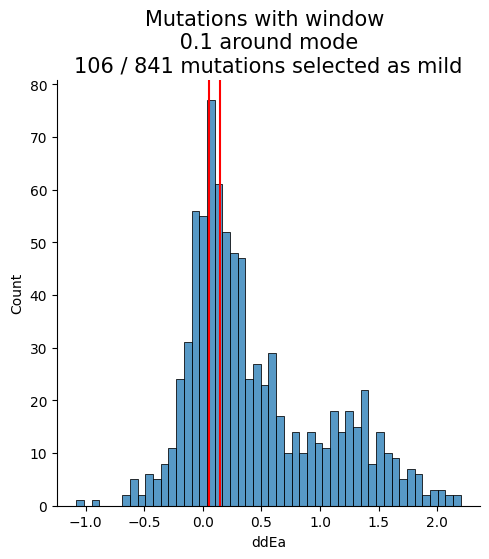

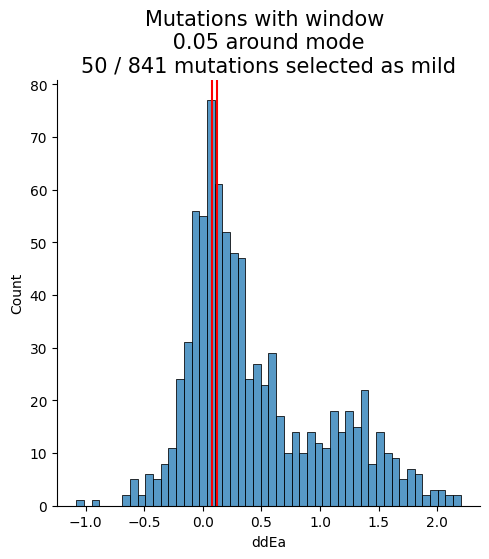

In [15]:
for window in windows:
    #print(cutoff)

    sns.displot(weights_Nucleation['ddEa'], bins=50)
    #sns.displot(weights_Nucleation[weights_Nucleation['conservative_mut'] == 1]['ddEa'], bins=50)

    plt.title('Mutations with window \n ' + str(window) + ' around mode \n' + str(len(weights_Nucleation[weights_Nucleation['mild_ddEa_effect_window_' + str(window)] == 1]))+' / '+str(len(weights_Nucleation)) + ' mutations selected as mild',
             fontsize = 15)
    plt.axvline(mode_mild_ddEa_effects_mutations + window/2, color='r')
    plt.axvline(mode_mild_ddEa_effects_mutations - window/2, color='r')


In [16]:
for window in windows:
    #print(cutoff)
    weights_Nucleation['mild_ddEa_effect_window_' + str(window)] = [1 if mode_mild_ddEa_effects_mutations - window/2 < weights_Nucleation.loc[idx,'ddEa'] < mode_mild_ddEa_effects_mutations + window/2 else 0 for idx in list(weights_Nucleation.index)]
    
    print(str(len(weights_Nucleation[weights_Nucleation['mild_ddEa_effect_window_' + str(window)] == 1]))+'/'+str(len(weights_Nucleation)), )
    #print(window, np.unique(weights_Nucleation['mild_ddEa_effect_window_' + str(window)], return_counts=True))

635/841
568/841
414/841
200/841
106/841
50/841


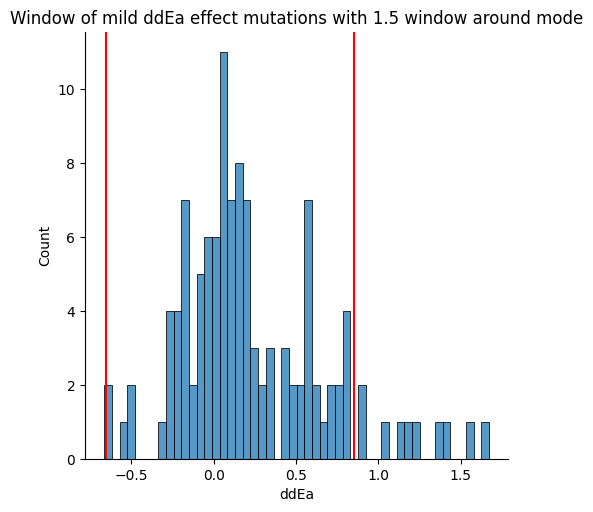

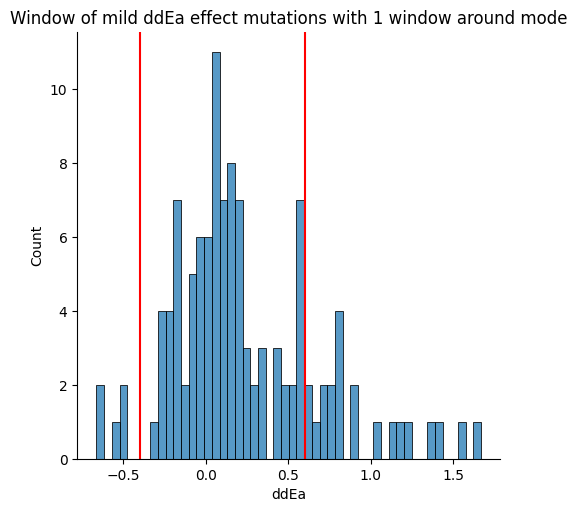

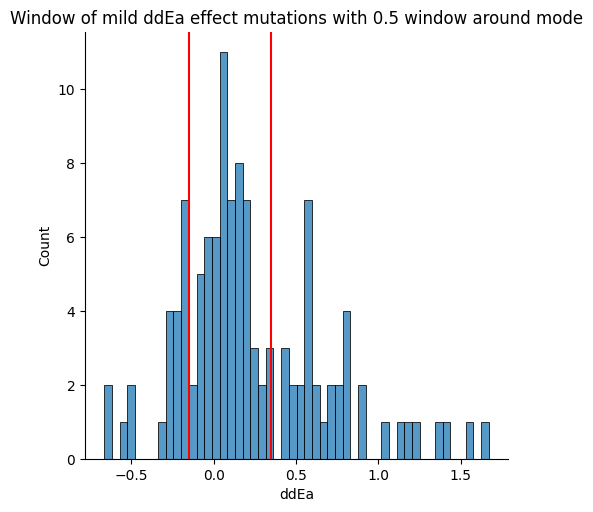

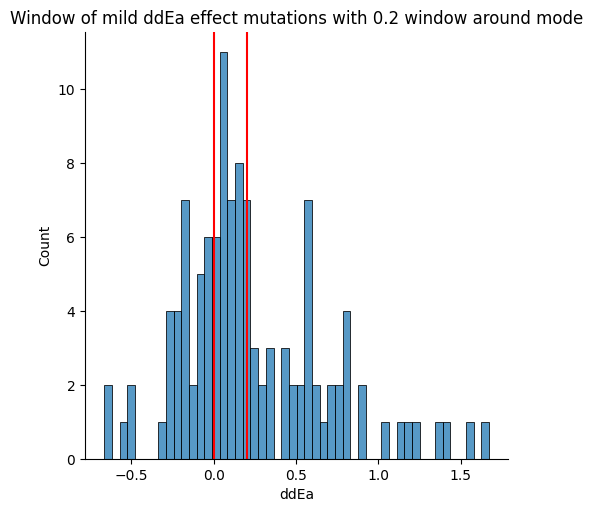

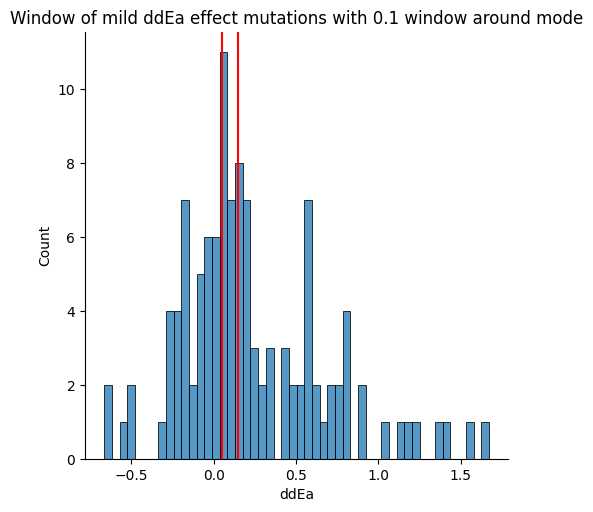

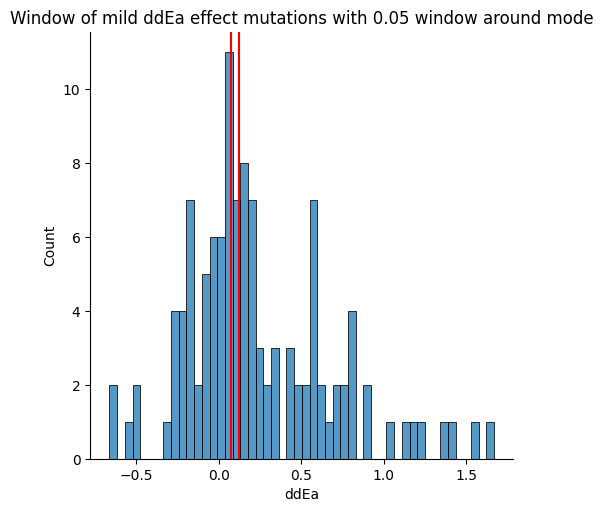

In [17]:
# how do these windows treat conservative mutations?
for window in windows:
    #print(window)

    sns.displot(weights_Nucleation[weights_Nucleation['conservative'] == 1]['ddEa'], bins=50)
    #sns.displot(weights_Nucleation[weights_Nucleation['conservative_mut'] == 1]['ddEa'], bins=50)

    plt.title('Window of mild ddEa effect mutations with ' + str(window) + ' window around mode')
    plt.axvline(mode_mild_ddEa_effects_mutations + window/2, color='r')
    plt.axvline(mode_mild_ddEa_effects_mutations - window/2, color='r')


/tmp/ipykernel_326664/1212163496.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(weights_Nucleation['ddEa'], bins=50)
/tmp/ipykernel_326664/1212163496.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(weights_Nucleation[weights_Nucleation['conservative'] == 1]['ddEa'], bins=50)


<Axes: xlabel='ddEa', ylabel='Density'>

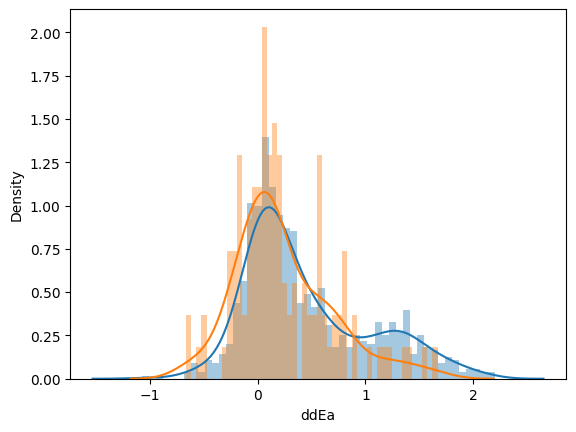

In [18]:
sns.distplot(weights_Nucleation['ddEa'], bins=50)
sns.distplot(weights_Nucleation[weights_Nucleation['conservative'] == 1]['ddEa'], bins=50)


In [19]:
# overlap conservaitve and mild effects selection filters
for window in windows:
    print(window)
    weights_Nucleation['conservative_and_mild_ddEa_effect_window_' + str(window)] = [cons_mut*mild_effect for cons_mut,mild_effect in zip(weights_Nucleation['conservative'],
                                                                                                                             weights_Nucleation['mild_ddEa_effect_window_' + str(window)])]
    print(np.unique(weights_Nucleation['conservative_and_mild_ddEa_effect_window_' + str(window)],
                    return_counts=True))
    

1.5
(array([0, 1]), array([736, 105]))
1
(array([0, 1]), array([751,  90]))
0.5
(array([0, 1]), array([782,  59]))
0.2
(array([0, 1]), array([805,  36]))
0.1
(array([0, 1]), array([824,  17]))
0.05
(array([0, 1]), array([831,  10]))


In [20]:
# visualise these

In [21]:
# table of all possible 20 aa in all possible Ab (42) positions

AB_WT = "DAEFRHDSGYEVHHQKLVFFAEDVGSNKGAIIGLMVGGVVIA"
all_aa = ["G","A","V","L","M","I","F","Y","W","K","R","D","E","S","T","C","N","Q","H", "P", "*"]


ddE_df_mean_kcalmol = pd.DataFrame(columns=[elem + '-' + str(idx+1) for idx,elem in enumerate(list(AB_WT))], 
                                                           index = list(all_aa))

In [22]:
ddE_df_mean_kcalmol.head()

,D-1,A-2,E-3,F-4,R-5,H-6,D-7,S-8,G-9,Y-10,E-11,V-12,H-13,H-14,Q-15,K-16,L-17,V-18,F-19,F-20,A-21,E-22,D-23,V-24,G-25,S-26,N-27,K-28,G-29,A-30,I-31,I-32,G-33,L-34,M-35,V-36,G-37,G-38,V-39,V-40,I-41,A-42
G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
V,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
# populate the ddE_df table according to weights_Nucleation

for idx in list(weights_Nucleation.index):

    curr_mutation_id = weights_Nucleation.loc[idx,'id']

    # continue if not WT
    if curr_mutation_id != 'WT':
        # position (1-42) of mutation in Ab sequence
        curr_mutation_pos = curr_mutation_id[1:-1]
        # aa introduced by the mutation
        curr_new_aa = curr_mutation_id[-1]

        # inferred value of ddEa to be added
        curr_ddEa_value = weights_Nucleation.loc[idx,'ddEa']

        # minus because we have -ddEa predicted
        ddE_df_mean_kcalmol.loc[curr_new_aa, list(ddE_df_mean_kcalmol.columns)[int(curr_mutation_pos) - 1]] = curr_ddEa_value


In [24]:
# make sure values are float
for col in list(ddE_df_mean_kcalmol.columns):
    ddE_df_mean_kcalmol[col] = ddE_df_mean_kcalmol[col].astype(float)


In [25]:
mask_ddE = ddE_df_mean_kcalmol.isnull()

cmap_ddE = matplotlib.colormaps.get('RdBu_r')
cmap_ddE.set_bad("lightgrey")

In [26]:
ddE_df_mean_kcalmol

,D-1,A-2,E-3,F-4,R-5,H-6,D-7,S-8,G-9,Y-10,E-11,V-12,H-13,H-14,Q-15,K-16,L-17,V-18,F-19,F-20,A-21,E-22,D-23,V-24,G-25,S-26,N-27,K-28,G-29,A-30,I-31,I-32,G-33,L-34,M-35,V-36,G-37,G-38,V-39,V-40,I-41,A-42
G,-0.119701,0.059928,-0.122183,0.155388,0.273210,0.125394,-0.088484,0.011455,NaN,-0.035645,-0.170406,-0.046356,0.305785,-0.080650,0.159397,0.225941,0.003615,0.208568,0.317547,-0.117753,0.005184,-0.891521,-0.282565,-0.210639,NaN,0.118772,0.936001,0.342265,NaN,0.023901,0.652212,1.692311,NaN,1.394856,1.322565,0.966701,NaN,NaN,1.783354,1.331486,1.539978,0.607499
A,-0.034429,NaN,-0.072107,0.118129,0.299875,0.163768,-0.000684,0.066319,0.048261,-0.001086,-0.041064,0.011295,0.337319,0.020472,-0.175080,0.419059,0.182019,0.345318,0.545543,0.439302,NaN,-0.328939,0.421591,0.067065,0.244236,0.188573,0.390329,0.155993,0.482878,NaN,0.752810,1.403363,0.962295,0.704062,1.197584,0.641576,1.058879,1.086309,1.139098,1.244563,1.546236,NaN
V,0.461832,0.432284,0.340384,0.214031,0.269688,0.284629,0.231658,0.179811,0.103366,0.093800,-0.013110,NaN,-0.077308,-0.344330,-0.477001,0.327231,-0.267456,NaN,-0.147098,0.004388,-0.227195,0.007641,0.980338,NaN,0.122848,-0.225809,-0.087166,0.292174,-0.340739,-0.663183,0.274288,0.595264,1.145424,-0.171591,0.479416,NaN,1.285608,1.121802,NaN,NaN,0.815993,-0.161447
L,0.641402,0.563584,0.529227,0.266033,0.376285,0.432850,0.255755,0.160883,0.300386,0.313313,0.587651,0.211766,0.357683,0.069493,0.033996,0.771553,NaN,0.412139,0.079174,0.156909,-0.258303,0.448976,1.185666,0.165575,0.481879,0.067067,0.354235,1.182976,0.436138,-0.251092,0.902756,1.351679,0.936964,NaN,1.038536,-0.072776,2.156709,1.669760,0.577498,0.815200,0.572480,-0.620313
M,0.196217,0.272486,0.069836,0.146869,0.258301,0.188453,0.049938,0.061914,0.118189,0.209153,0.476233,0.091943,0.121477,0.318057,0.126937,0.608990,-0.032775,0.154946,-0.100944,0.124171,-0.151081,0.256716,1.114857,-0.043817,0.286077,0.215284,0.003382,0.962922,0.443769,0.202273,0.468827,1.670077,0.323637,0.053965,NaN,0.056243,1.927560,1.351779,0.560566,0.896312,0.665332,-0.479129
I,0.603542,0.506125,0.361030,0.182046,0.288060,0.424054,0.236218,0.258268,0.116144,0.146601,-0.052730,0.077439,-0.157250,-0.370361,-0.412183,0.686823,-0.289128,0.067835,-0.335826,-0.211695,-0.516590,0.440895,1.267623,-0.183901,0.111952,0.065182,-0.052525,0.544030,-0.265529,-0.560516,NaN,NaN,1.370139,-0.310746,0.709471,-0.191319,1.834677,1.362958,-0.035779,0.418822,NaN,-0.162904
F,0.111876,0.029937,-0.058595,NaN,0.324749,0.198976,0.068263,0.064392,-0.042781,0.028365,0.108024,0.131447,0.029287,0.263101,0.176137,0.963838,-0.215030,-0.029825,NaN,NaN,-0.443639,0.616724,1.251019,0.221963,0.141024,0.466875,-0.441150,0.623286,0.462071,0.157322,0.558491,1.269893,0.852814,0.273586,1.504866,0.058850,2.004759,1.483052,0.809109,0.579608,-0.088316,-0.041485
Y,0.096262,0.066753,-0.071505,0.080424,0.341684,0.194762,0.065374,0.043734,-0.166671,NaN,-0.070662,0.235773,-0.040376,0.252318,0.492786,0.123187,-0.202698,-0.115656,0.220500,0.074839,0.155249,0.316694,1.074554,0.366860,0.184583,0.385578,-0.071801,0.198598,0.557470,1.182288,0.555885,1.342342,0.788747,0.598253,1.089803,0.177152,1.790839,1.653306,0.851876,0.286320,0.140005,0.574368
W,0.214893,0.046681,-0.167809,0.182460,0.332840,0.138308,0.028336,0.021277,0.098096,0.170297,0.304457,0.063519,0.485229,0.874642,1.302692,1.056514,-0.039633,0.315009,0.611452,0.775424,0.589364,1.363573,1.398057,0.711518,0.627543,0.863779,0.426370,1.084496,1.065173,1.238422,0.961889,1.822206,1.460660,1.142606,1.257964,1.262330,2.096475,1.958122,1.583703,1.504526,0.620594,0.888338
K,0.044045,0.085362,-0.031231,0.224949,0.083648,0.137113,-0.007907,0.086385,-0.017473,0.068911,0.066428,0.024703,0.148089,0.169389,0.347664,NaN,-0.107289,0.189201,0.147531,-0.031171,0.379351,-0.143366,0.037637,-0.007728,-0.041850,0.591848,1.103572,NaN,0.674215,0.918944,0.577601,1.580024,0.500111,0.644164,1.619951,0.712695,2.199674,0.691734,0.965033,1.611606,1.100475,0.986689


Text(0.5, 1.0, 'Sigmoid fit, l2=1e-05')

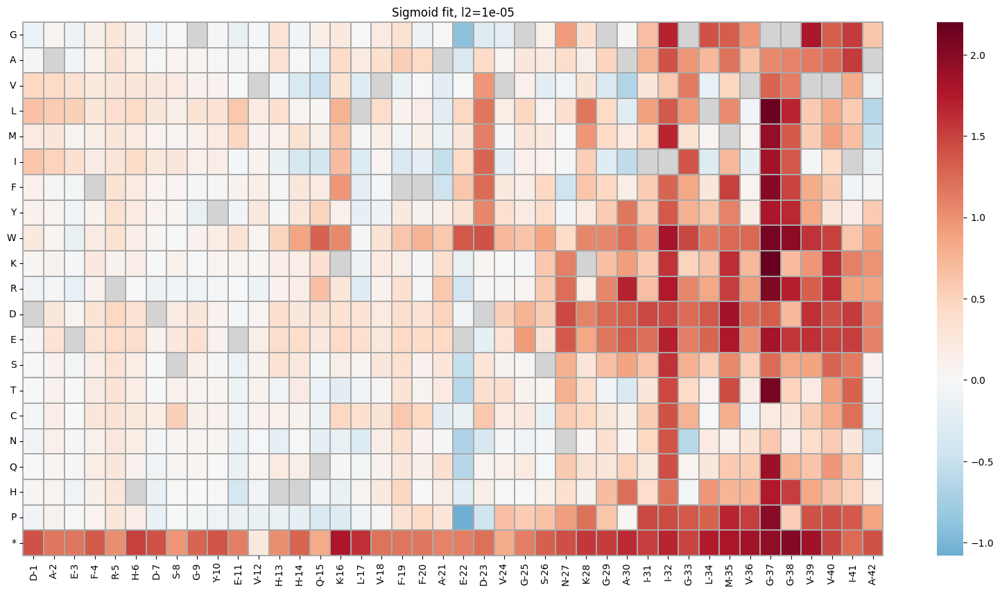

In [27]:
fig = plt.figure(figsize=(20, 10))
sns.heatmap(ddE_df_mean_kcalmol, cmap=cmap_ddE, 
            #vmin = ddE_df_mean_kcalmol.fillna(0, inplace=False).to_numpy().min(),
            #vmax = 5,
            mask=mask_ddE,
            linewidths=0.005, linecolor='darkgrey', clip_on=False,
            center=0)
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('Sigmoid fit, l2=1e-05')

#plt.savefig('./figures/20240206_mochi_ddEa_heatmap_all_3_doubles_1st_ord_terms_allowed_Sigmoid.pdf',
#           bbox_inches = 'tight')

In [28]:
windows

[1.5, 1, 0.5, 0.2, 0.1, 0.05]

In [29]:
weights_Nucleation.columns

Index(['id', 'id_ref', 'Pos', 'Pos_ref', 'fold_1', 'fold_2', 'fold_3',
       'fold_4', 'fold_5', 'fold_6', 'fold_7', 'fold_8', 'fold_9', 'fold_10',
       'n', 'mean', 'std', 'ci95', 'trait_name', 'mean_kcal/mol',
       'std_kcal/mol', 'ci95_kcal/mol', 'conservative', 'all', 'ddEa',
       'mild_ddEa_effect_window_1.5', 'mild_ddEa_effect_window_1',
       'mild_ddEa_effect_window_0.5', 'mild_ddEa_effect_window_0.2',
       'mild_ddEa_effect_window_0.1', 'mild_ddEa_effect_window_0.05',
       'conservative_and_mild_ddEa_effect_window_1.5',
       'conservative_and_mild_ddEa_effect_window_1',
       'conservative_and_mild_ddEa_effect_window_0.5',
       'conservative_and_mild_ddEa_effect_window_0.2',
       'conservative_and_mild_ddEa_effect_window_0.1',
       'conservative_and_mild_ddEa_effect_window_0.05'],
      dtype='object')

In [30]:
# df with markers of conserv & mild effect mutations
# or only conservative mutations
# or only mild effects mutations

dfs_ddEa_mut = {}

mutation_groups = ['all', 'conservative'] + ['mild_ddEa_effect_window_' + str(window) for window in windows] + ['conservative_and_mild_ddEa_effect_window_' + str(window) for window in windows]

for group in mutation_groups:
    print(group)
    dfs_ddEa_mut[group] = pd.DataFrame(columns=[elem + '-' + str(idx+1) for idx,elem in enumerate(list(AB_WT))], 
                                                           index = list(all_aa))

all
conservative
mild_ddEa_effect_window_1.5
mild_ddEa_effect_window_1
mild_ddEa_effect_window_0.5
mild_ddEa_effect_window_0.2
mild_ddEa_effect_window_0.1
mild_ddEa_effect_window_0.05
conservative_and_mild_ddEa_effect_window_1.5
conservative_and_mild_ddEa_effect_window_1
conservative_and_mild_ddEa_effect_window_0.5
conservative_and_mild_ddEa_effect_window_0.2
conservative_and_mild_ddEa_effect_window_0.1
conservative_and_mild_ddEa_effect_window_0.05


In [31]:
weights_Nucleation['conservative_and_mild_ddEa_effect_window_0.05']

0      0
1      0
2      0
3      0
4      0
      ..
836    0
837    0
838    0
839    0
840    0
Name: conservative_and_mild_ddEa_effect_window_0.05, Length: 841, dtype: int64

In [32]:
# populate the df_mask_cons_mild_effect table according to weights_Nucleation['conservative_mut_and_mild_ddEa_effect']

for idx in list(weights_Nucleation.index):

    curr_mutation_id = weights_Nucleation.loc[idx,'id']

    # continue if not WT
    if curr_mutation_id != 'WT':
        # position (1-42) of mutation in Ab sequence
        curr_mutation_pos = curr_mutation_id[1:-1]
        # aa introduced by the mutation
        curr_new_aa = curr_mutation_id[-1]
        
        
        for group in mutation_groups:
            curr_value = weights_Nucleation.loc[idx,group]
            
            dfs_ddEa_mut[group].loc[curr_new_aa, list(dfs_ddEa_mut[group].columns)[int(curr_mutation_pos) - 1]] = curr_value
            

In [33]:
cmap_universal = matplotlib.colormaps.get('RdBu_r')
cmap_universal.set_bad("lightgrey")

masks_ddEa = {}

for group in mutation_groups:
    masks_ddEa[group] = dfs_ddEa_mut[group].isnull()

In [34]:
for group in mutation_groups:
    dfs_ddEa_mut[group] = dfs_ddEa_mut[group].astype(float)

In [35]:
overlay_dfs = {}
for group in mutation_groups:
    
    overlay_dfs[group] = dfs_ddEa_mut[group]* ddE_df_mean_kcalmol 
    overlay_dfs[group] = overlay_dfs[group].fillna(0)

In [36]:
mask_overlay_dfs = {}

for group in mutation_groups:
    mask_overlay_dfs[group] = overlay_dfs[group].isin([0])

In [37]:
mutation_groups

['all',
 'conservative',
 'mild_ddEa_effect_window_1.5',
 'mild_ddEa_effect_window_1',
 'mild_ddEa_effect_window_0.5',
 'mild_ddEa_effect_window_0.2',
 'mild_ddEa_effect_window_0.1',
 'mild_ddEa_effect_window_0.05',
 'conservative_and_mild_ddEa_effect_window_1.5',
 'conservative_and_mild_ddEa_effect_window_1',
 'conservative_and_mild_ddEa_effect_window_0.5',
 'conservative_and_mild_ddEa_effect_window_0.2',
 'conservative_and_mild_ddEa_effect_window_0.1',
 'conservative_and_mild_ddEa_effect_window_0.05']

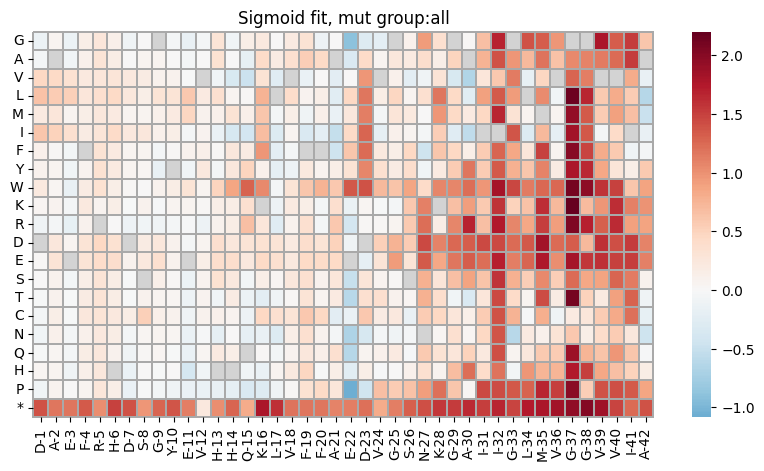

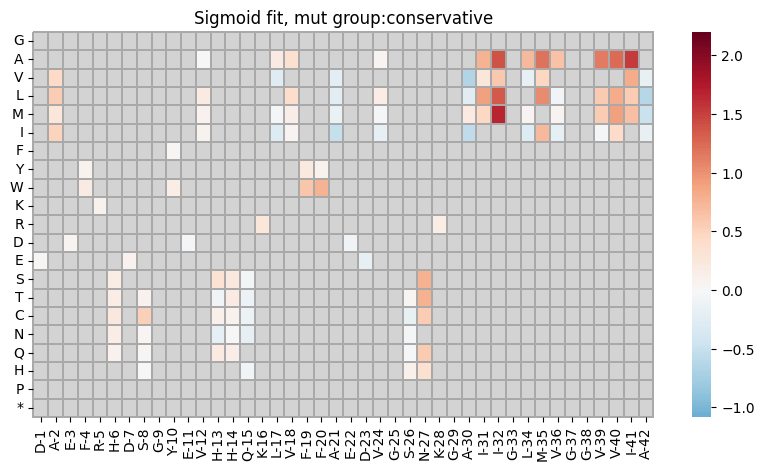

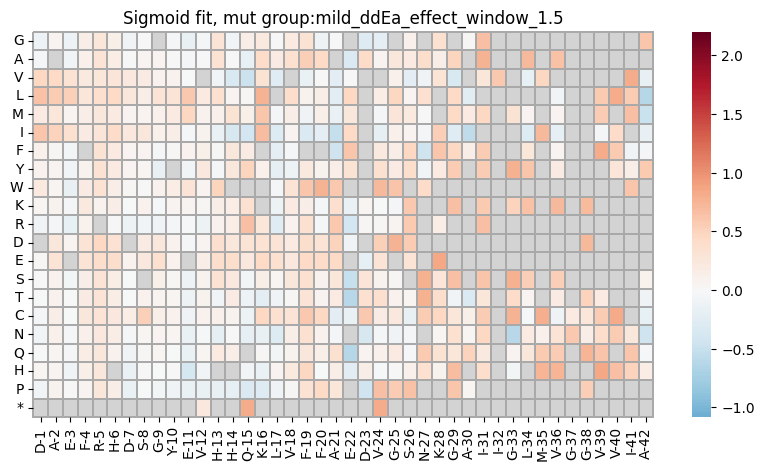

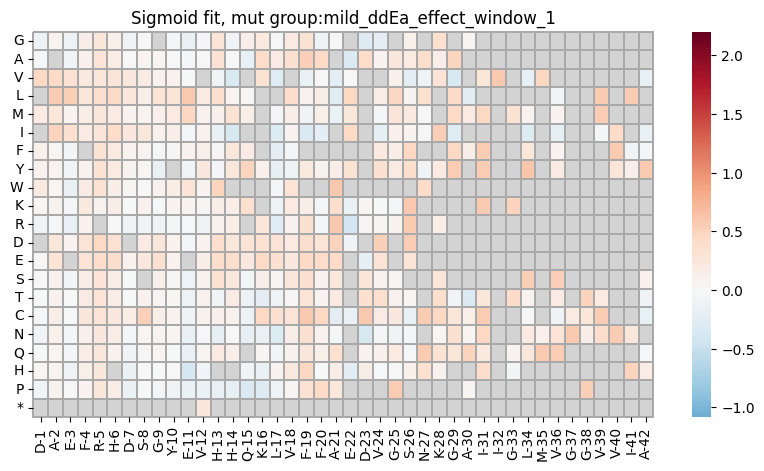

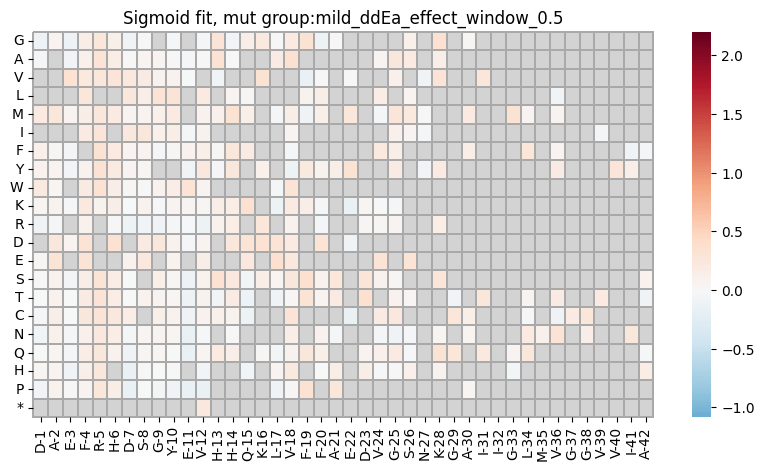

...

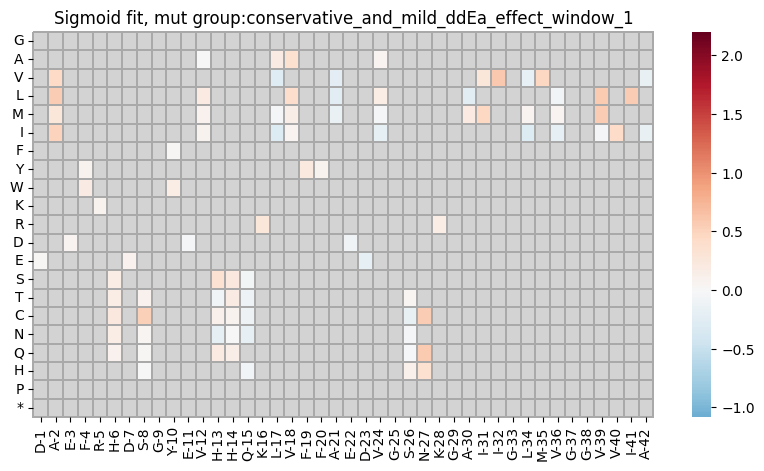

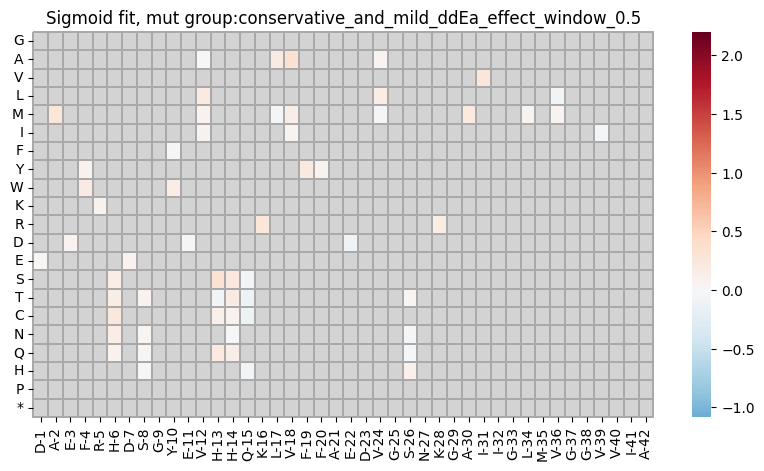

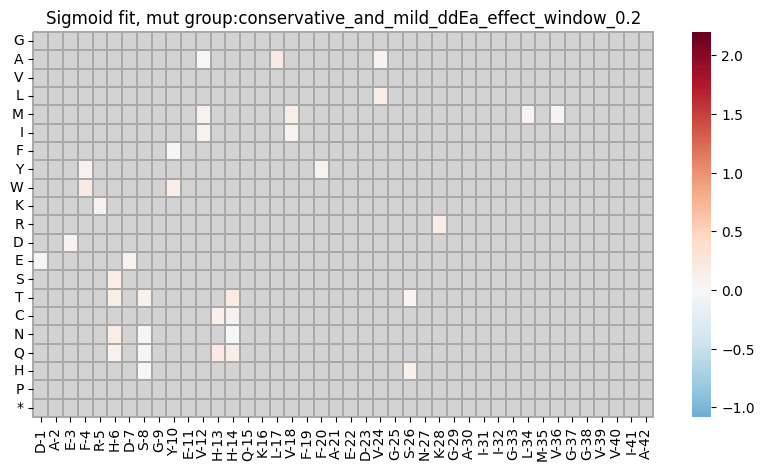

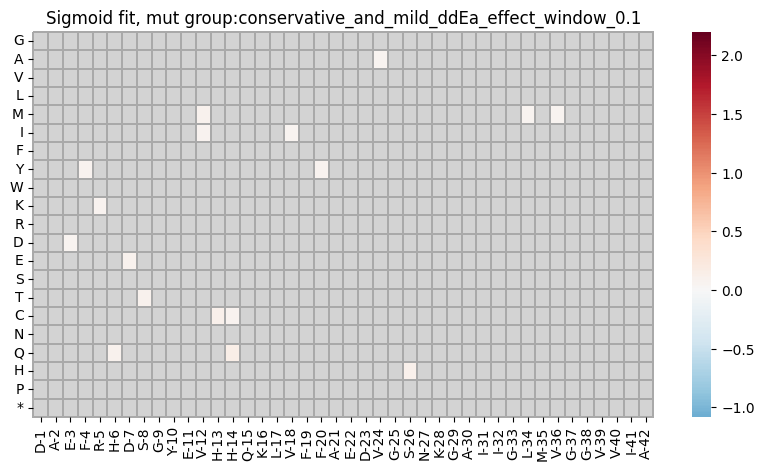

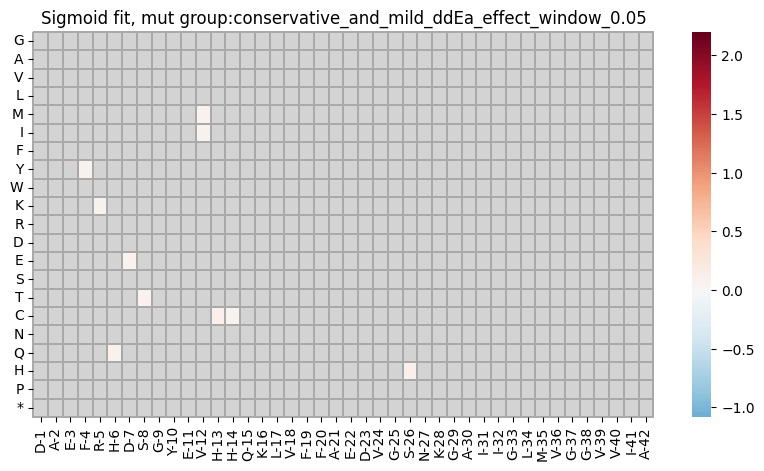

In [38]:
for group in mutation_groups:
    #print(group)
    fig = plt.figure(figsize=(10, 5))
    sns.heatmap(overlay_dfs[group], cmap=cmap_universal, 
                vmin = ddE_df_mean_kcalmol.fillna(0, inplace=False).to_numpy().min(),
                vmax = ddE_df_mean_kcalmol.fillna(0, inplace=False).to_numpy().max(),
                mask=mask_overlay_dfs[group],
                linewidths=0.005, linecolor='darkgrey', clip_on=False,
                center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Sigmoid fit, mut group:' + group)

## Load in FoldX results on the following structures of Ab42:

- 2nao
- 5kk3
- 5oqv
- 7q4b
- 7q4m
- 8ezd
- 8eze

In [39]:
# files with ddGs inferred by FoldX

foldX_runs = ['2nao', # 2 x 3-mer, others are 2 x 4-mers
              '5kk3',
              '5oqv',
              '7q4b',
              '7q4m',
              '8ezd',
              '8eze'
              
             ]
workdir = '/lustre/scratch126/gengen/projects/amyloid_beta_epistasis/Phi_analysis/Double_4_stack_filament_analysis/'

difs = {}
difs_average = {}

# to generate the files below, went and duplicated the original (Dif or Average) files out of FoldX
# and manually deleted the first few lines that are unreadable for pandas
for run in foldX_runs:
    
    print(run)
    
    if run == '2nao':
        curr_path = workdir + run + '/20240416_run_foldx5_all_possible_Ab_mutations_' + run + '_3_stack_double/'
        
        difs[run] = pd.read_csv(curr_path + 'Dif_' + run + '_3_stack_double_Repair_for_pandas.fxout',
                           sep = '\t')
        difs_average[run] = pd.read_csv(curr_path + 'Average_' + run + '_3_stack_double_Repair_for_pandas.fxout',
                           sep = '\t')
        
    else:
        curr_path = workdir + run + '/20240416_run_foldx5_all_possible_Ab_mutations_' + run + '_4_stack_double/'
        
        difs[run] = pd.read_csv(curr_path + 'Dif_' + run + '_4_stack_double_Repair_for_pandas.fxout',
                               sep = '\t')
        difs_average[run] = pd.read_csv(curr_path + 'Average_' + run + '_4_stack_double_Repair_for_pandas.fxout',
                               sep = '\t')


2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [40]:
# generating a list of all possible mutations for 7q4b and 7q4m

AB_WT = 'DAEFRHDSGYEVHHQKLVFFAEDVGSNKGAIIGLMVGGVVIA'

all_aa = ['G','A','V','L','M','I','F','Y','W','K','R','D','E','S','T','C','N','Q','H','P']

# mutations introduced
mutations = {}
mutations['2beg'] = []
mutations['2mxu'] = []
mutations['2nao'] = []
mutations['5kk3'] = []
mutations['5oqv'] = []
mutations['7q4b'] = []
mutations['7q4m'] = []
mutations['8ezd'] = []
mutations['8eze'] = []

# positions for which structural information is available
pos_available = {}
pos_available['2beg'] = [i for i in range(16,42)] # from pos 17 to 42, here enumerated from 0
pos_available['2mxu'] = [i for i in range(10,42)] # from pos 11 to 42, here enumerated from 0
pos_available['2nao'] = [i for i in range(0,42)] # from pos 1 to 42, here enumerated from 0
pos_available['5kk3'] = [i for i in range(10,42)] # from pos 11 to 42, here enumerated from 0
pos_available['5oqv'] = [i for i in range(0,42)] # from pos 1 to 42, here enumerated from 0
pos_available['7q4b'] = [i for i in range(8,42)] # from pos 9 to 42, here enumerated from 0
pos_available['7q4m'] = [i for i in range(11,42)] # from pos 12 to 42, here enumerated from 0
pos_available['8ezd'] = [i for i in range(11,42)] # from pos 12 to 42, here enumerated from 0
pos_available['8eze'] = [i for i in range(0,42)] # from pos 1 to 42, here enumerated from 0



for run in foldX_runs:
    print(run)
    
    for pos in pos_available[run]:
        #print(pos)
        curr_Ab_wt_aa = AB_WT[pos]
        curr_prefix = curr_Ab_wt_aa + str(pos+1)
        
        for aa in all_aa:
            if curr_Ab_wt_aa != aa:
                #print('curr_Ab_wt_aa', curr_Ab_wt_aa)
                #print('curr_prefix', curr_prefix)
                mutations[run].append(curr_prefix + aa)
                #print(len(mutations[run]))
    #print(len(mutations[run]))

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [41]:
# should be 42 (avail pos in structure) x 19
len(mutations['2nao']) == 42*19

True

In [42]:
# should be 32 (avail pos in structure) x 19
len(mutations['5kk3']) == 32*19

True

In [43]:
# should be 42 (avail pos in structure) x 19
len(mutations['5oqv']) == 42*19

True

In [44]:
# should be 34 (avail pos in structure) x 19
len(mutations['7q4b']) == 34*19

True

In [45]:
# should be 31 (avail pos in structure) x 19
len(mutations['7q4m']) == 31*19

True

In [46]:
# should be 42 (avail pos in structure) x 19
len(mutations['8ezd']) == 31*19

True

In [47]:
# should be 42 (avail pos in structure) x 19
len(mutations['8eze']) == 42*19

True

In [48]:
for run in foldX_runs:
    difs[run]['mutation'] = mutations[run]    
    difs[run]['mutated_pos'] = [mutation[0] + '-' + mutation[1:-1] for mutation in list(difs[run]['mutation'])]
    difs[run]['new_aa'] = [mutation[-1] for mutation in list(difs[run]['mutation'])]
    
    # IMPORTANT: divide by 6 (for 2nao) or 8 (for the rest) to obtain per monomer scores in kcal/mol (FoldX output is in kcal/mol)
    
    if run == '2nao':
        difs[run]['ddG_per_monomer'] = difs[run]['total energy'] / 6
    else:
        difs[run]['ddG_per_monomer'] = difs[run]['total energy'] / 8

In [49]:
difs['2nao']

,Pdb,total energy,Backbone Hbond,Sidechain Hbond,Van der Waals,Electrostatics,Solvation Polar,Solvation Hydrophobic,Van der Waals clashes,entropy sidechain,entropy mainchain,sloop_entropy,mloop_entropy,cis_bond,torsional clash,backbone clash,helix dipole,water bridge,disulfide,electrostatic kon,partial covalent bonds,energy Ionisation,Entropy Complex,mutation,mutated_pos,new_aa,ddG_per_monomer
0,2nao_3_stack_double_Repair_1.pdb,-2.320820,0.021104,0.000000e+00,0.962164,-1.360740,-2.58101,0.993816,1.421090e-14,0.411063,-0.467760,0,0,0,0.000368,-0.020360,0,0,0.0,-2.998320e-01,0,-1.953990e-14,0,D1G,D-1,G,-0.386803
1,2nao_3_stack_double_Repair_2.pdb,-2.134620,0.169463,-3.676570e-01,0.524531,-0.475261,-1.84659,0.278949,-7.125470e-05,-0.140653,-0.002616,0,0,0,-0.103300,-0.039198,0,0,0.0,-1.714150e-01,0,1.794120e-13,0,D1A,D-1,A,-0.355770
2,2nao_3_stack_double_Repair_3.pdb,-1.894240,-0.027566,7.034370e-13,-1.944280,-1.483270,2.33470,-3.007430,-1.563190e-13,1.786470,0.842919,0,0,0,0.048648,0.098679,0,0,0.0,-4.444300e-01,0,1.794120e-13,0,D1V,D-1,V,-0.315707
3,2nao_3_stack_double_Repair_4.pdb,-4.624380,-0.064424,-6.433100e-01,-4.665330,-1.876800,4.84842,-7.821620,4.774070e-03,5.011310,0.947471,0,0,0,0.165330,0.161307,0,0,0.0,-5.302080e-01,0,1.634250e-13,0,D1L,D-1,L,-0.770730
4,2nao_3_stack_double_Repair_5.pdb,-6.220730,-0.208419,0.000000e+00,-7.820970,-1.147650,7.26668,-11.765700,1.148600e-01,6.072000,1.585440,0,0,0,0.042034,0.186268,0,0,0.0,-3.589510e-01,0,0.000000e+00,0,D1M,D-1,M,-1.036788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
793,2nao_3_stack_double_Repair_794.pdb,0.942017,-0.036402,0.000000e+00,-1.354680,0.095819,2.20932,-1.503070,-4.502840e-03,1.343790,0.191941,0,0,0,-0.000208,0.370977,0,0,0.0,0.000000e+00,0,0.000000e+00,0,A42C,A-42,C,0.157003
794,2nao_3_stack_double_Repair_795.pdb,0.763301,-0.053253,-4.432950e+00,-1.088670,0.097028,3.22742,-1.022010,-4.543060e-03,3.727000,0.279517,0,0,0,0.033775,0.413174,0,0,0.0,0.000000e+00,0,0.000000e+00,0,A42N,A-42,N,0.127217
795,2nao_3_stack_double_Repair_796.pdb,-0.415076,-0.818606,-1.916880e+00,-2.450740,0.120868,4.48337,-3.134930,-3.479300e-03,3.134960,0.116015,0,0,0,0.054339,0.552310,0,0,0.0,0.000000e+00,0,0.000000e+00,0,A42Q,A-42,Q,-0.069179
796,2nao_3_stack_double_Repair_797.pdb,0.597685,-0.285676,0.000000e+00,-2.933930,-0.470192,5.14528,-3.444090,-4.543060e-03,1.819990,0.492145,0,0,0,0.024506,0.584568,0,0,0.0,-4.472970e-01,0,7.014950e-01,0,A42H,A-42,H,0.099614


In [50]:
# read in single filament ddG values to correlate

difs_single_filament = {}

for run in foldX_runs:
    difs_single_filament[run] = pd.read_csv('/lustre/scratch126/gengen/projects/amyloid_beta_epistasis/Phi_analysis/Single_4_stack_filament_analysis/files/20240418_FoldX_difs_parsed_ddG_' + run + '_single_filament_analysis.csv',
                                      index_col=0)
    

In [51]:
for run in foldX_runs:
    print(run)
    
    print('len(difs_single_filament[run]):', len(difs_single_filament[run]))
    print('len(difs[run]):', len(difs[run]))
    
    print(len(set(difs_single_filament[run]['mutation']) & set(difs[run]['mutation'])))
    
    print(list(difs_single_filament[run]['mutation']) == list(difs[run]['mutation']))
    
    print()

2nao
len(difs_single_filament[run]): 798
len(difs[run]): 798
798
True

5kk3
len(difs_single_filament[run]): 608
len(difs[run]): 608
608
True

5oqv
len(difs_single_filament[run]): 798
len(difs[run]): 798
798
True

7q4b
len(difs_single_filament[run]): 646
len(difs[run]): 646
646
True

7q4m
len(difs_single_filament[run]): 589
len(difs[run]): 589
589
True

8ezd
len(difs_single_filament[run]): 589
len(difs[run]): 589
589
True

8eze
len(difs_single_filament[run]): 798
len(difs[run]): 798
798
True



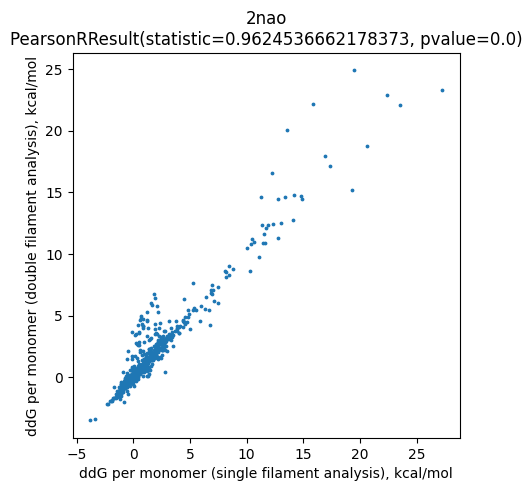

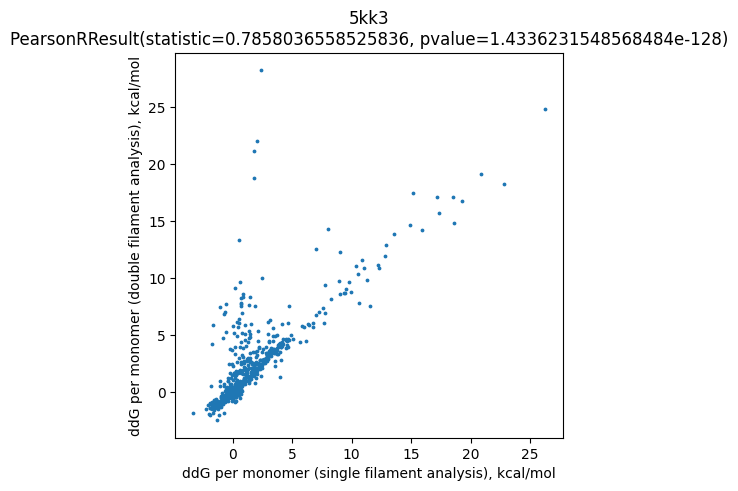

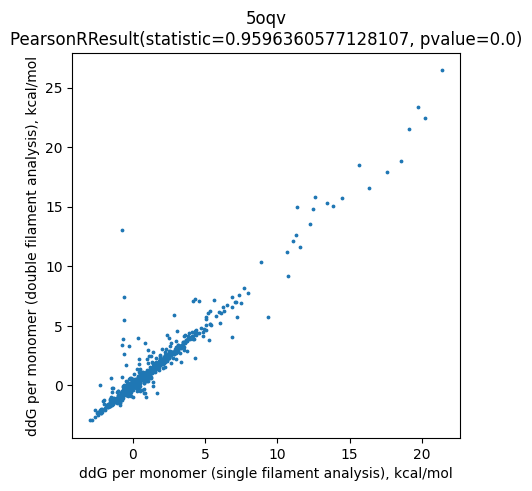

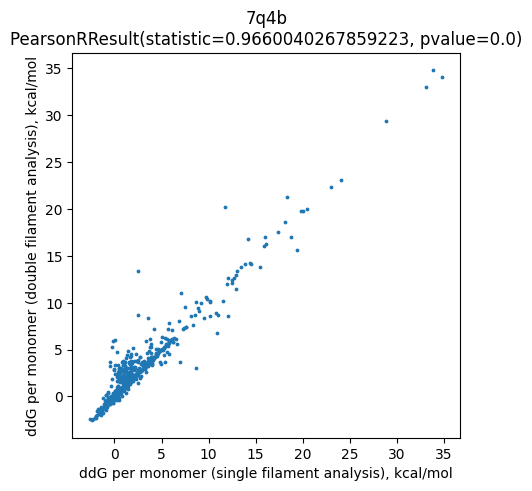

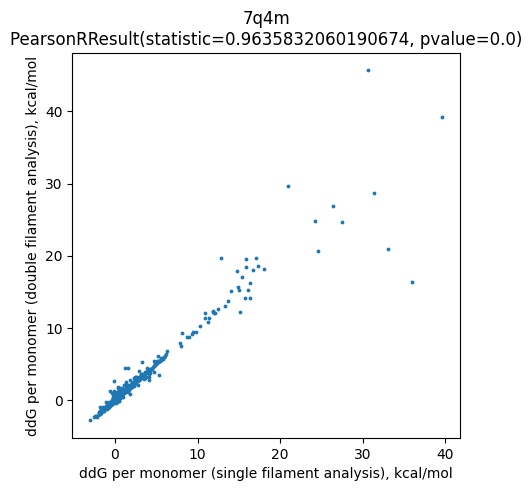

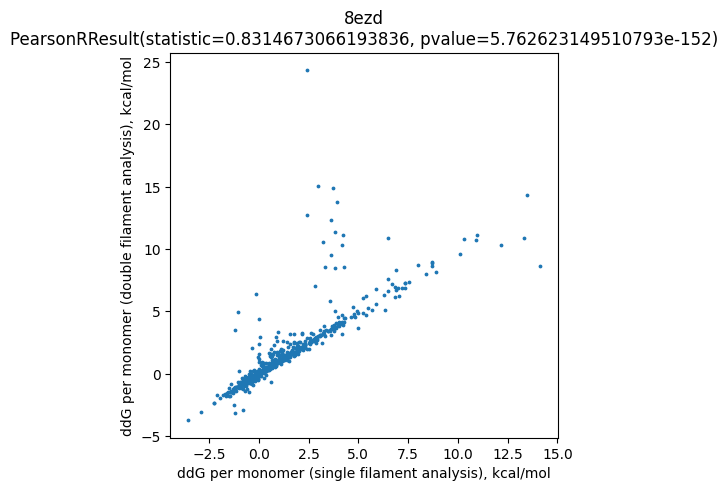

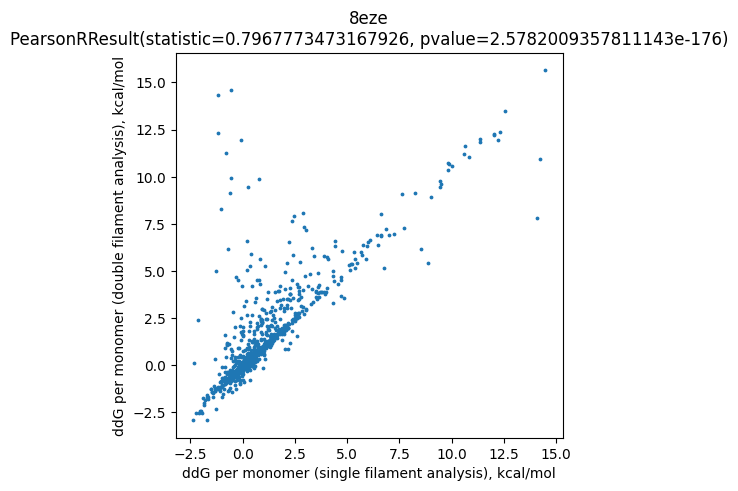

In [52]:
for run in foldX_runs:
    curr_ddGs_single_filament = difs_single_filament[run]['ddG_per_monomer']
    curr_ddGs_doulbe_filament = difs[run]['ddG_per_monomer']

    fig, ax = plt.subplots(figsize=(5,5))
    ax.scatter(curr_ddGs_single_filament, curr_ddGs_doulbe_filament, s=3)

    #plt.axline((0, 0), (1, 1), linewidth=1, color='r')

    plt.xlabel('ddG per monomer (single filament analysis), kcal/mol')
    plt.ylabel('ddG per monomer (double filament analysis), kcal/mol')

    plt.title(run + '\n' + str(scipy.stats.pearsonr(curr_ddGs_single_filament, curr_ddGs_doulbe_filament)))


In [53]:
AB_WT

'DAEFRHDSGYEVHHQKLVFFAEDVGSNKGAIIGLMVGGVVIA'

In [54]:
# arranged Ab positions

Ab_positions = {}

for run in foldX_runs:
    print(run)
    
    curr_part_of_AB_WT = AB_WT[pos_available[run][0]:pos_available[run][-1]+1]
    
    #print('last pos here', pos_available[run][-1])
    #print('curr_part_of_AB_WT', curr_part_of_AB_WT)
    
    Ab_positions[run] = [AB_WT_aa + '-' + str(pos+1) for AB_WT_aa,pos in zip(curr_part_of_AB_WT, pos_available[run])]

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [55]:
dfs_to_plot = {}

for run in foldX_runs:
    dfs_to_plot[run] = pd.DataFrame(index = all_aa, columns = Ab_positions[run])
    
    for new_aa in list(dfs_to_plot[run].index):
        #print(new_aa)
        for mutated_pos in list(dfs_to_plot[run].columns):
            #print(mutated_pos)
            curr_dif_subset = difs[run][(difs[run]['mutated_pos'] == mutated_pos) & (difs[run]['new_aa'] == new_aa)]
            
            #print(curr_dif_subset['total energy'])
            if len(curr_dif_subset) > 0:
                dfs_to_plot[run].loc[new_aa,mutated_pos] = float(list(curr_dif_subset['ddG_per_monomer'])[0])
            #else:
                #dfs_to_plot[run].loc[new_aa,mutated_pos] = np.nan
                
    dfs_to_plot[run] = dfs_to_plot[run].astype(float)

In [56]:
np.unique(difs['2nao']['mutated_pos'])

array(['A-2', 'A-21', 'A-30', 'A-42', 'D-1', 'D-23', 'D-7', 'E-11',
       'E-22', 'E-3', 'F-19', 'F-20', 'F-4', 'G-25', 'G-29', 'G-33',
       'G-37', 'G-38', 'G-9', 'H-13', 'H-14', 'H-6', 'I-31', 'I-32',
       'I-41', 'K-16', 'K-28', 'L-17', 'L-34', 'M-35', 'N-27', 'Q-15',
       'R-5', 'S-26', 'S-8', 'V-12', 'V-18', 'V-24', 'V-36', 'V-39',
       'V-40', 'Y-10'], dtype=object)

In [57]:
cmaps_ddG = {}
masks_ddG = {}

for run in foldX_runs:
    masks_ddG[run] = dfs_to_plot[run].isnull()

    cmaps_ddG[run] = matplotlib.colormaps.get('RdBu_r')
    cmaps_ddG[run].set_bad("lightgrey")

In [58]:
foldX_runs

['2nao', '5kk3', '5oqv', '7q4b', '7q4m', '8ezd', '8eze']

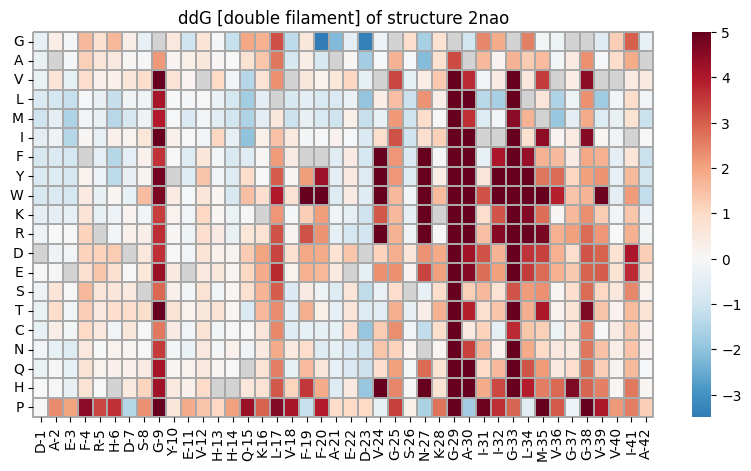

In [59]:
run = '2nao'
fig = plt.figure(figsize=(10, 5))
sns.heatmap(dfs_to_plot[run], cmap=cmaps_ddG[run], 
            #vmin = np.quantile(values[run], 0.05),
            vmax = 5,
            mask=masks_ddG[run],
            linewidths=0.01, linecolor='darkgrey', clip_on=False,
            center=0
           )
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('ddG [double filament] of structure ' + run)

plt.savefig('./figures/20240509_ddG_predictions_double_filament_structure_' + run + '.pdf',
           bbox_inches = 'tight')

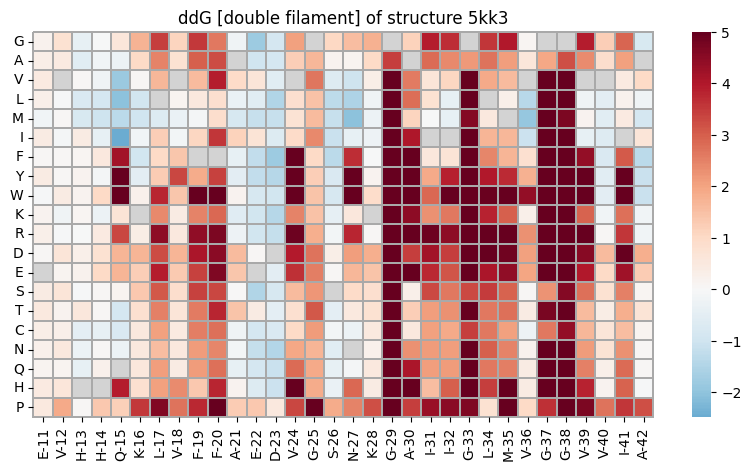

In [58]:
run = '5kk3'
fig = plt.figure(figsize=(10, 5))
sns.heatmap(dfs_to_plot[run], cmap=cmaps_ddG[run], 
            #vmin = np.quantile(values[run], 0.05),
            vmax = 5,
            mask=masks_ddG[run],
            linewidths=0.01, linecolor='darkgrey', clip_on=False,
            center=0
           )
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('ddG [double filament] of structure ' + run)

plt.savefig('./figures/20240509_ddG_predictions_double_filament_structure_' + run + '.pdf',
           bbox_inches = 'tight')

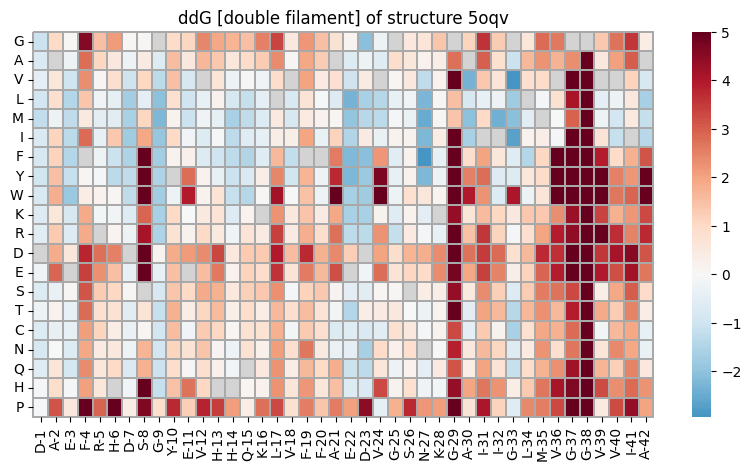

In [59]:
run = '5oqv'
fig = plt.figure(figsize=(10, 5))
sns.heatmap(dfs_to_plot[run], cmap=cmaps_ddG[run], 
            #vmin = np.quantile(values[run], 0.05),
            vmax = 5,
            mask=masks_ddG[run],
            linewidths=0.01, linecolor='darkgrey', clip_on=False,
            center=0
           )
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('ddG [double filament] of structure ' + run)

plt.savefig('./figures/20240509_ddG_predictions_double_filament_structure_' + run + '.pdf',
           bbox_inches = 'tight')

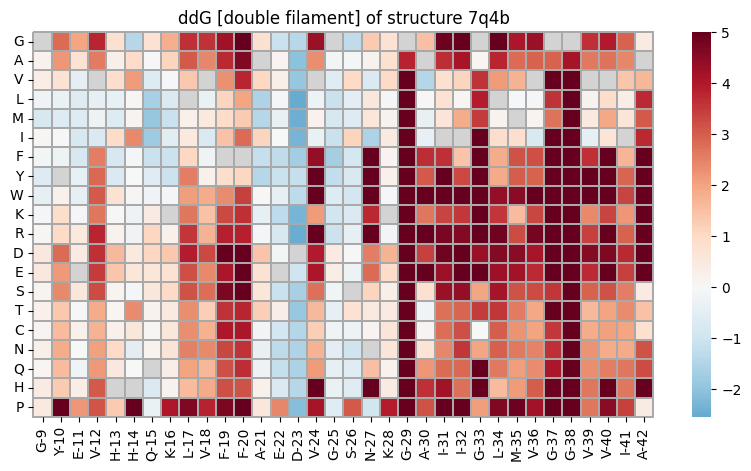

In [60]:
run = '7q4b'
fig = plt.figure(figsize=(10, 5))
sns.heatmap(dfs_to_plot[run], cmap=cmaps_ddG[run], 
            #vmin = np.quantile(values[run], 0.05),
            vmax = 5,
            mask=masks_ddG[run],
            linewidths=0.01, linecolor='darkgrey', clip_on=False,
            center=0
           )
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('ddG [double filament] of structure ' + run)

plt.savefig('./figures/20240509_ddG_predictions_double_filament_structure_' + run + '.pdf',
           bbox_inches = 'tight')

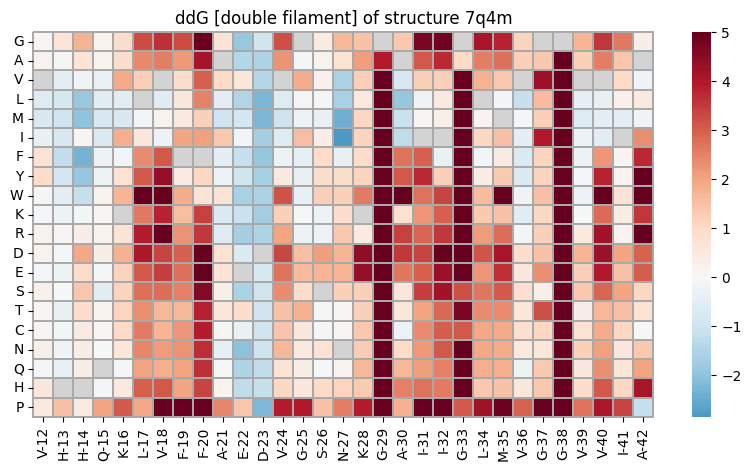

In [61]:
run = '7q4m'
fig = plt.figure(figsize=(10, 5))
sns.heatmap(dfs_to_plot[run], cmap=cmaps_ddG[run], 
            #vmin = np.quantile(values[run], 0.05),
            vmax = 5,
            mask=masks_ddG[run],
            linewidths=0.01, linecolor='darkgrey', clip_on=False,
            center=0
           )
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('ddG [double filament] of structure ' + run)

plt.savefig('./figures/20240509_ddG_predictions_double_filament_structure_' + run + '.pdf',
           bbox_inches = 'tight')

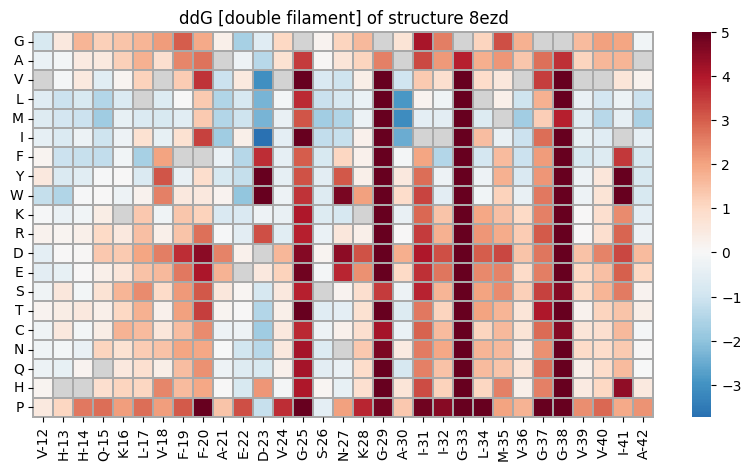

In [62]:
run = '8ezd'
fig = plt.figure(figsize=(10, 5))
sns.heatmap(dfs_to_plot[run], cmap=cmaps_ddG[run], 
            #vmin = np.quantile(values[run], 0.05),
            vmax = 5,
            mask=masks_ddG[run],
            linewidths=0.01, linecolor='darkgrey', clip_on=False,
            center=0
           )
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('ddG [double filament] of structure ' + run)

plt.savefig('./figures/20240509_ddG_predictions_double_filament_structure_' + run + '.pdf',
           bbox_inches = 'tight')

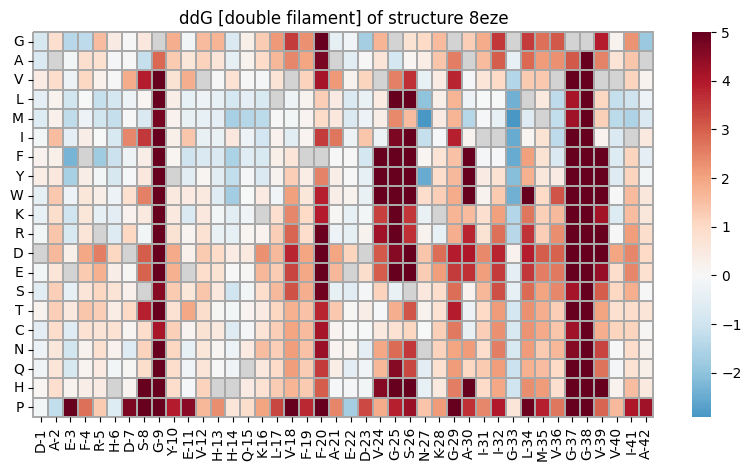

In [63]:
run = '8eze'
fig = plt.figure(figsize=(10, 5))
sns.heatmap(dfs_to_plot[run], cmap=cmaps_ddG[run], 
            #vmin = np.quantile(values[run], 0.05),
            vmax = 5,
            mask=masks_ddG[run],
            linewidths=0.01, linecolor='darkgrey', clip_on=False,
            center=0
           )
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('ddG [double filament] of structure ' + run)

plt.savefig('./figures/20240509_ddG_predictions_double_filament_structure_' + run + '.pdf',
           bbox_inches = 'tight')

# Calculate phi values only for the different groups of mutations

In [59]:
weights_Nucleation.columns

Index(['id', 'id_ref', 'Pos', 'Pos_ref', 'fold_1', 'fold_2', 'fold_3',
       'fold_4', 'fold_5', 'fold_6', 'fold_7', 'fold_8', 'fold_9', 'fold_10',
       'n', 'mean', 'std', 'ci95', 'trait_name', 'mean_kcal/mol',
       'std_kcal/mol', 'ci95_kcal/mol', 'conservative', 'all', 'ddEa',
       'mild_ddEa_effect_window_1.5', 'mild_ddEa_effect_window_1',
       'mild_ddEa_effect_window_0.5', 'mild_ddEa_effect_window_0.2',
       'mild_ddEa_effect_window_0.1', 'mild_ddEa_effect_window_0.05',
       'conservative_and_mild_ddEa_effect_window_1.5',
       'conservative_and_mild_ddEa_effect_window_1',
       'conservative_and_mild_ddEa_effect_window_0.5',
       'conservative_and_mild_ddEa_effect_window_0.2',
       'conservative_and_mild_ddEa_effect_window_0.1',
       'conservative_and_mild_ddEa_effect_window_0.05'],
      dtype='object')

In [60]:
common_mutations = {}

ddEa_mochi_common_vars = {}
ddG_FoldX_common_vars_capped = {} # capped at value supplied below
ddG_VDW_clashes = {}
FoldX_cap = 1000 # 100+ is not capped basically

for run in foldX_runs:
    print(run)
    
    common_mutations[run] = {}
    ddEa_mochi_common_vars[run] = {}
    ddG_FoldX_common_vars_capped[run] = {}
    ddG_VDW_clashes[run] = {}

    for group in mutation_groups:
        print(group)
        curr_weights_subset = weights_Nucleation[weights_Nucleation[group] == 1]

        common_mutations[run][group] = list(set(curr_weights_subset['id']) & set(difs[run]['mutation']))
        print(len(common_mutations[run][group]), 'common mutations b/w doubles datasets subset (mutation group: ' + group + ') and FoldX ones for ' + run + ' \n')

        ddEa_mochi_common_vars[run][group] = [elem for elem in list(weights_Nucleation.set_index('id', inplace=False).loc[common_mutations[run][group], 'ddEa'])]
        # this is for 4 monomers together as a stack
        ddG_FoldX_common_vars_capped[run][group] = list(difs[run].set_index('mutation', inplace=False).loc[common_mutations[run][group], 'ddG_per_monomer'])
        ddG_FoldX_common_vars_capped[run][group] = [elem if elem < FoldX_cap else FoldX_cap for elem in ddG_FoldX_common_vars_capped[run][group]]
        
        ddG_VDW_clashes[run][group] = list(difs[run].set_index('mutation', inplace=False).loc[common_mutations[run][group], 'Van der Waals clashes'])

        # translating to ddG per monomer (ddG above is already per monomer)
        ddG_VDW_clashes[run][group] = [elem/4 for elem in ddG_VDW_clashes[run][group]]

2nao
all
798 common mutations b/w doubles datasets subset (mutation group: all) and FoldX ones for 2nao 

conservative
116 common mutations b/w doubles datasets subset (mutation group: conservative) and FoldX ones for 2nao 

mild_ddEa_effect_window_1.5
631 common mutations b/w doubles datasets subset (mutation group: mild_ddEa_effect_window_1.5) and FoldX ones for 2nao 

mild_ddEa_effect_window_1
566 common mutations b/w doubles datasets subset (mutation group: mild_ddEa_effect_window_1) and FoldX ones for 2nao 

mild_ddEa_effect_window_0.5
413 common mutations b/w doubles datasets subset (mutation group: mild_ddEa_effect_window_0.5) and FoldX ones for 2nao 

mild_ddEa_effect_window_0.2
200 common mutations b/w doubles datasets subset (mutation group: mild_ddEa_effect_window_0.2) and FoldX ones for 2nao 

mild_ddEa_effect_window_0.1
106 common mutations b/w doubles datasets subset (mutation group: mild_ddEa_effect_window_0.1) and FoldX ones for 2nao 

mild_ddEa_effect_window_0.05
50 co

2nao
5kk3
5oqv
7q4b
7q4m


/tmp/ipykernel_326664/2741029858.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(6,6))


8ezd
8eze


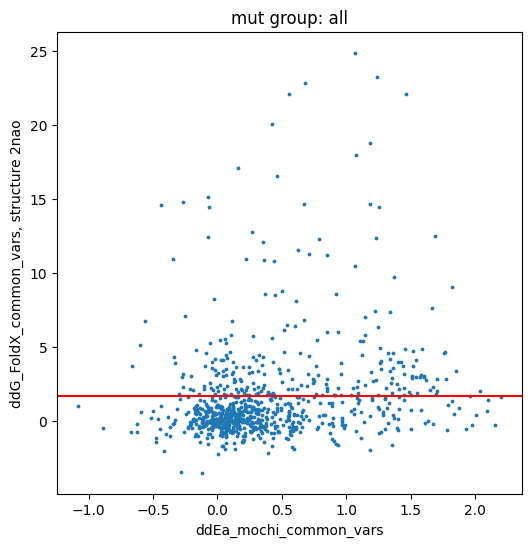

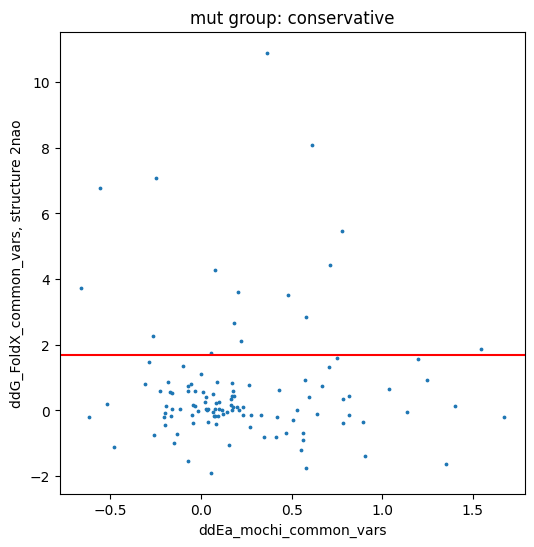

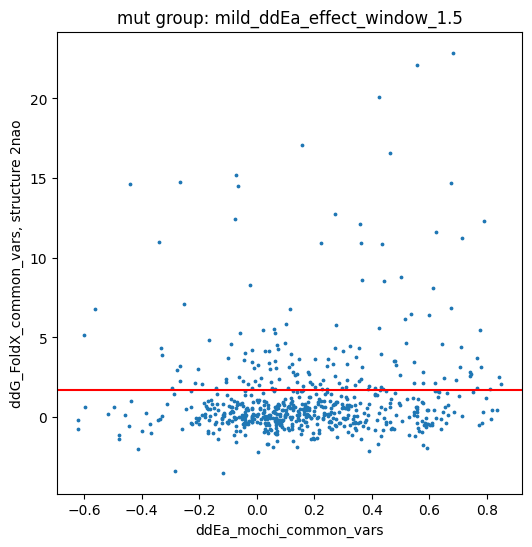

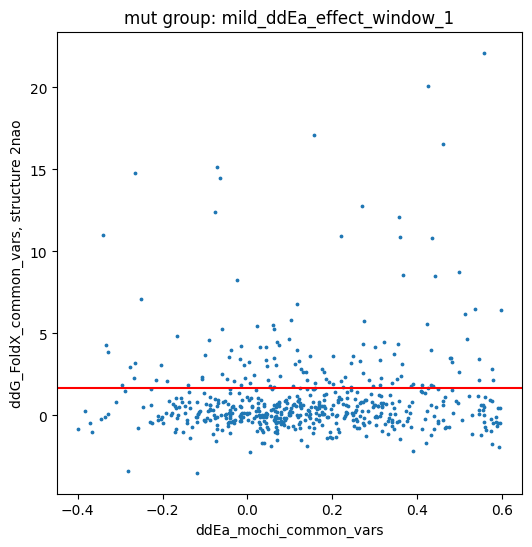

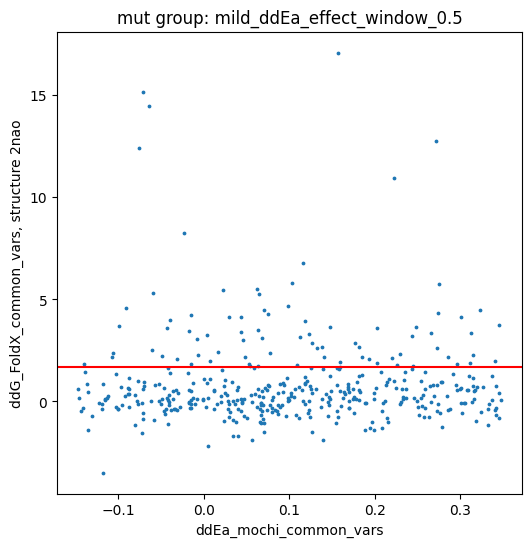

...

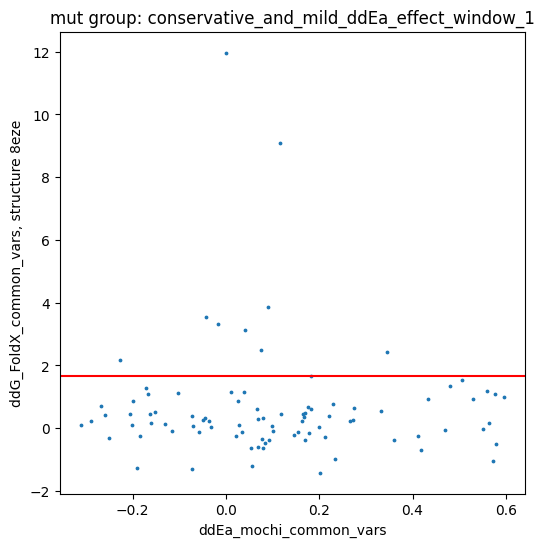

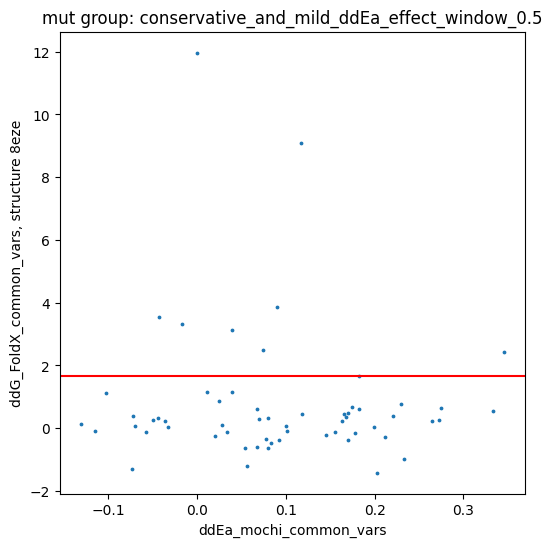

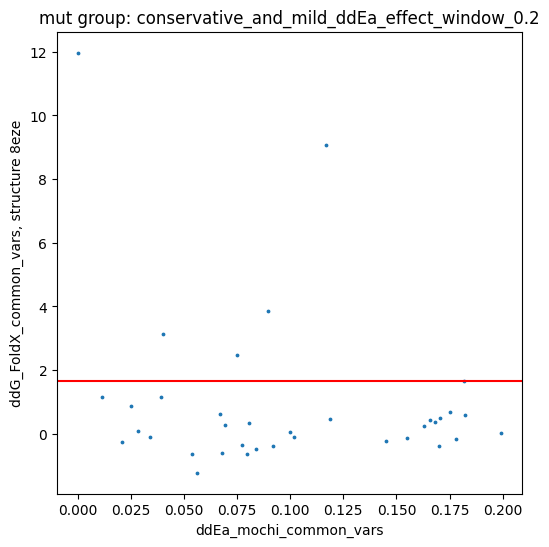

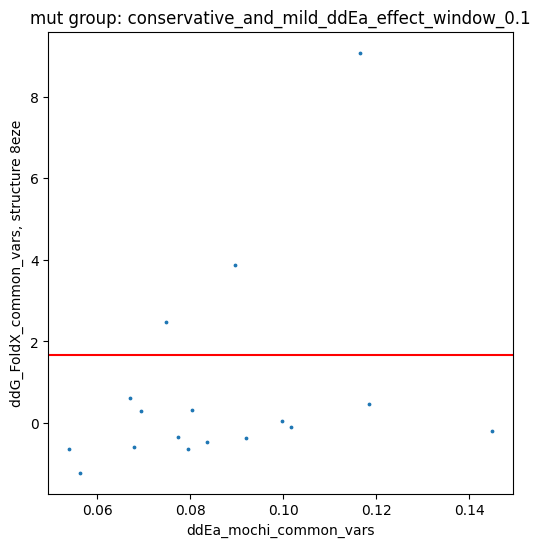

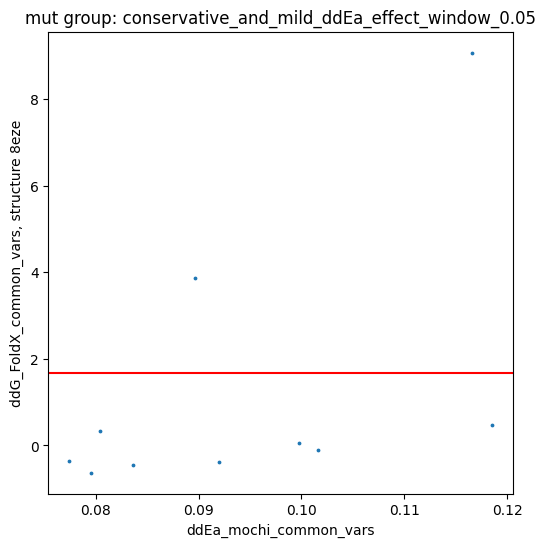

In [61]:
# scatter plot of ddEa vs foldX ddG
# should not correlate per se, just curious 
for run in foldX_runs:
    print(run)
    
    for group in mutation_groups:
        x = ddEa_mochi_common_vars[run][group]
        y = ddG_FoldX_common_vars_capped[run][group]
        
        fig = plt.figure(figsize=(6,6))
    
        plt.scatter(x, y, s=3)
        plt.xlabel('ddEa_mochi_common_vars')
        plt.ylabel('ddG_FoldX_common_vars, structure ' + run)
        plt.title('mut group: ' + group)
        
        plt.axhline(1.67304, color='red')

In [62]:
# without any ddG capping

phi_values = {}

# also classify each mutation into having a phi value base on any possible sign combination
# so +/+, -/-, +/- and -/+

for run in foldX_runs:
    print(run)
    
    phi_values[run] = {}
    
    for group in mutation_groups:
    
        phi_values[run][group] = pd.DataFrame(index = common_mutations[run][group], columns = ['phi_value'])
        # divide the ddG by 4 to get the per-monomer ddG
        phi_values[run][group]['phi_value'] = [ddEa / ddG for ddEa,ddG in zip(ddEa_mochi_common_vars[run][group],
                                                         ddG_FoldX_common_vars_capped[run][group])]
        
        phi_values[run][group]['ddEa'] = [ddEa for ddEa in ddEa_mochi_common_vars[run][group]]
        phi_values[run][group]['ddG'] = [ddG for ddG in ddG_FoldX_common_vars_capped[run][group]]
        phi_values[run][group]['VDW_clashes_from_FoldX'] = [ddG for ddG in ddG_VDW_clashes[run][group]]
        

        phi_values[run][group]['Ab_position'] = [idx[0] + '-' + idx[1:-1] for idx in phi_values[run][group].index]
        phi_values[run][group]['new_aa'] = [idx[-1] for idx in phi_values[run][group].index]
        
        phi_values[run][group]['ddEa_sign'] = ['+' if ddEa > 0 else '-' for ddEa in ddEa_mochi_common_vars[run][group]]
        phi_values[run][group]['ddG_sign'] = ['+' if ddG > 0 else '-' for ddG in ddG_FoldX_common_vars_capped[run][group]]
        phi_values[run][group]['ddEa_sign_ddG_sign'] = [ddEa_sign + '_' + ddG_sign for ddEa_sign,ddG_sign in zip(phi_values[run][group]['ddEa_sign'],
                                                                                                         phi_values[run][group]['ddG_sign'])]
        
        
        

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [63]:
phi_values['2nao']['all']

,phi_value,ddEa,ddG,VDW_clashes_from_FoldX,Ab_position,new_aa,ddEa_sign,ddG_sign,ddEa_sign_ddG_sign
D23G,0.082560,-0.282565,-3.422550,-1.425795,D-23,G,-,-,-_-
I41Y,0.087789,0.140005,1.594795,2.402007,I-41,Y,+,+,+_+
V36G,-3.872223,0.966701,-0.249650,-0.781822,V-36,G,+,-,+_-
A30Y,0.063062,1.182288,18.748000,28.244000,A-30,Y,+,+,+_+
N27S,-2.048821,0.783892,-0.382607,-1.181495,N-27,S,+,-,+_-
...,...,...,...,...,...,...,...,...,...
M35W,0.254815,1.257964,4.936783,4.636900,M-35,W,+,+,+_+
H6F,-0.141273,0.198976,-1.408453,0.168833,H-6,F,+,-,+_-
V24P,-1.662526,0.658310,-0.395970,-0.996892,V-24,P,+,-,+_-
K28M,-17.677642,0.962922,-0.054471,0.024852,K-28,M,+,-,+_-


In [64]:
for run in foldX_runs:
    print(phi_values[run]['all'][phi_values[run]['all']['ddG'] == 0])

Empty DataFrame
Columns: [phi_value, ddEa, ddG, VDW_clashes_from_FoldX, Ab_position, new_aa, ddEa_sign, ddG_sign, ddEa_sign_ddG_sign]
Index: []
Empty DataFrame
Columns: [phi_value, ddEa, ddG, VDW_clashes_from_FoldX, Ab_position, new_aa, ddEa_sign, ddG_sign, ddEa_sign_ddG_sign]
Index: []
Empty DataFrame
Columns: [phi_value, ddEa, ddG, VDW_clashes_from_FoldX, Ab_position, new_aa, ddEa_sign, ddG_sign, ddEa_sign_ddG_sign]
Index: []
Empty DataFrame
Columns: [phi_value, ddEa, ddG, VDW_clashes_from_FoldX, Ab_position, new_aa, ddEa_sign, ddG_sign, ddEa_sign_ddG_sign]
Index: []
Empty DataFrame
Columns: [phi_value, ddEa, ddG, VDW_clashes_from_FoldX, Ab_position, new_aa, ddEa_sign, ddG_sign, ddEa_sign_ddG_sign]
Index: []
Empty DataFrame
Columns: [phi_value, ddEa, ddG, VDW_clashes_from_FoldX, Ab_position, new_aa, ddEa_sign, ddG_sign, ddEa_sign_ddG_sign]
Index: []
Empty DataFrame
Columns: [phi_value, ddEa, ddG, VDW_clashes_from_FoldX, Ab_position, new_aa, ddEa_sign, ddG_sign, ddEa_sign_ddG_sign]
In

In [65]:
Ab_positions_all = [AB_WT[i] + '-' + str(i+1) for i in range(len(AB_WT))]

In [66]:
dfs_to_plot_phi = {}

for run in foldX_runs:
    #print(run)
    dfs_to_plot_phi[run] = {}
    
    for group in mutation_groups:
        #print(group)
        dfs_to_plot_phi[run][group] = pd.DataFrame(index = all_aa, columns = Ab_positions_all)

        for new_aa in list(dfs_to_plot_phi[run][group].index):
            #print(new_aa)
            for mutated_pos in list(dfs_to_plot_phi[run][group].columns):
                    
                #print(mutated_pos)
                curr_phi_subset = phi_values[run][group][(phi_values[run][group]['Ab_position'] == mutated_pos) & (phi_values[run][group]['new_aa'] == new_aa)]
                #print(curr_phi_subset)
                #print(curr_dif_subset['total energy'])
                if len(curr_phi_subset) > 0:
                    dfs_to_plot_phi[run][group].loc[new_aa,mutated_pos] = float(list(curr_phi_subset['phi_value'])[0])
                #else:
                    #dfs_to_plot[run].loc[new_aa,mutated_pos] = np.nan
                    

        dfs_to_plot_phi[run][group] = dfs_to_plot_phi[run][group].astype(float)

In [67]:
cmap_universal = matplotlib.colormaps.get('RdBu_r')
cmap_universal.set_bad("lightgrey")

masks_phi = {}
for run in foldX_runs:
    
    masks_phi[run] = {}
    
    for group in mutation_groups:
        masks_phi[run][group] = dfs_to_plot_phi[run][group].isnull()

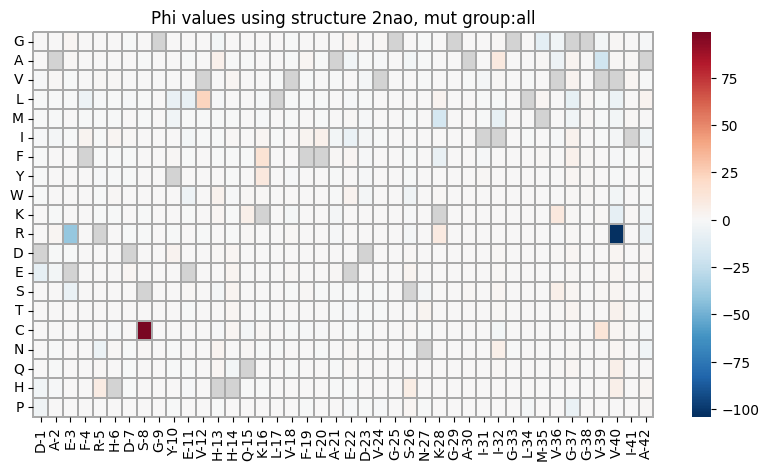

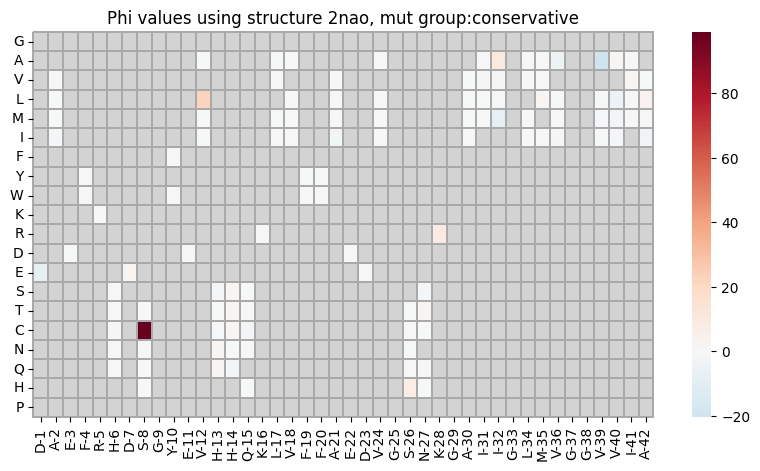

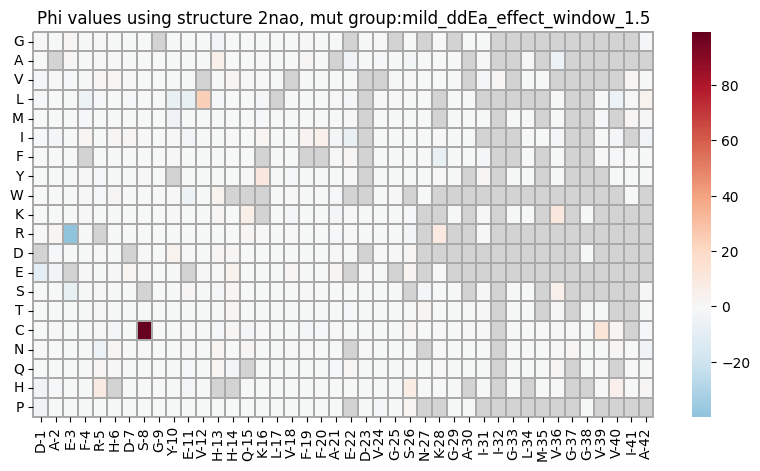

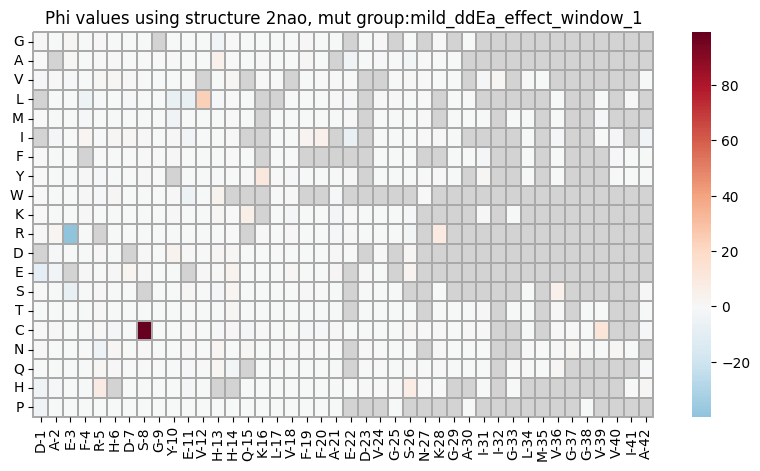

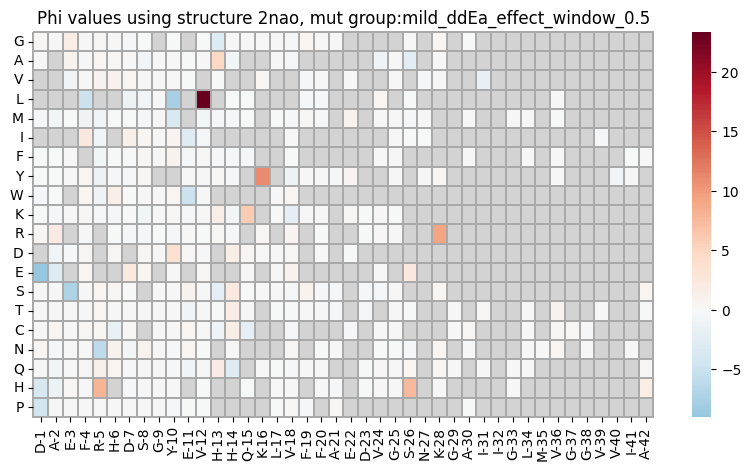

...

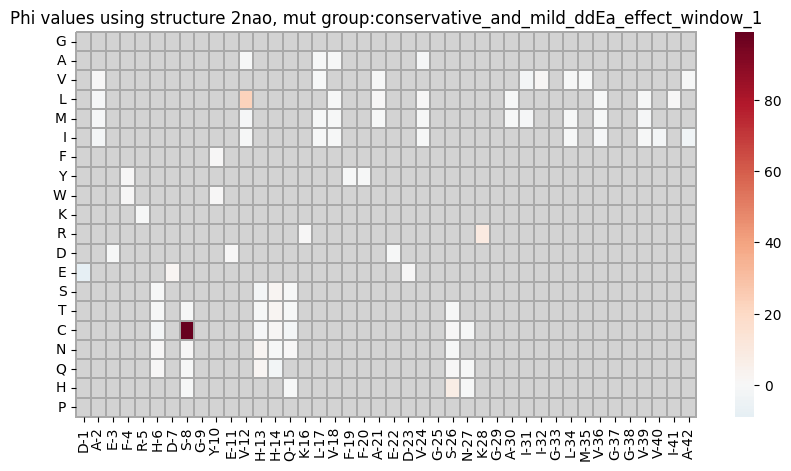

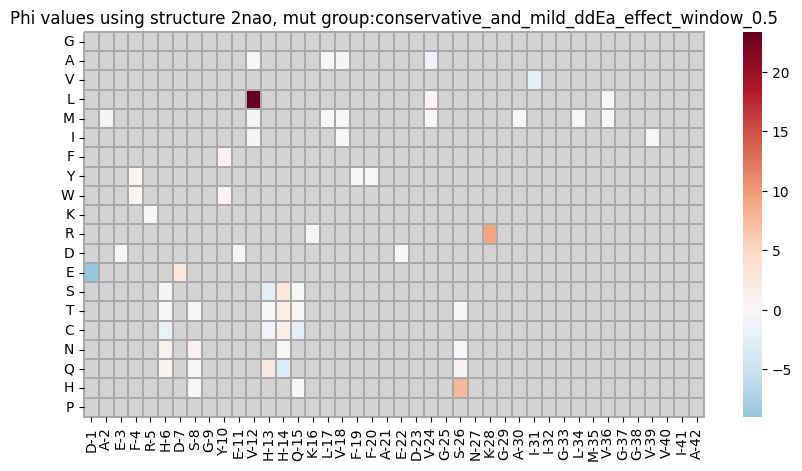

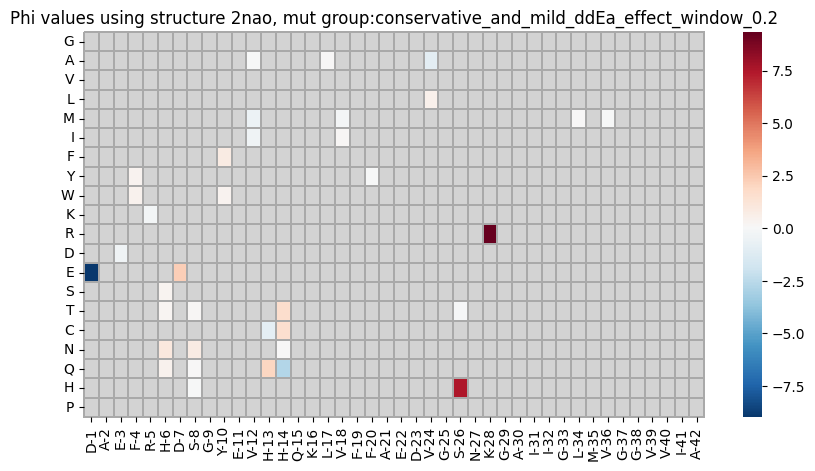

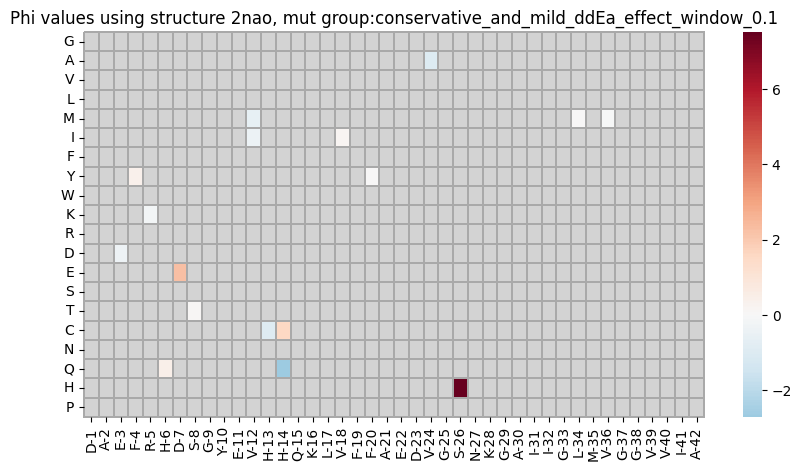

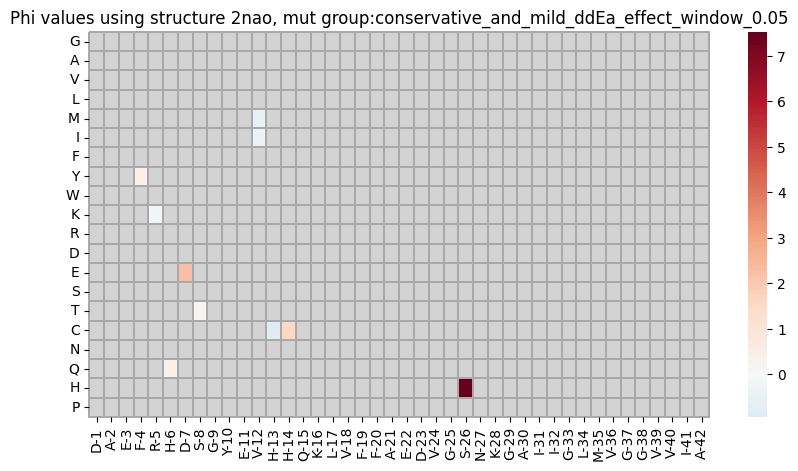

In [69]:
run = '2nao'

for group in mutation_groups:
    #print(group)
    fig = plt.figure(figsize=(10, 5))
    
    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run][group], cmap=cmap_universal, 
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                mask=masks_phi[run][group],
                linewidths=0.005, linecolor='darkgrey', clip_on=False,
                center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values using structure ' + run + ', mut group:' + group)

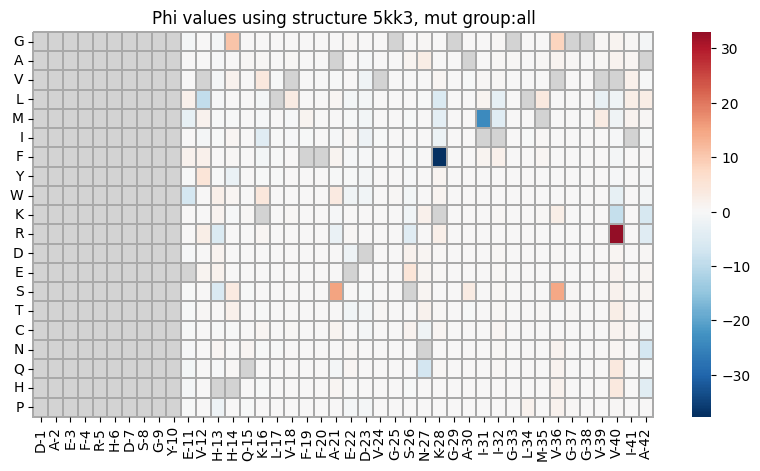

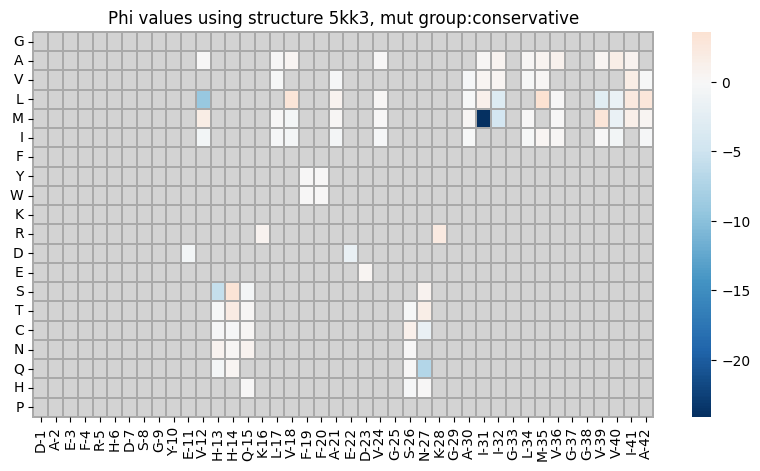

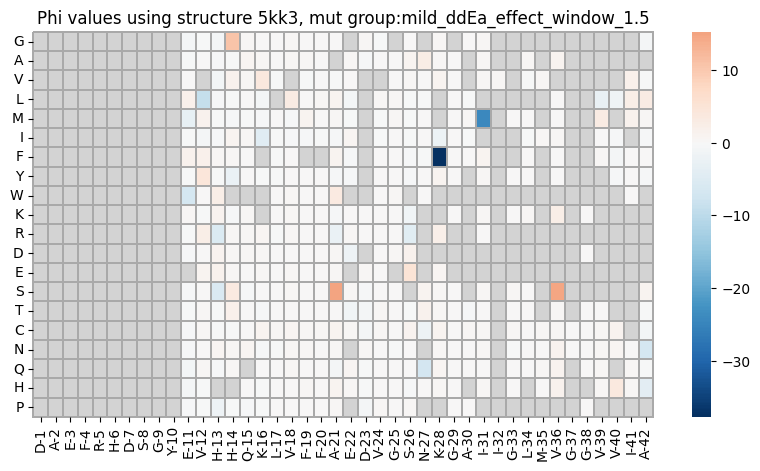

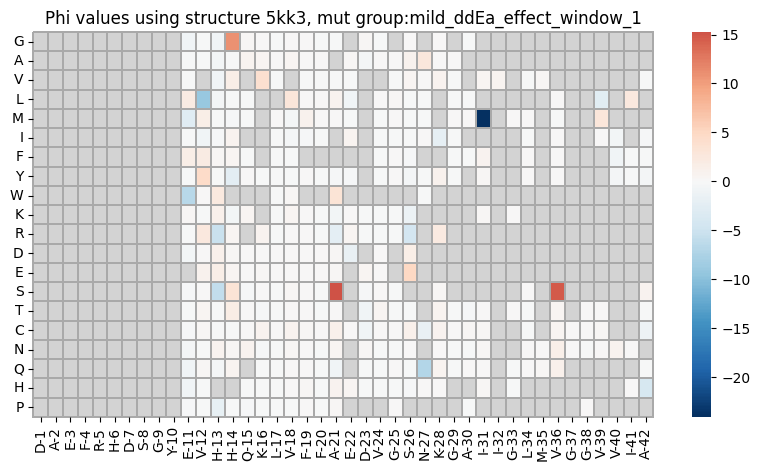

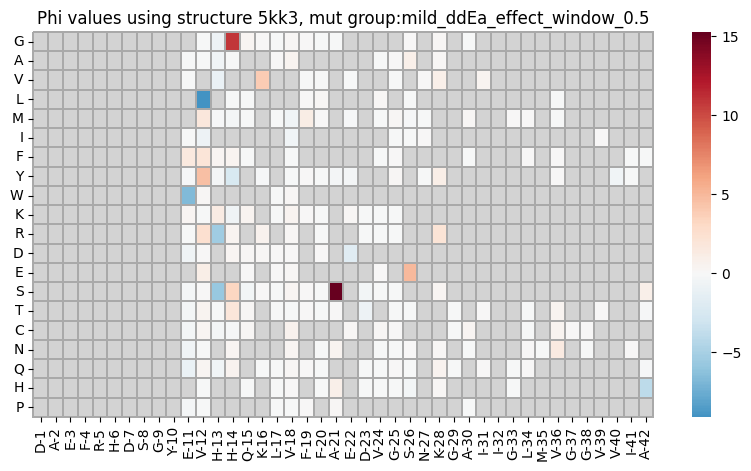

...

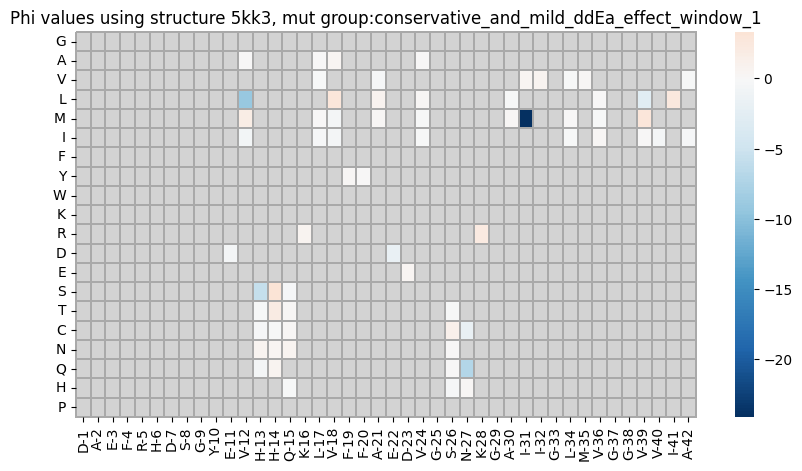

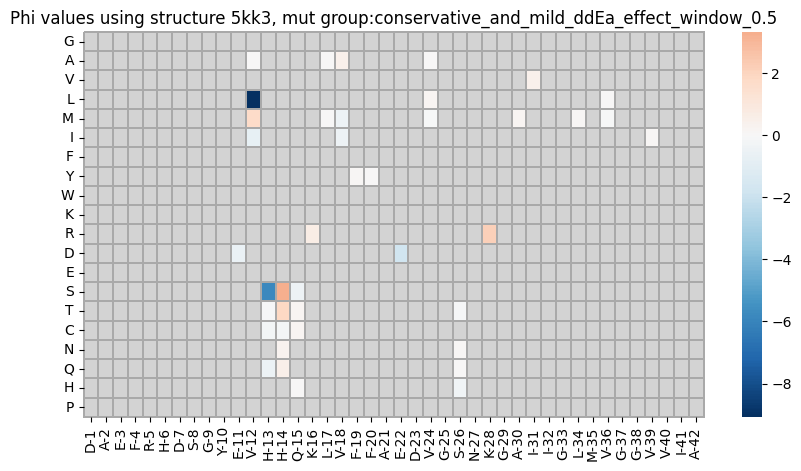

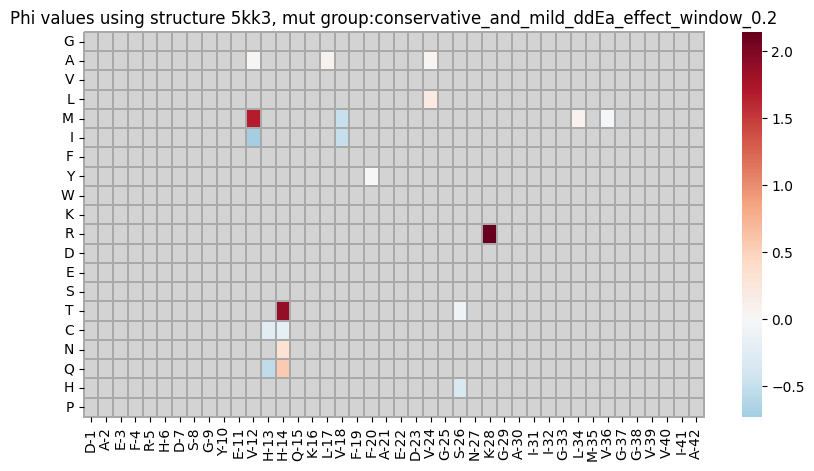

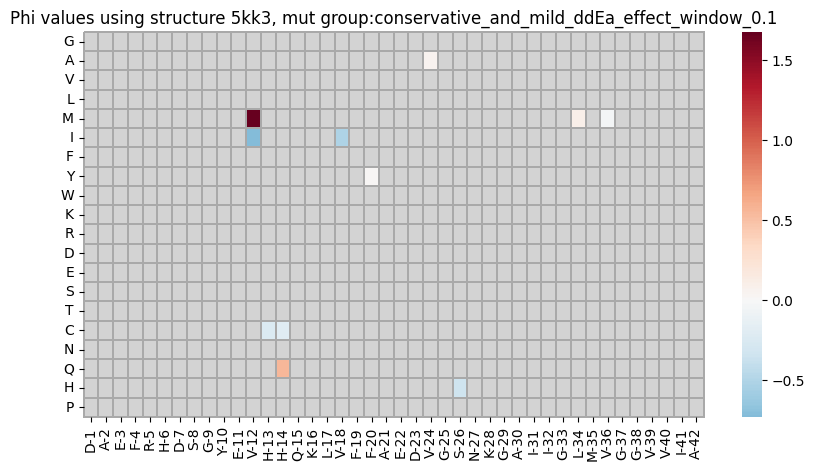

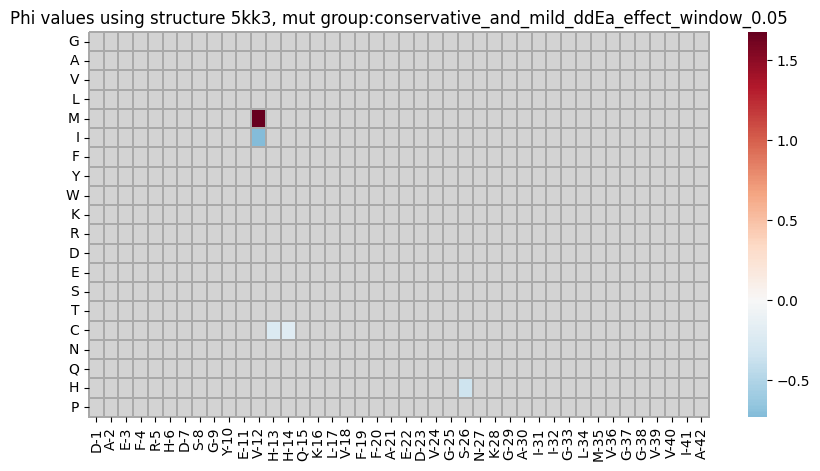

In [74]:
run = '5kk3'

for group in mutation_groups:
    #print(group)
    fig = plt.figure(figsize=(10, 5))
    
    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run][group], cmap=cmap_universal, 
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                mask=masks_phi[run][group],
                linewidths=0.005, linecolor='darkgrey', clip_on=False,
                center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values using structure ' + run + ', mut group:' + group)

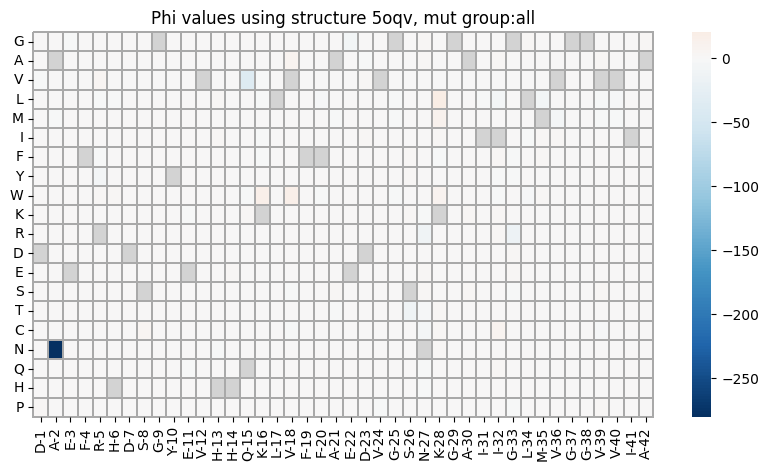

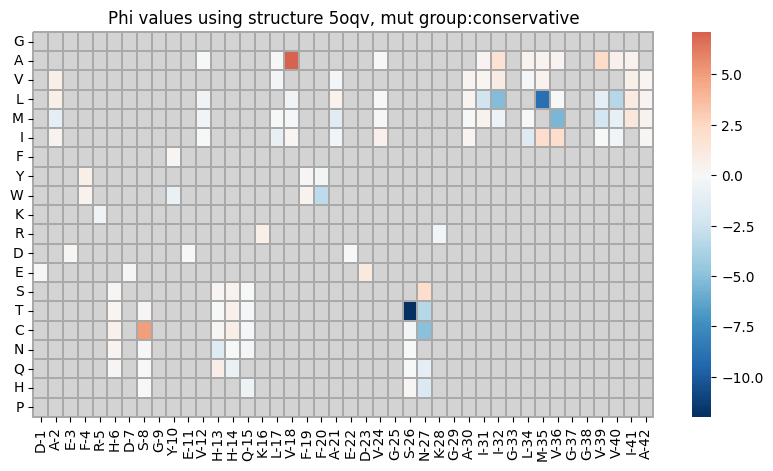

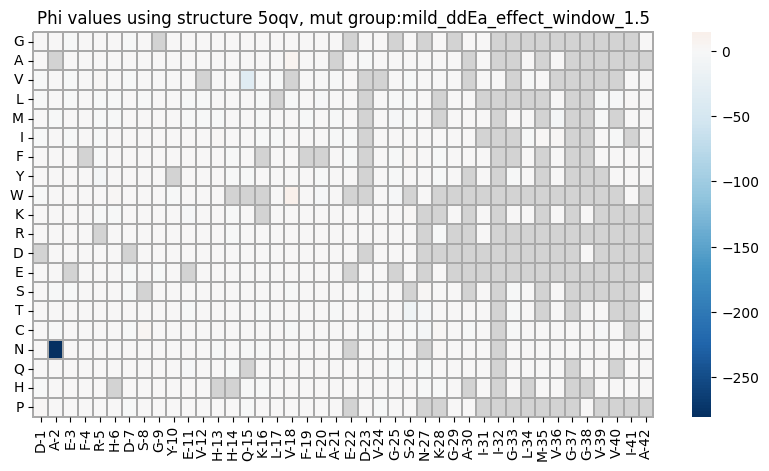

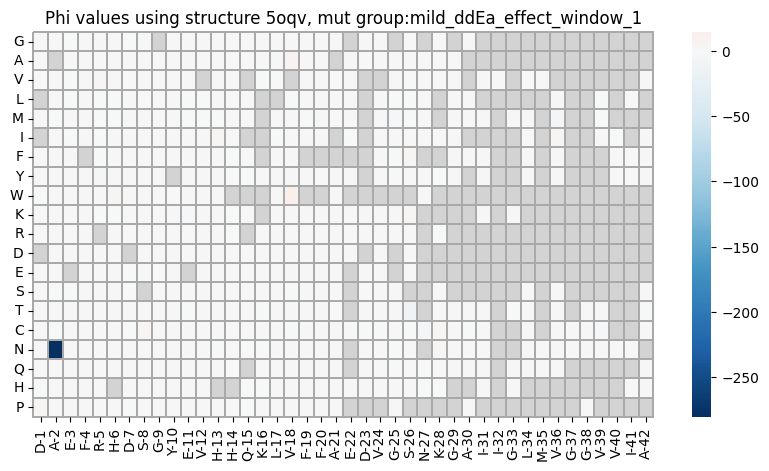

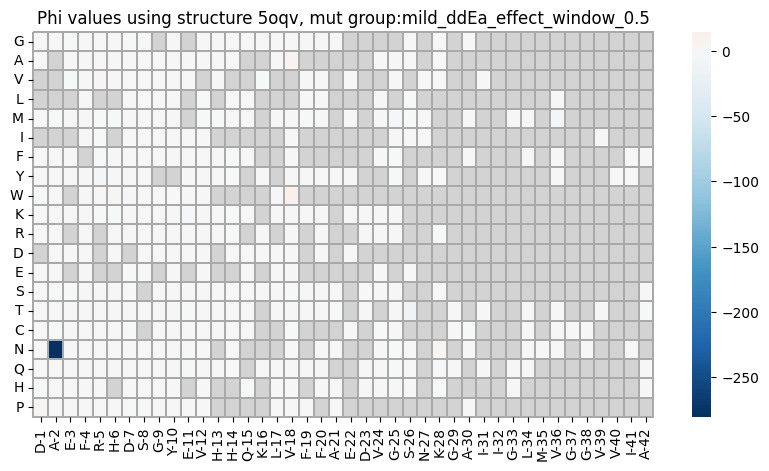

...

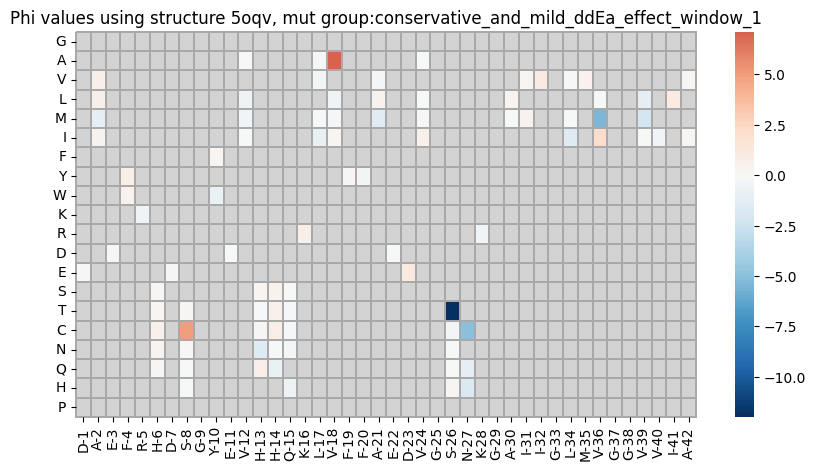

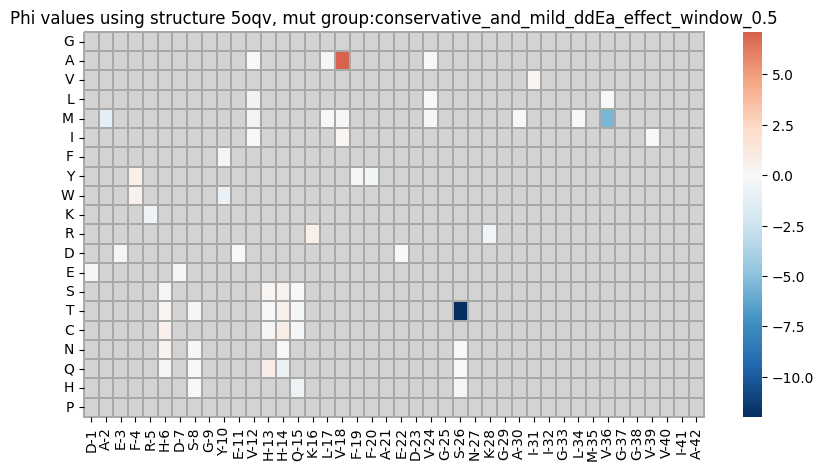

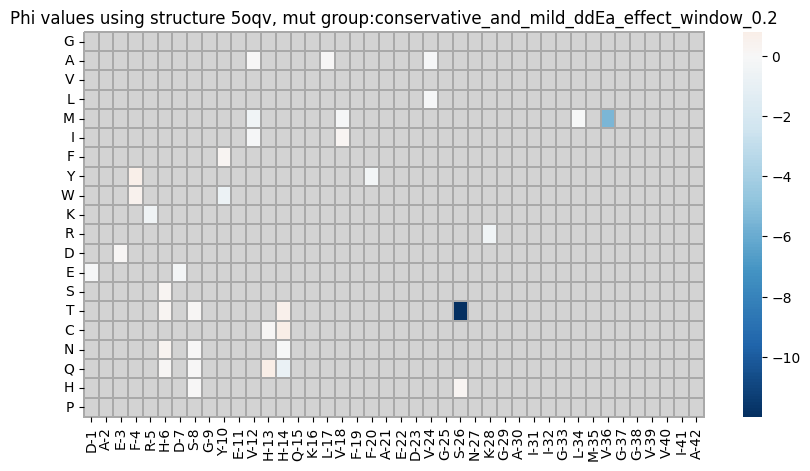

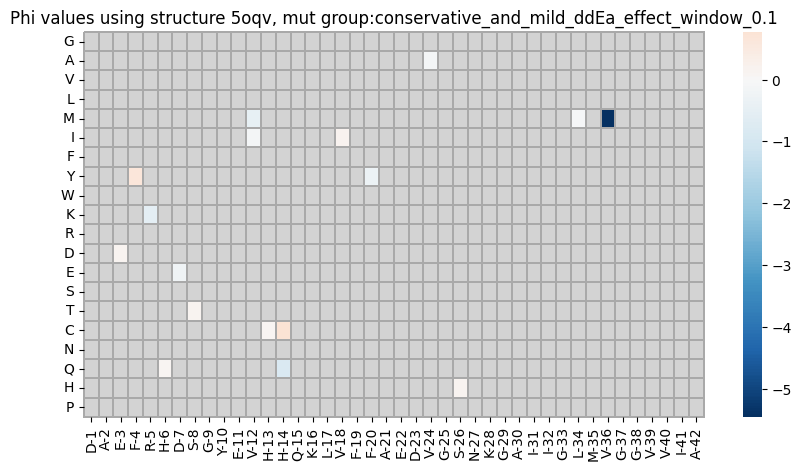

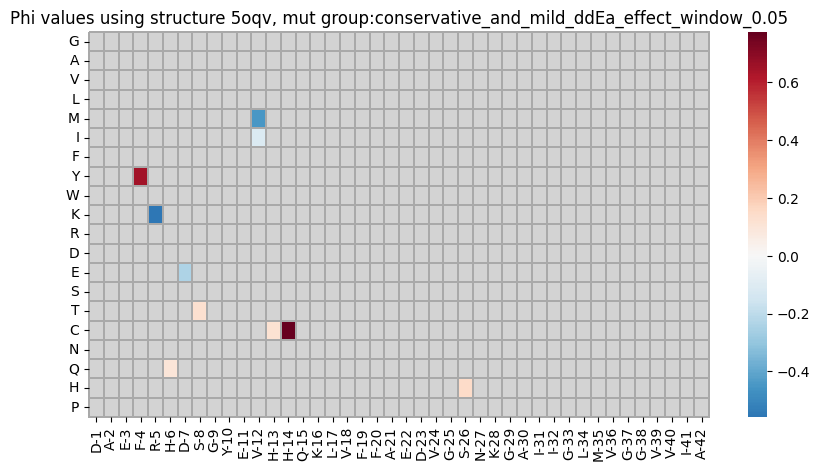

In [77]:
run = '5oqv'

for group in mutation_groups:
    #print(group)
    fig = plt.figure(figsize=(10, 5))
    
    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run][group], cmap=cmap_universal, 
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                mask=masks_phi[run][group],
                linewidths=0.005, linecolor='darkgrey', clip_on=False,
                center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values using structure ' + run + ', mut group:' + group)

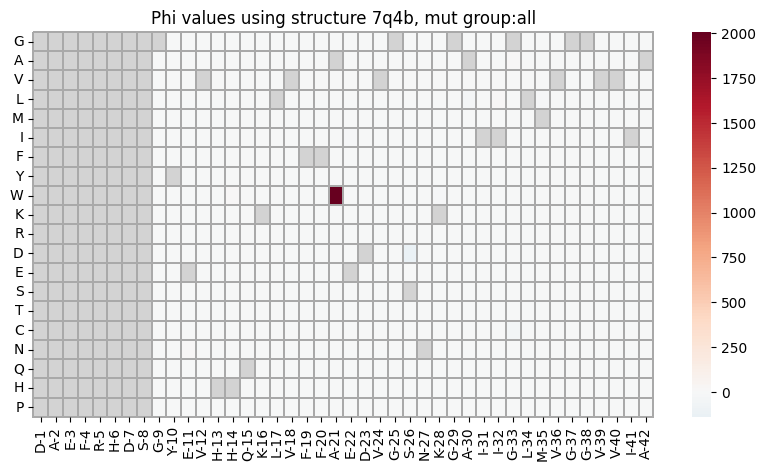

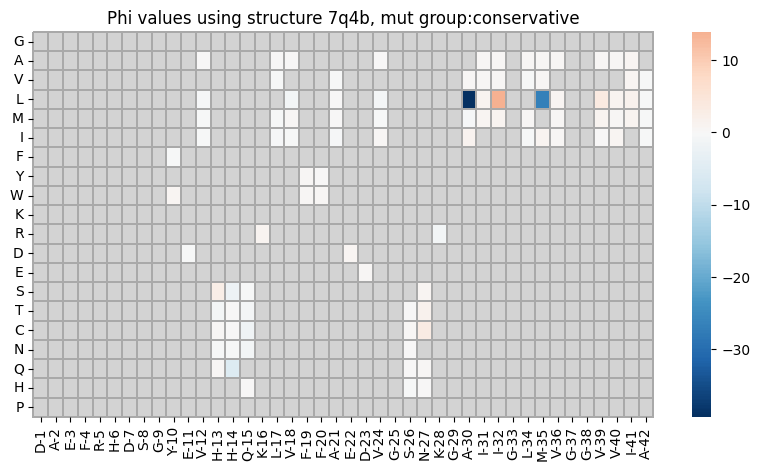

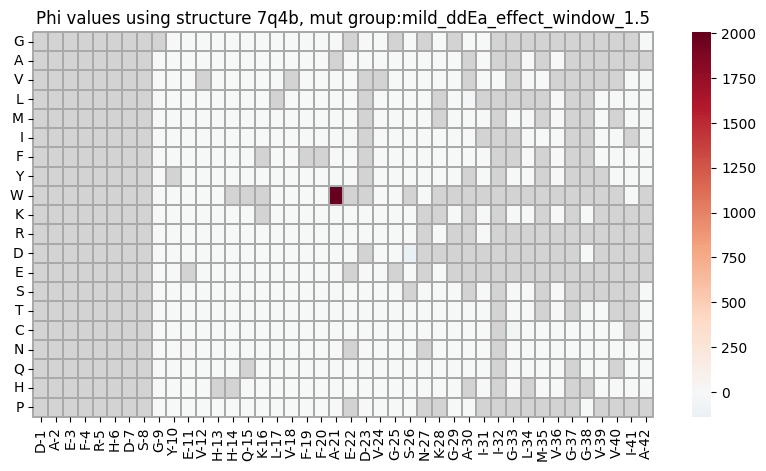

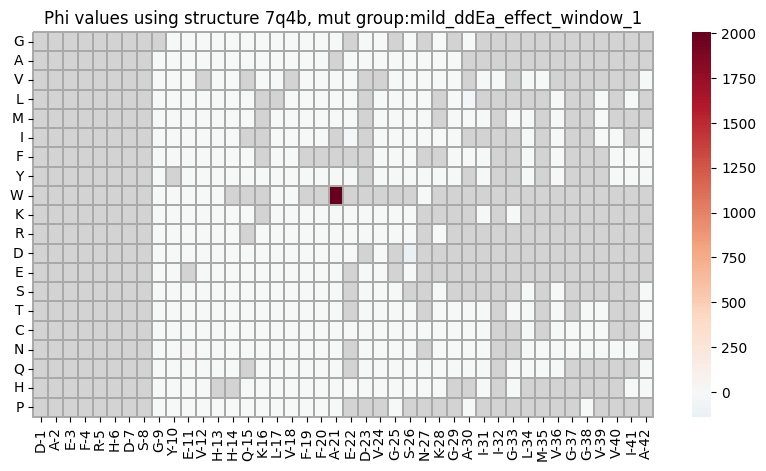

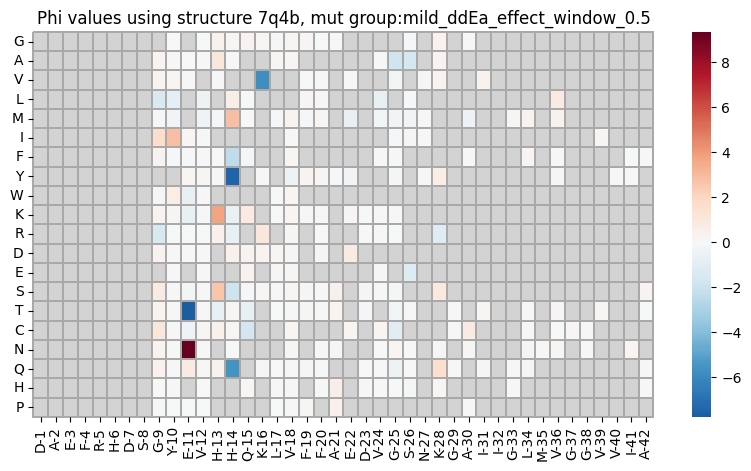

...

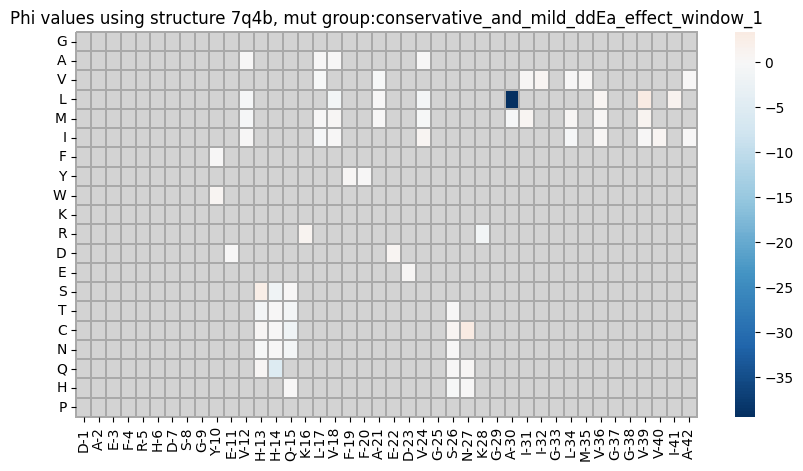

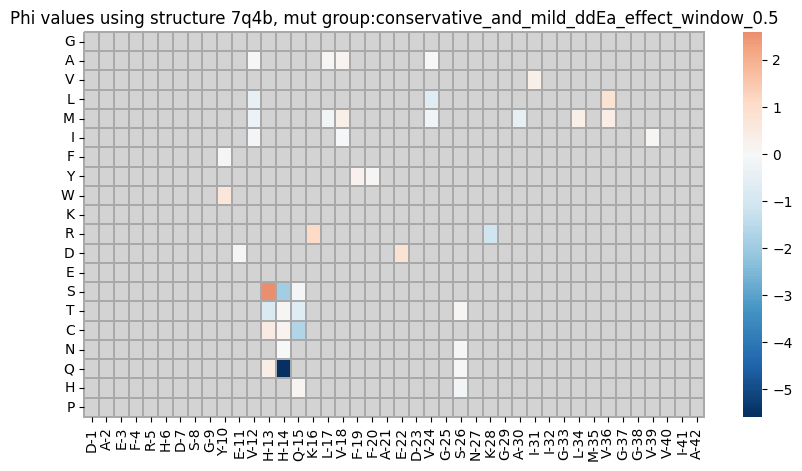

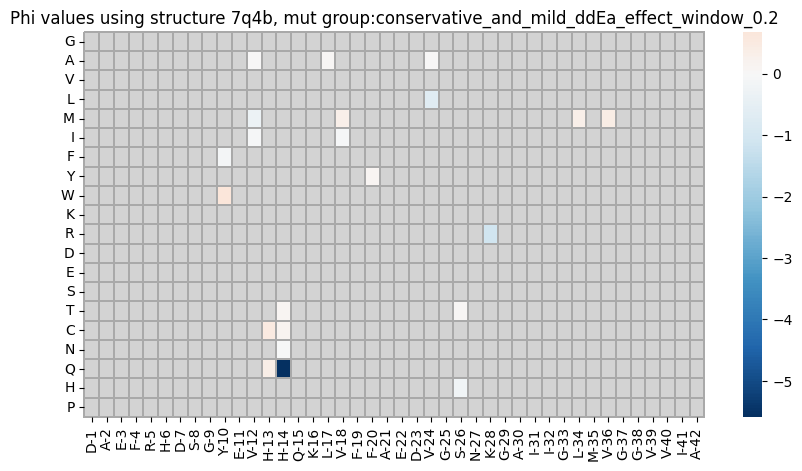

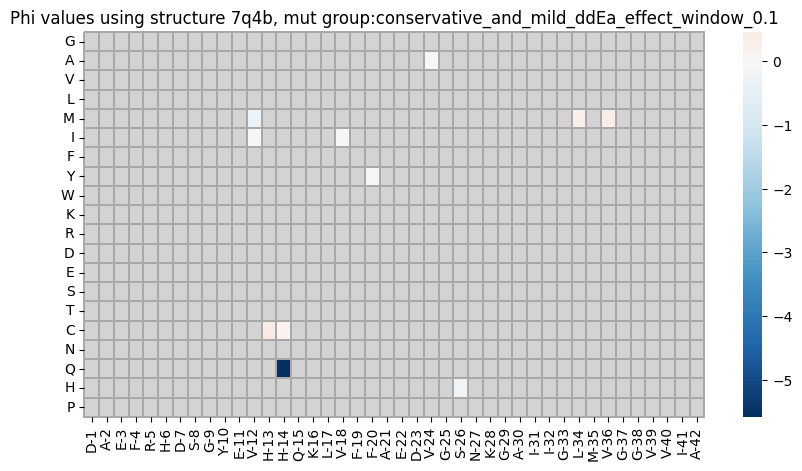

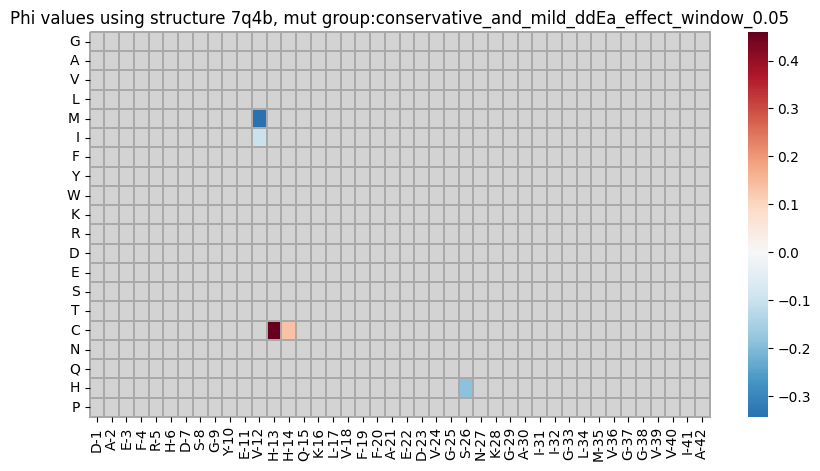

In [78]:
run = '7q4b'

for group in mutation_groups:
    #print(group)
    fig = plt.figure(figsize=(10, 5))
    
    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run][group], cmap=cmap_universal, 
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                mask=masks_phi[run][group],
                linewidths=0.005, linecolor='darkgrey', clip_on=False,
                center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values using structure ' + run + ', mut group:' + group)

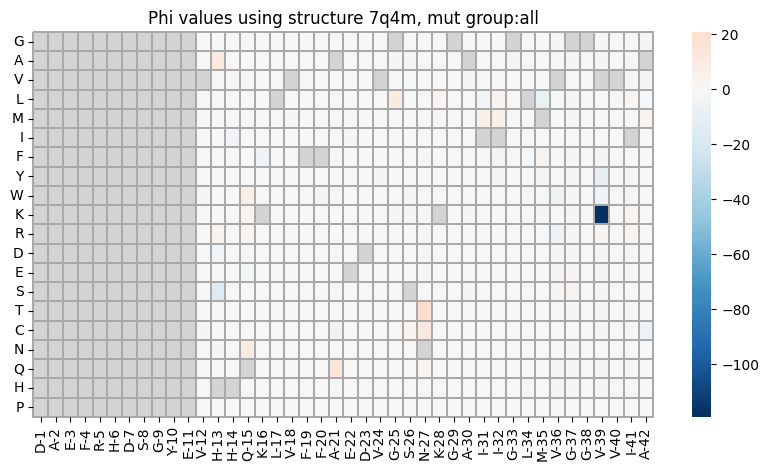

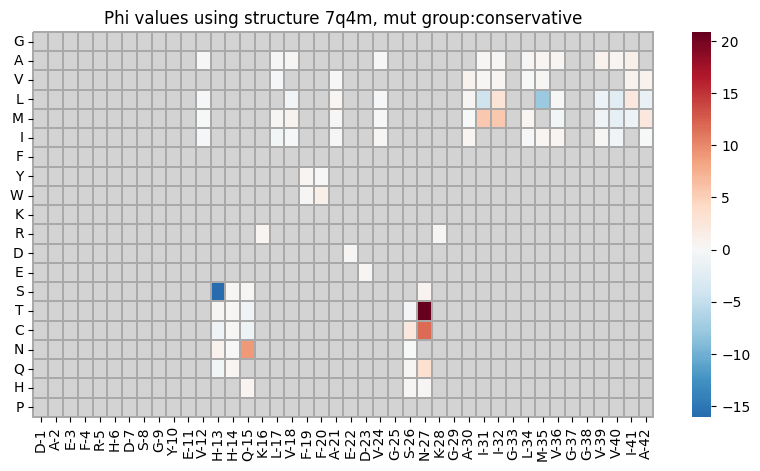

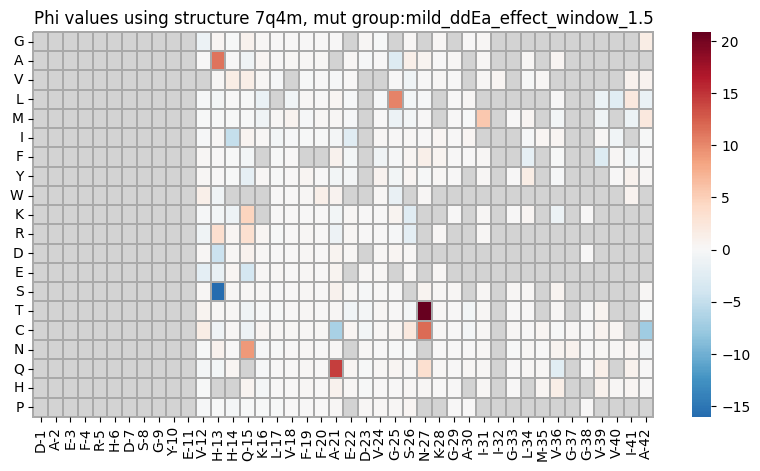

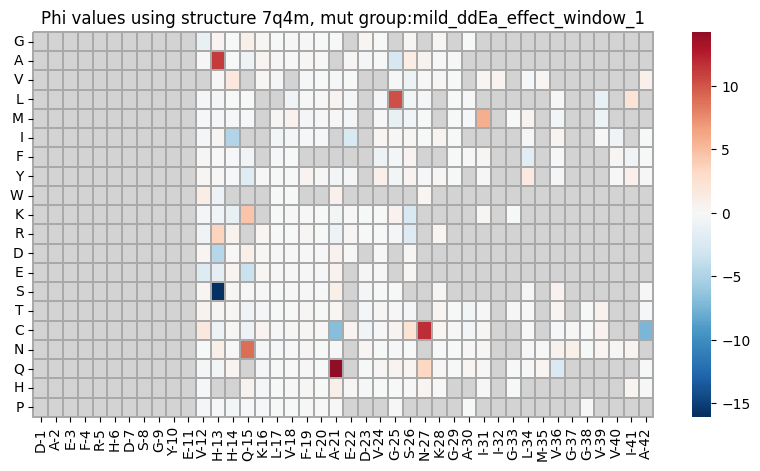

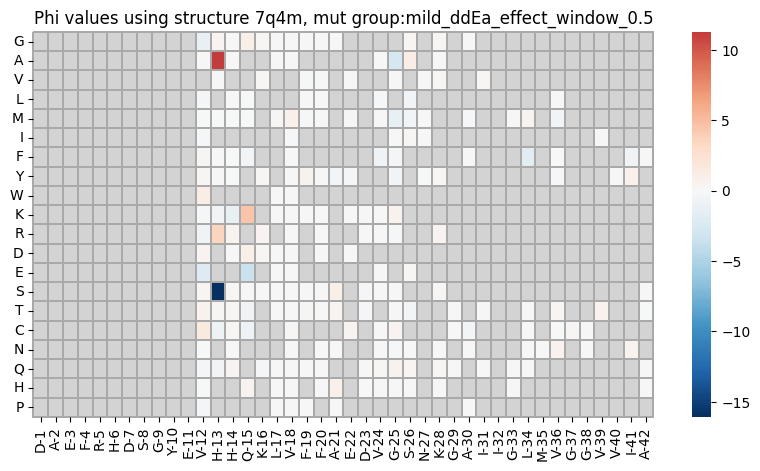

...

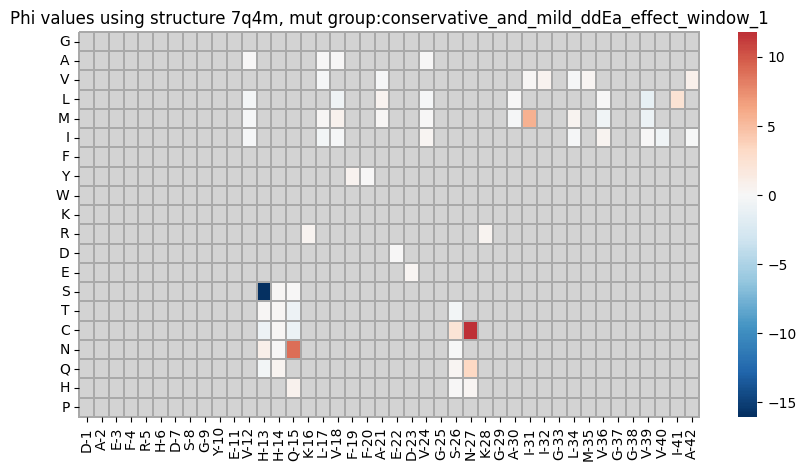

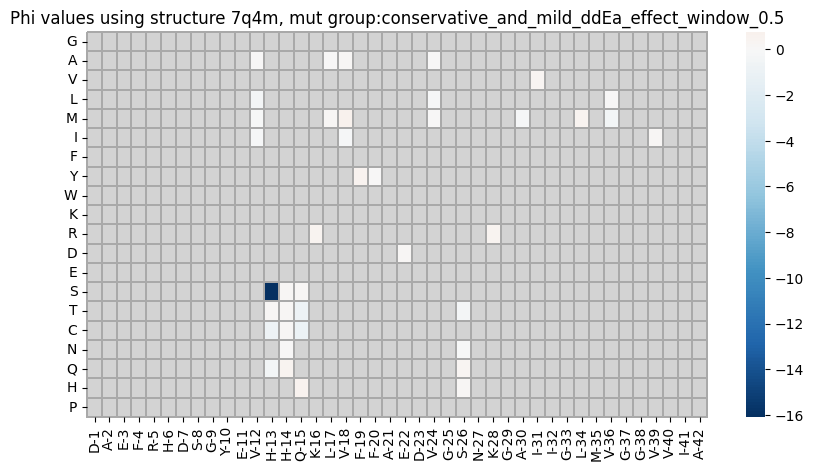

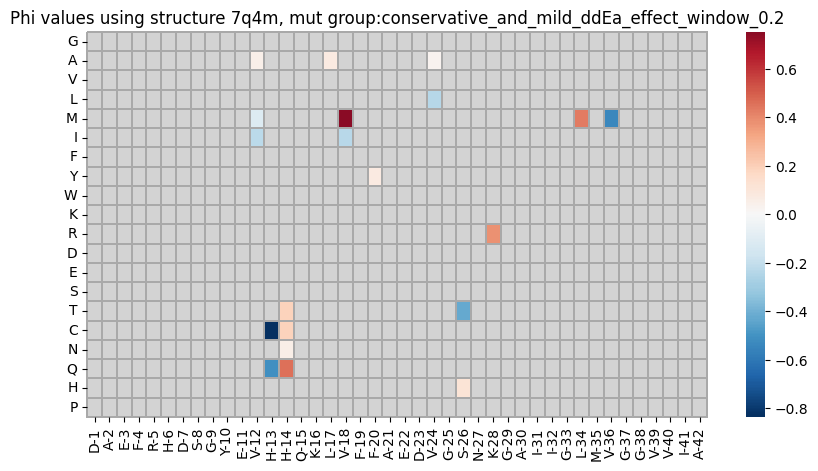

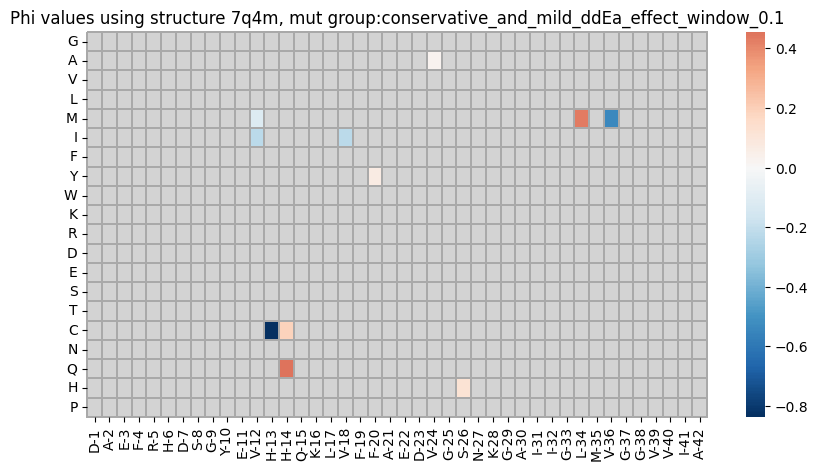

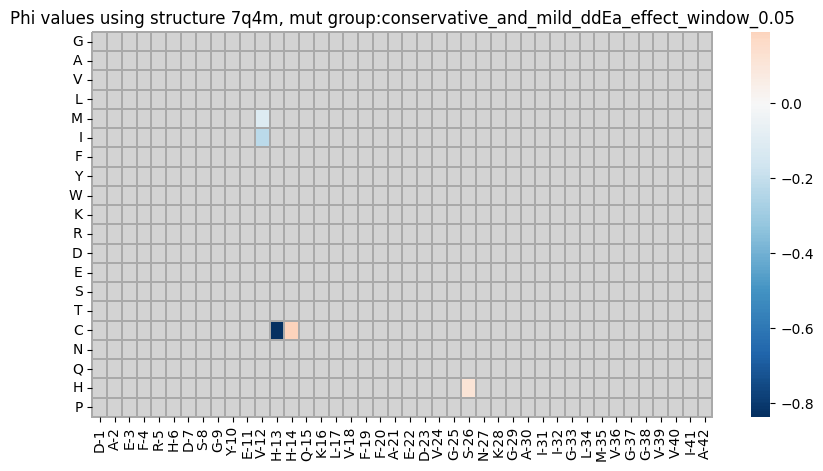

In [79]:
run = '7q4m'

for group in mutation_groups:
    #print(group)
    fig = plt.figure(figsize=(10, 5))
    
    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run][group], cmap=cmap_universal, 
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                mask=masks_phi[run][group],
                linewidths=0.005, linecolor='darkgrey', clip_on=False,
                center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values using structure ' + run + ', mut group:' + group)

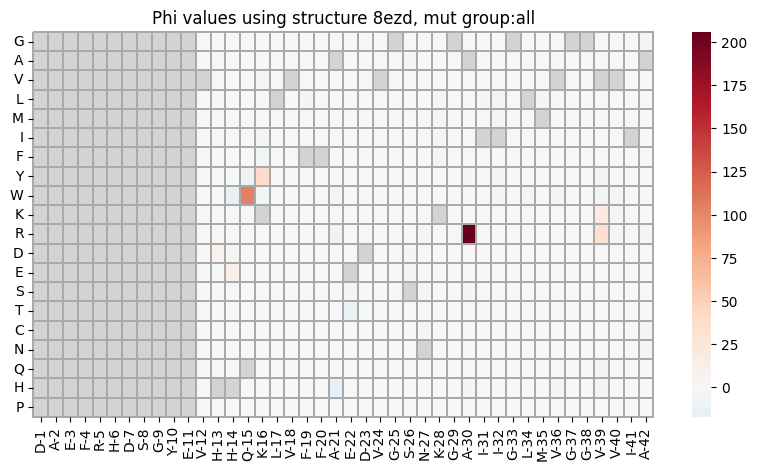

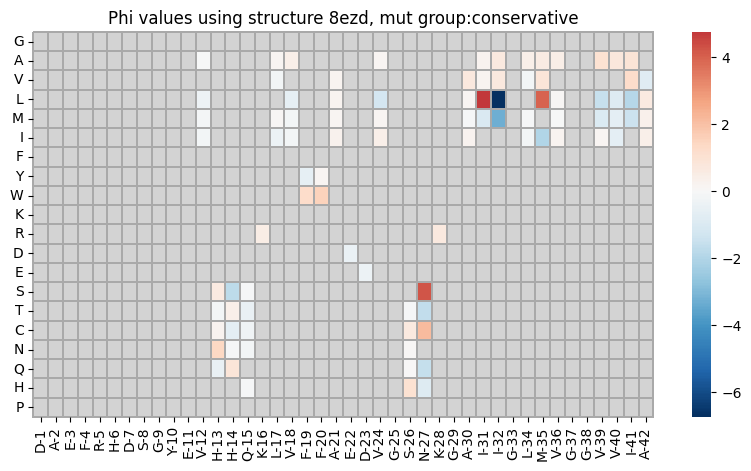

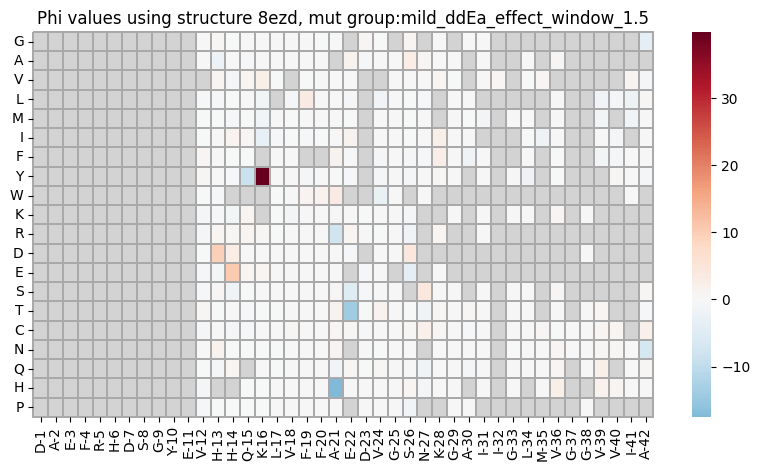

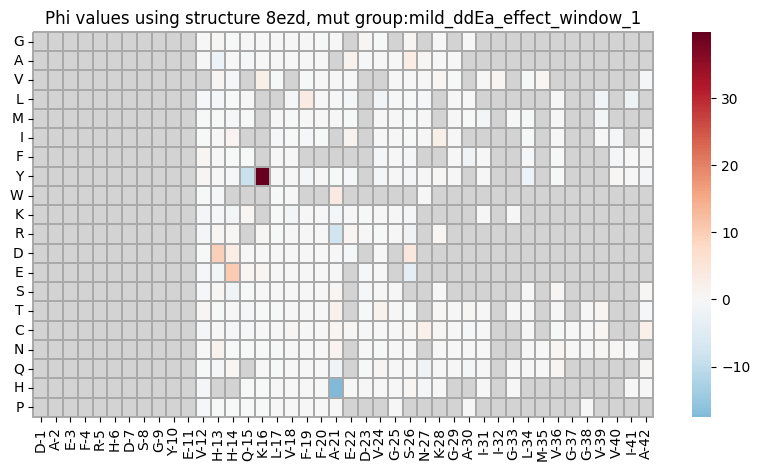

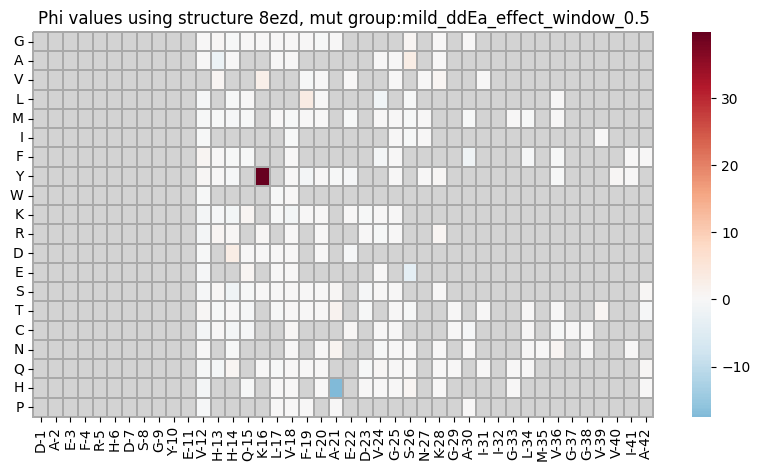

...

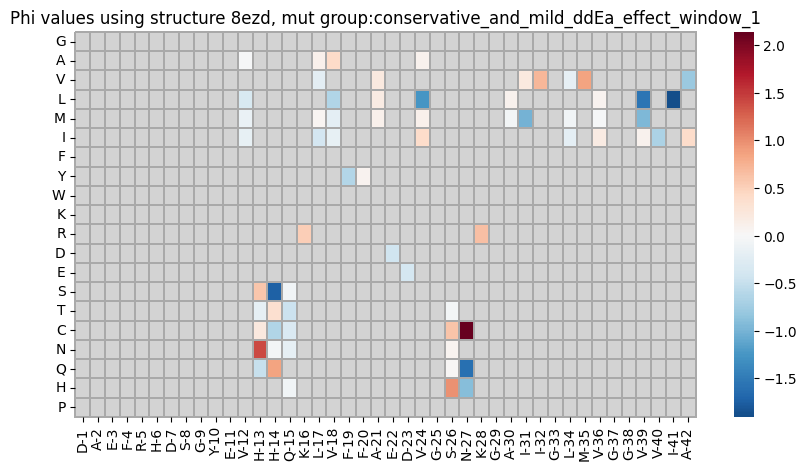

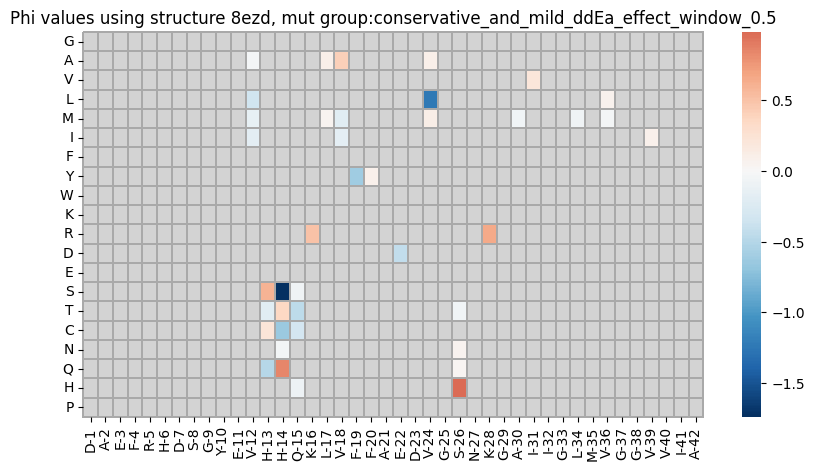

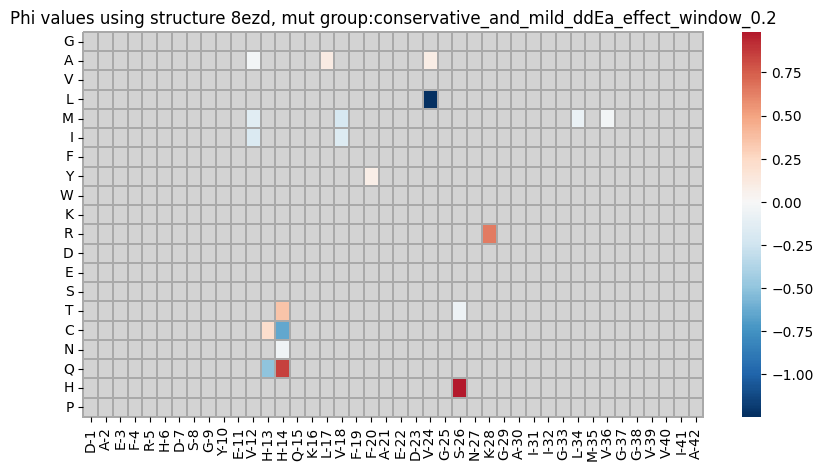

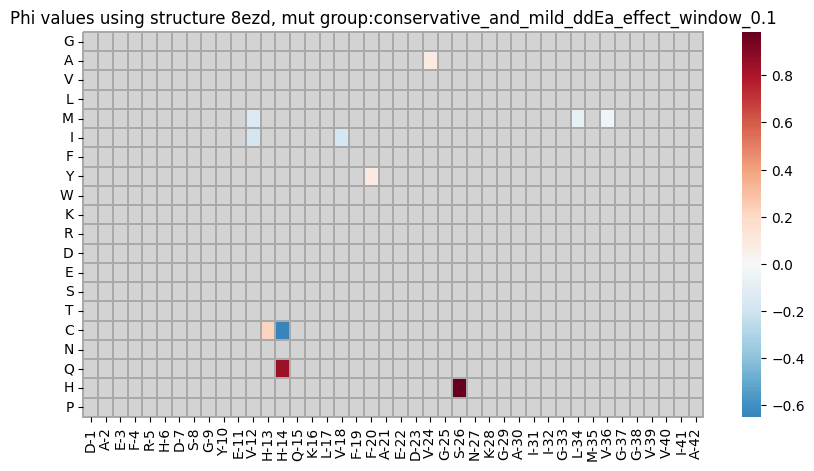

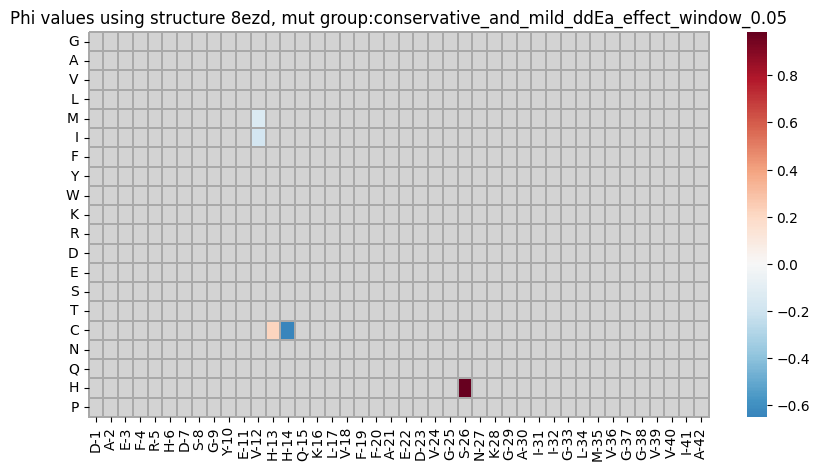

In [80]:
run = '8ezd'

for group in mutation_groups:
    #print(group)
    fig = plt.figure(figsize=(10, 5))
    
    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run][group], cmap=cmap_universal, 
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                mask=masks_phi[run][group],
                linewidths=0.005, linecolor='darkgrey', clip_on=False,
                center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values using structure ' + run + ', mut group:' + group)

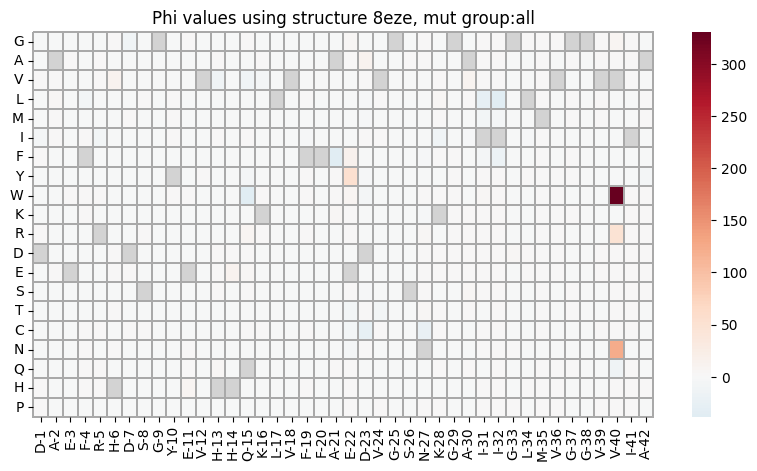

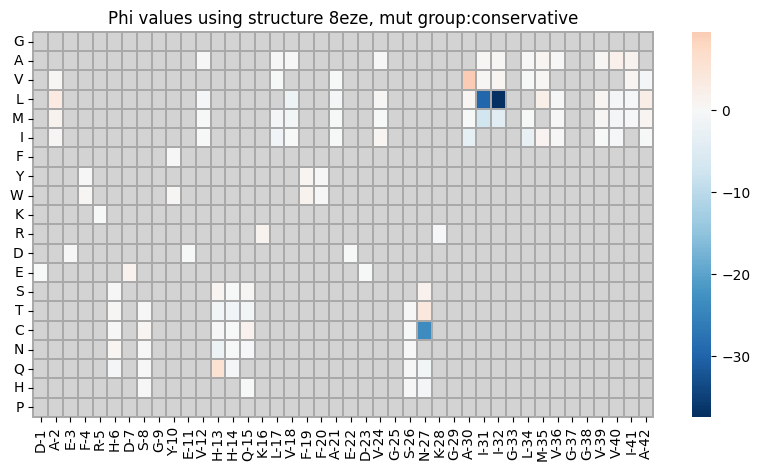

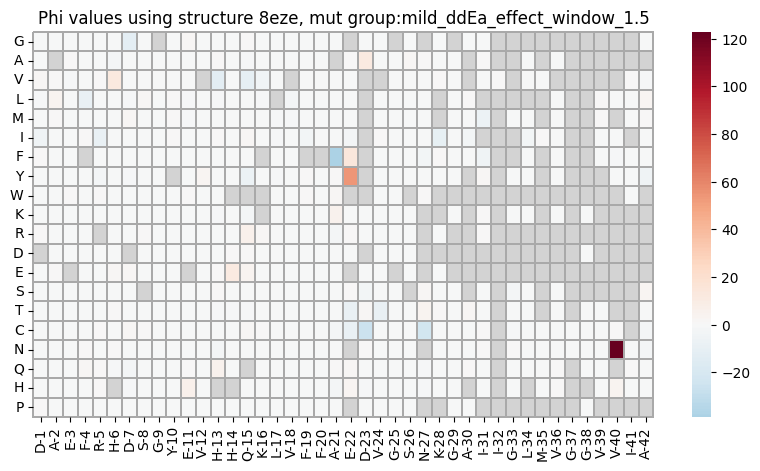

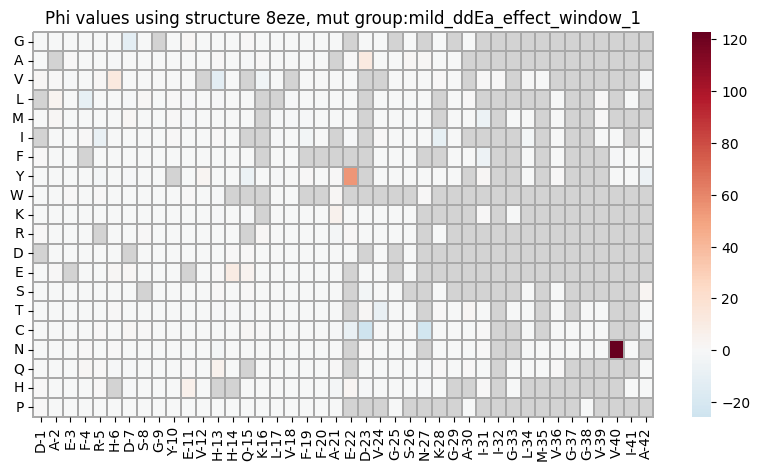

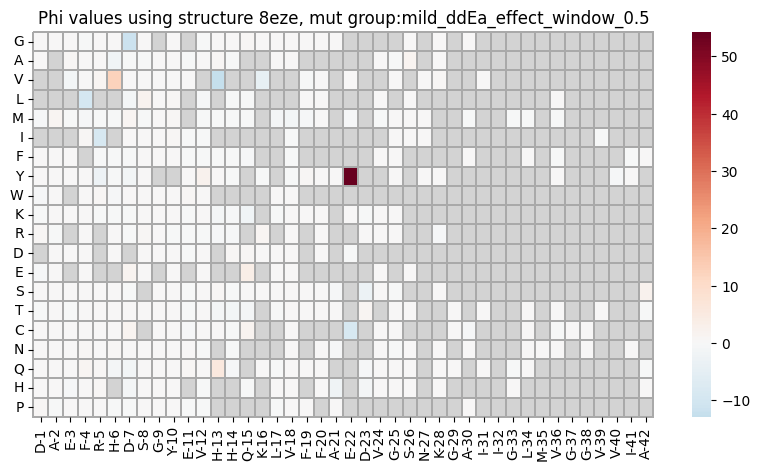

...

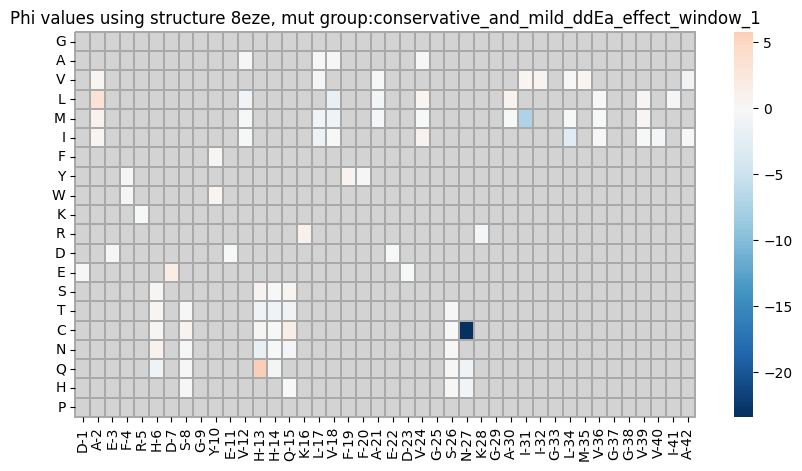

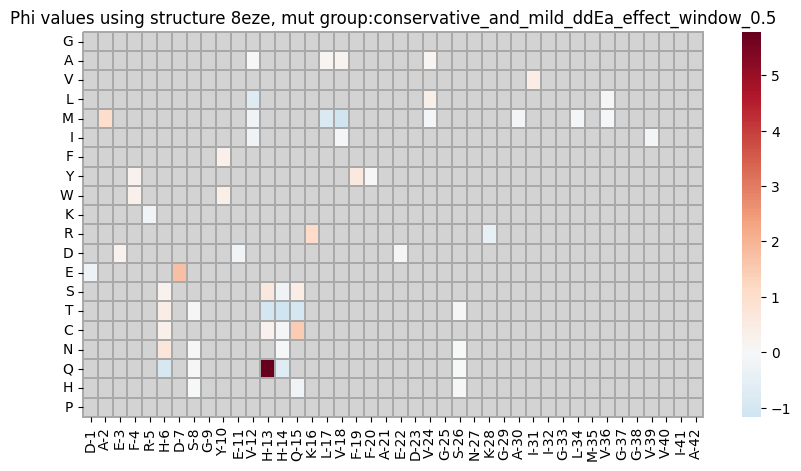

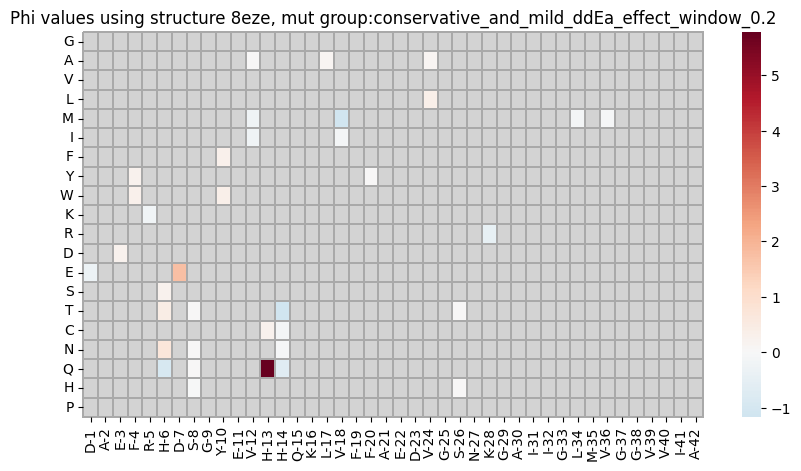

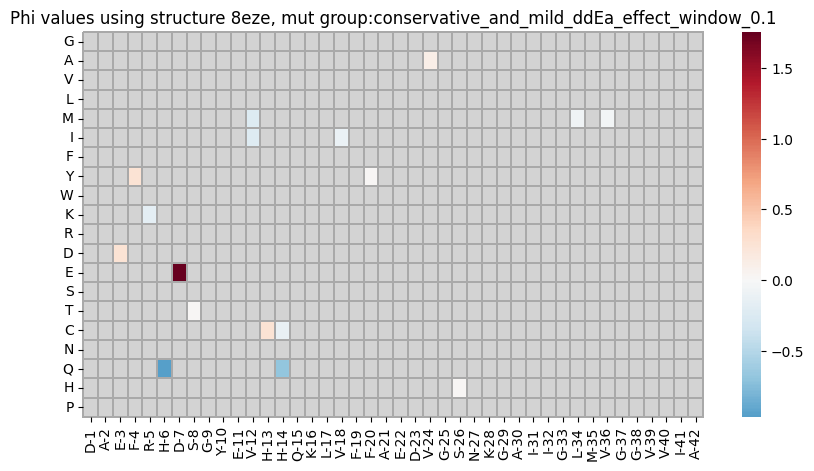

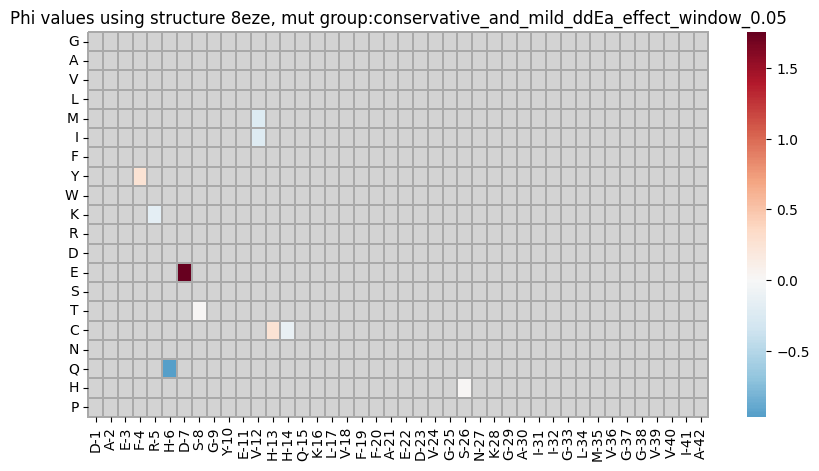

In [81]:
run = '8eze'

for group in mutation_groups:
    #print(group)
    fig = plt.figure(figsize=(10, 5))
    
    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run][group], cmap=cmap_universal, 
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                mask=masks_phi[run][group],
                linewidths=0.005, linecolor='darkgrey', clip_on=False,
                center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values using structure ' + run + ', mut group:' + group)

## Final choice: 10 kcal/mol > abs(ddG) > 0.6 kcal/mol

In [68]:
# what if we plot only those that have abs(ddG) that is between  0.6 kcal/mol

phi_values_min_max_abs_ddG = {}

min_abs_ddG = 0.6 #1.67304 # will discard anything within [-1.67304, 1.67304]
max_abs_ddG = 10

for run in foldX_runs:
    phi_values_min_max_abs_ddG[run] = {}
    
    for group in mutation_groups:
        phi_values_min_max_abs_ddG[run][group] = phi_values[run][group].copy()
        phi_values_min_max_abs_ddG[run][group] = phi_values_min_max_abs_ddG[run][group][(abs(phi_values_min_max_abs_ddG[run][group]['ddG']) > min_abs_ddG) & (abs(phi_values_min_max_abs_ddG[run][group]['ddG']) < max_abs_ddG)]
        

## this ^ is the best option (only filtering by `abs(ddG)`), let's use this

# Only filtering phi values by: `max_ddG > abs(ddG) > min_ddG`

### Plotting selected phi values

In [69]:
min_ddG = 0.6 #1.67304

max_ddG = 10

In [70]:
# plot only those that are b/w 0 and 1 on both structures

#dfs_to_plot_phi_bw_0_and_1 = {}

for run in foldX_runs:
    print(run)
    dfs_to_plot_phi[run]['phi_min_max_abs_ddG'] = dfs_to_plot_phi[run]['all']
    dfs_to_plot_phi[run]['phi_min_max_abs_ddG'] = dfs_to_plot_phi[run]['phi_min_max_abs_ddG'][abs(dfs_to_plot[run]) > min_ddG]
    dfs_to_plot_phi[run]['phi_min_max_abs_ddG'] = dfs_to_plot_phi[run]['phi_min_max_abs_ddG'][abs(dfs_to_plot[run]) < max_ddG]
    

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [71]:
masks_phi_min_abs_ddG = {}
for run in foldX_runs:
    masks_phi_min_abs_ddG[run] = dfs_to_plot_phi[run]['phi_min_max_abs_ddG'].isnull()

In [72]:
masks_phi_min_abs_ddG_cons = {}
for run in foldX_runs:
    print(run)
    is_cons_mask = dfs_to_plot_phi[run]['conservative'].isnull()
    is_min_abs_ddG_mask = dfs_to_plot_phi[run]['phi_min_max_abs_ddG'].isnull()
    masks_phi_min_abs_ddG_cons[run] = is_cons_mask | is_min_abs_ddG_mask

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


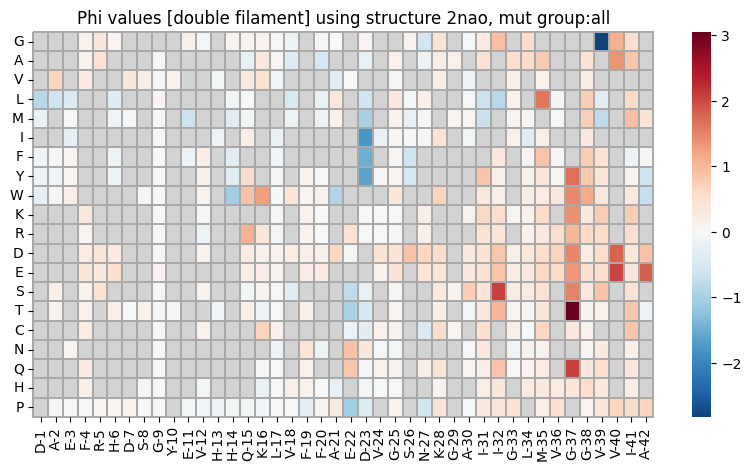

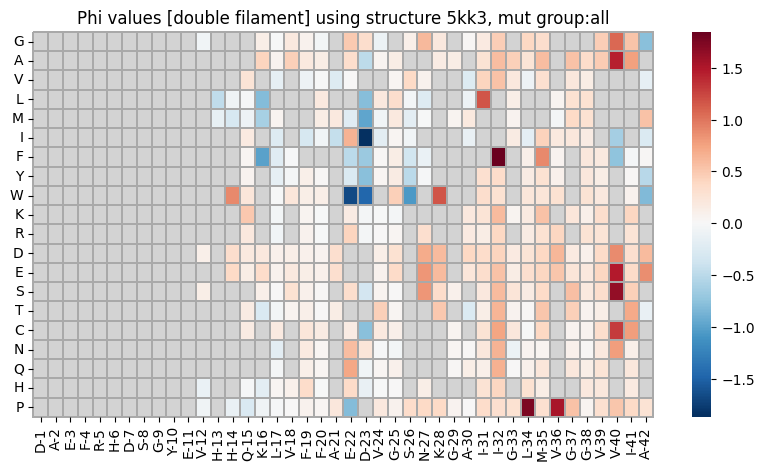

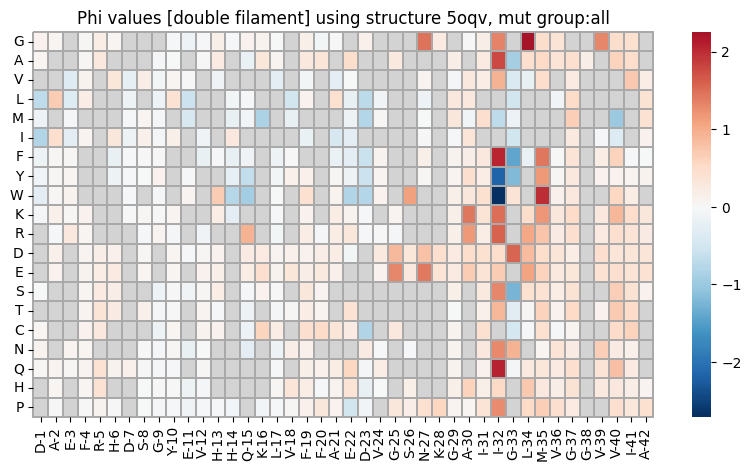

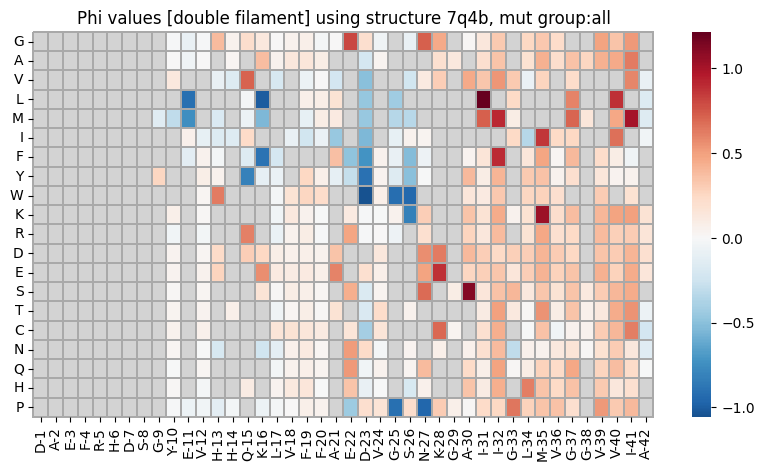

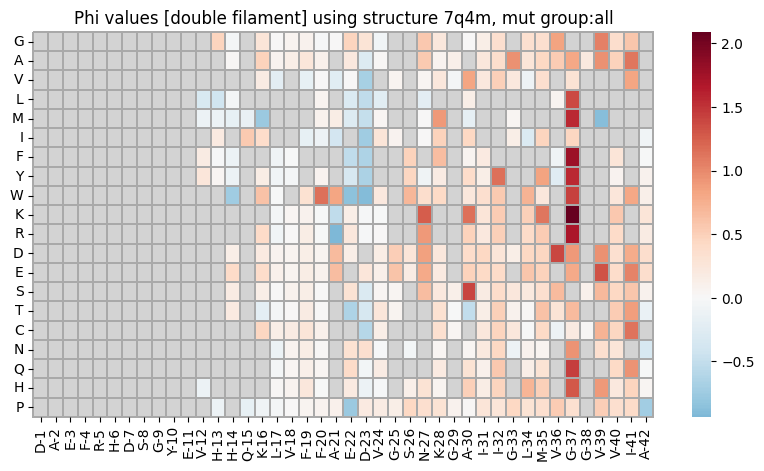

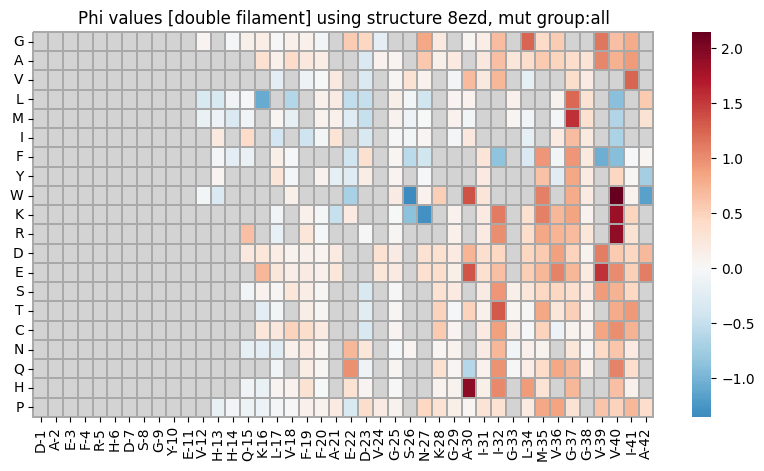

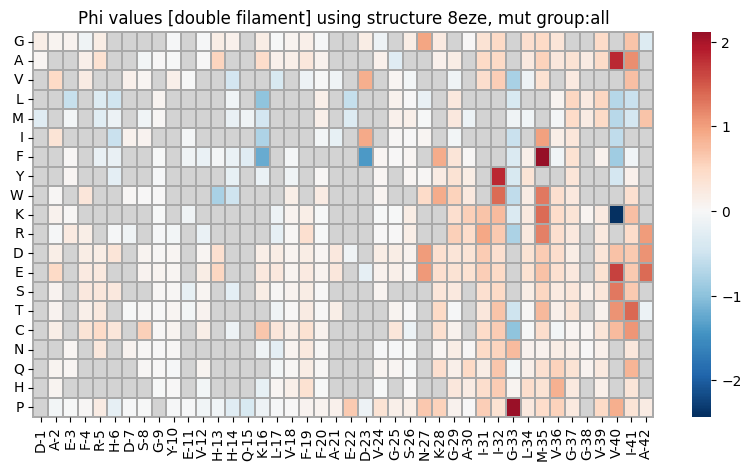

In [77]:
for run in foldX_runs:

    group = 'all' # all mutations' phi values

    fig = plt.figure(figsize=(10, 5))

    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run]['phi_min_max_abs_ddG'], cmap=cmap_universal, 
                #vmin = -1, 
                #vmax = 1,    
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                    #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                    mask=masks_phi_min_abs_ddG[run],
                    linewidths=0.005, linecolor='darkgrey', clip_on=False,
                    center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values [double filament] using structure ' + run + ', mut group:' + group)
    
    #plt.savefig('./figures/20240610_Fig3b_phi_values_full_heatmap_min_max_abs_ddG_thresholds_structure_' + run + '.pdf', bbox_inches='tight', 
    #        transparent=True)

In [73]:
# read in single filament analysis phi values

phi_values_min_max_abs_ddG_single_filament = {}

for run in foldX_runs:
    print(run)
    phi_values_min_max_abs_ddG_single_filament[run] = {}
    
    phi_values_min_max_abs_ddG_single_filament[run] = pd.read_csv('/lustre/scratch126/gengen/projects/amyloid_beta_epistasis/Phi_analysis/Single_4_stack_filament_analysis/other_structures/files/20240408_phi_values_min_max_abs_ddG_structure_' + run + '.csv',
                                                                 index_col=0)


2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [74]:
phi_values_min_max_abs_ddG_single_filament['2nao']

,phi_value,ddEa,ddG,VDW_clashes_from_FoldX,Ab_position,new_aa,ddEa_sign,ddG_sign,ddEa_sign_ddG_sign
I32P,0.423960,1.436559,3.388433,0.957342,I-32,P,+,+,+_+
I41K,0.714888,1.100475,1.539367,-0.342790,I-41,K,+,+,+_+
D23S,-0.226285,0.279242,-1.234030,-0.000328,D-23,S,+,-,+_-
E22D,-0.082585,-0.102378,1.239663,0.001132,E-22,D,-,+,-_+
I41V,0.835539,0.815993,0.976607,-0.058875,I-41,V,+,+,+_+
...,...,...,...,...,...,...,...,...,...
I41C,0.772154,1.202337,1.557120,-0.199245,I-41,C,+,+,+_+
V24E,0.141130,0.314838,2.230833,-0.221867,V-24,E,+,+,+_+
G38K,0.293144,0.691734,2.359703,1.314677,G-38,K,+,+,+_+
D1Y,-0.132414,0.096262,-0.726980,0.083941,D-1,Y,+,-,+_-


In [75]:
len(phi_values_min_max_abs_ddG_single_filament['2nao'].index)

444

In [76]:
len(phi_values_min_max_abs_ddG['2nao']['all'].index)

461

In [77]:
len(set(phi_values_min_max_abs_ddG_single_filament['2nao'].index) & set(phi_values_min_max_abs_ddG['2nao']['all'].index))

401

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


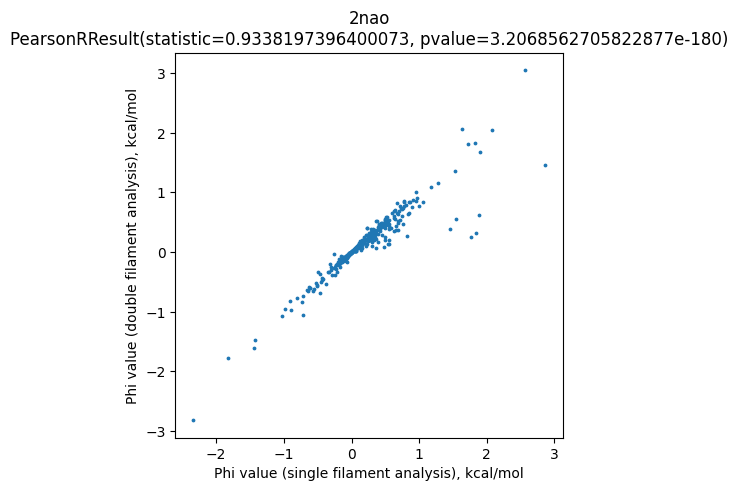

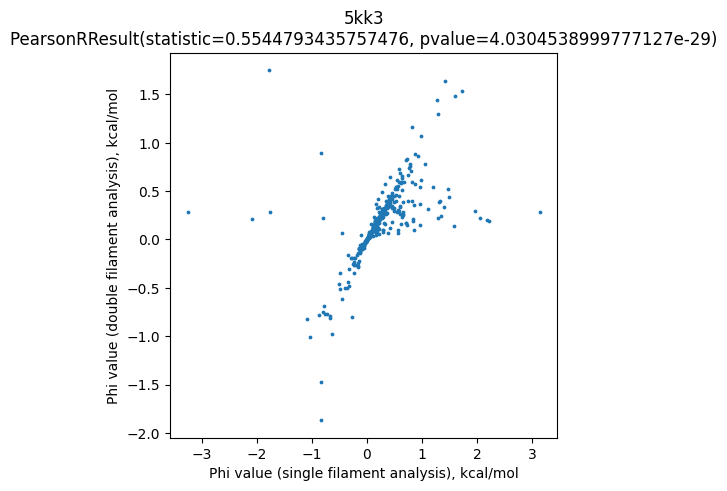

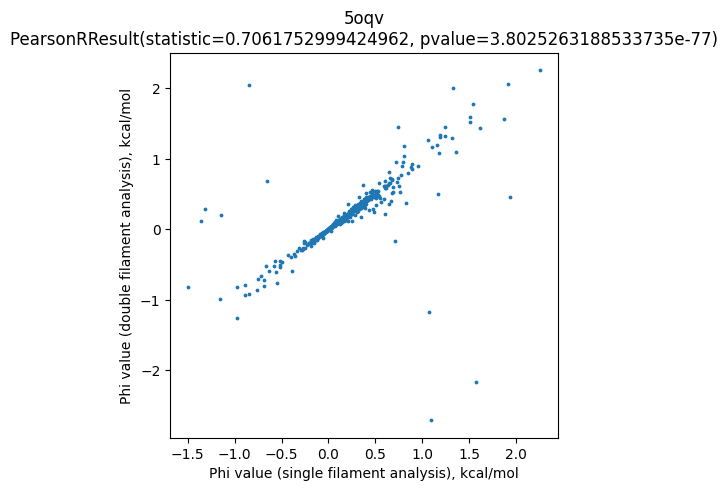

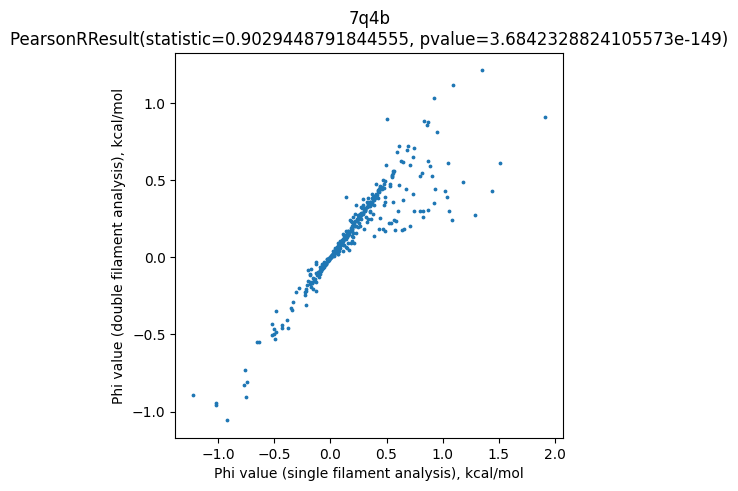

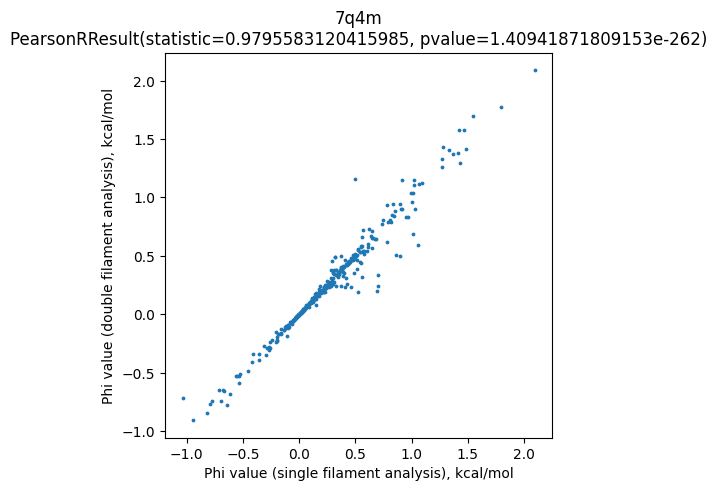

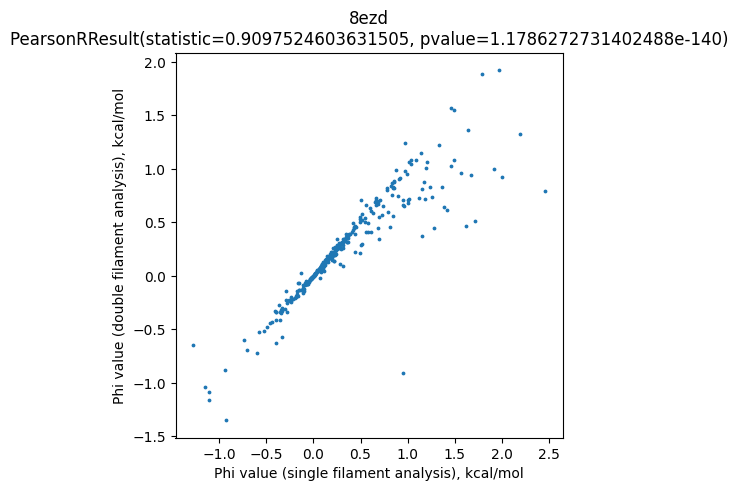

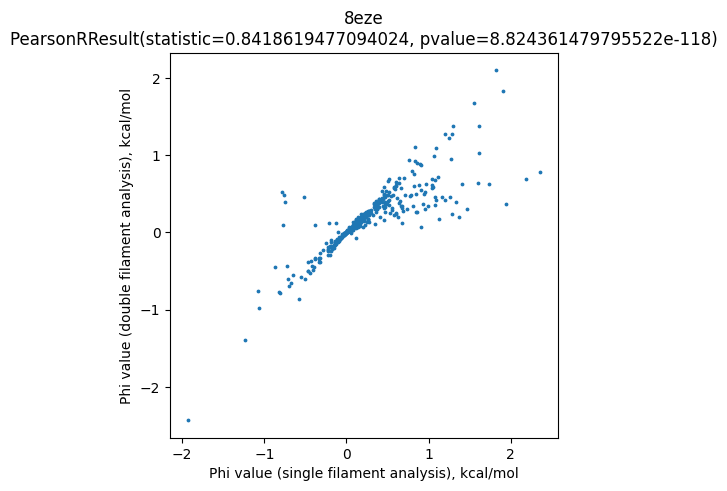

In [88]:
for run in foldX_runs:
    print(run)
    
    curr_common_mutations = list(set(phi_values_min_max_abs_ddG_single_filament[run].index) & set(phi_values_min_max_abs_ddG[run]['all'].index))
    
    curr_phi_min_abs_ddG_single_filament = phi_values_min_max_abs_ddG_single_filament[run].loc[curr_common_mutations, 'phi_value']
    curr_phi_min_abs_ddG_double_filament = phi_values_min_max_abs_ddG[run]['all'].loc[curr_common_mutations, 'phi_value']

    fig, ax = plt.subplots(figsize=(5,5))
    ax.scatter(curr_phi_min_abs_ddG_single_filament, curr_phi_min_abs_ddG_double_filament, s=3)

    #plt.axline((0, 0), (1, 1), linewidth=1, color='r')

    plt.xlabel('Phi value (single filament analysis), kcal/mol')
    plt.ylabel('Phi value (double filament analysis), kcal/mol')

    plt.title(run + '\n' + str(scipy.stats.pearsonr(curr_phi_min_abs_ddG_single_filament, curr_phi_min_abs_ddG_double_filament)))


### if the differences are mostly at inter-filament interacting residues then it makes sense

In [78]:
differences_phi_dfs = {}

for run in foldX_runs:
    
    print(run)
    
    curr_common_mutations = list(set(phi_values_min_max_abs_ddG_single_filament[run].index) & set(phi_values_min_max_abs_ddG[run]['all'].index))
    
    curr_phi_min_abs_ddG_single_filament = phi_values_min_max_abs_ddG_single_filament[run].loc[curr_common_mutations, 'phi_value']
    curr_phi_min_abs_ddG_double_filament = phi_values_min_max_abs_ddG[run]['all'].loc[curr_common_mutations, 'phi_value']

    differences_phi_dfs[run] = pd.DataFrame(index = curr_common_mutations)
    differences_phi_dfs[run]['phi_single_filament'] = curr_phi_min_abs_ddG_single_filament
    differences_phi_dfs[run]['phi_double_filament'] = curr_phi_min_abs_ddG_double_filament
    differences_phi_dfs[run]['double_vs_single_delta_phi'] = differences_phi_dfs[run]['phi_double_filament'] - differences_phi_dfs[run]['phi_single_filament']
    
    differences_phi_dfs[run]['mutation'] = curr_common_mutations
    
    differences_phi_dfs[run]['wt_aa_position'] = [elem[0] + '-' + elem[1:-1] for elem in differences_phi_dfs[run]['mutation']]
    differences_phi_dfs[run]['new_aa'] = [elem[-1] for elem in differences_phi_dfs[run]['mutation']]

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


/tmp/ipykernel_326664/2541496681.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(differences_phi_dfs[run]['double_vs_single_delta_phi'])
/tmp/ipykernel_326664/2541496681.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(differences_phi_dfs[run]['double_vs_single_delta_phi'])
/tmp/ipykernel

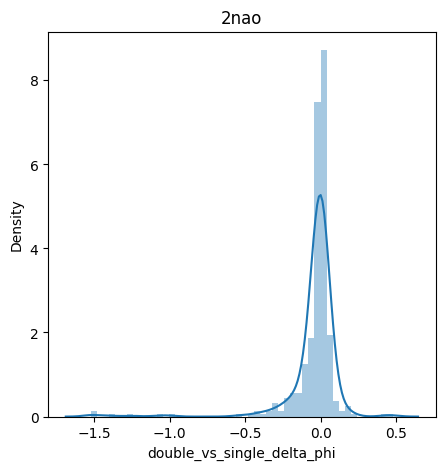

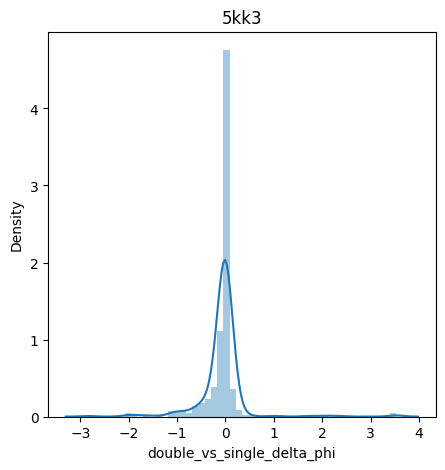

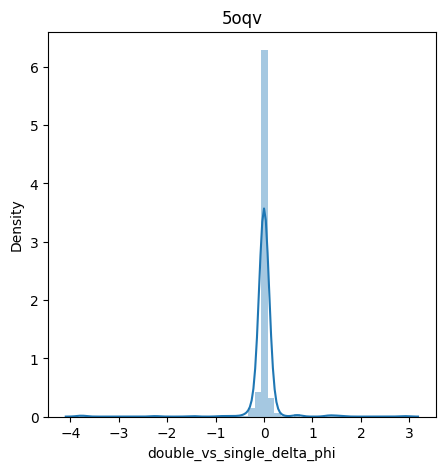

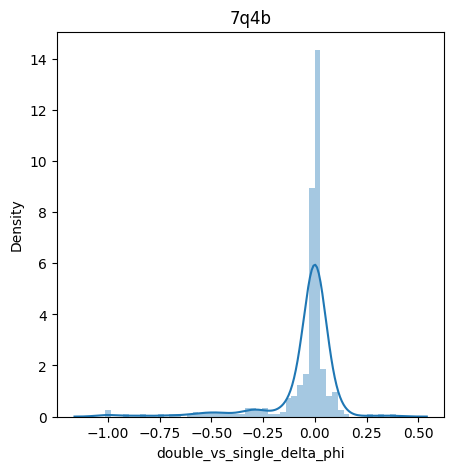

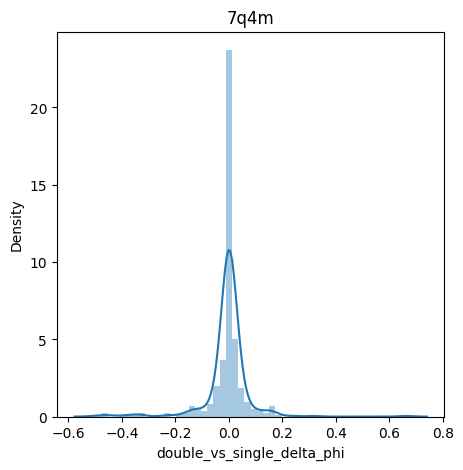

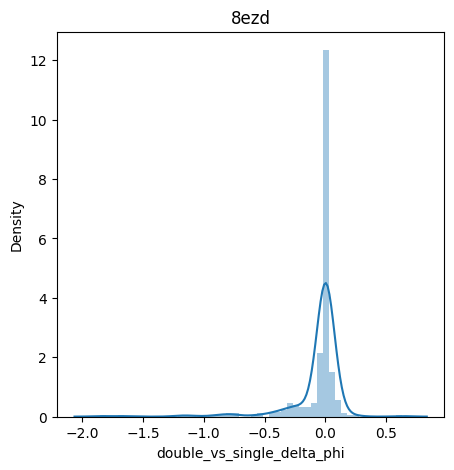

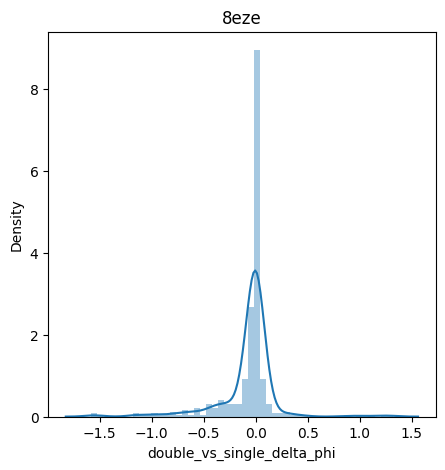

In [79]:
for run in foldX_runs:
    fig, ax = plt.subplots(figsize=(5,5))
    sns.distplot(differences_phi_dfs[run]['double_vs_single_delta_phi'])
    plt.title(run)

### Reading in double filament distances to formally test whether phi values are different in contacting positions


In [80]:
# save to be used later

distances_3d = {}
distances_3d_interchain_only = {}

for structure in foldX_runs:
    print(structure)
    distances_3d[structure] = pd.read_csv('./files/20240507_3D_distances_2_filament_facing_structure_' + structure + '.csv')
    distances_3d_interchain_only[structure] = distances_3d[structure][(distances_3d[structure]['Pos1_Pos2_chain_id'] == '1_2') | (distances_3d[structure]['Pos1_Pos2_chain_id'] == '2_1')]
    

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [81]:
contacting_positions = {}

cutoff = 8 # 5 is too low for some structures, let's try 8 for now, ut might have to have a structure-specific threshold?...

for structure in foldX_runs:
    print(structure)
    
    contacting_positions[structure] = np.unique(list(distances_3d_interchain_only[structure][distances_3d_interchain_only[structure]['scHAmin'] < cutoff]['Pos1_in_Abeta']) + list(distances_3d_interchain_only[structure][distances_3d_interchain_only[structure]['scHAmin'] < cutoff]['Pos2_in_Abeta']))
    
    print(contacting_positions[structure])

2nao
['G-33' 'G-37' 'G-38' 'H-14' 'L-17' 'L-34' 'M-35' 'Q-15']
5kk3
['E-11' 'G-27' 'G-28' 'G-37' 'G-38' 'H-13' 'H-14' 'H-4' 'K-6' 'L-17'
 'L-24' 'L-34' 'L-7' 'M-25' 'M-35' 'Q-15' 'Q-5' 'V-12' 'V-26' 'V-29'
 'V-36']
5oqv
['G-38' 'I-41' 'V-39']
7q4b
['F-11' 'F-19' 'G-29' 'G-30' 'G-37' 'I-33' 'L-17' 'L-26' 'L-34' 'L-9'
 'Q-15' 'V-12' 'V-28' 'V-31' 'V-36' 'Y-10']
7q4m
['A-31' 'A-42' 'G-18' 'G-29' 'K-17' 'K-28']
8ezd
['A-19' 'A-30' 'A-42' 'G-18' 'G-22' 'G-33' 'I-21' 'I-30' 'I-32' 'I-41'
 'K-17' 'K-28' 'M-24' 'M-35' 'V-29' 'V-40']
8eze
['A-42' 'F-20' 'G-25' 'G-37' 'G-38' 'I-32' 'I-41' 'K-16' 'L-34' 'N-27'
 'S-26' 'V-18' 'V-24' 'V-36' 'V-39']


In [82]:
for structure in foldX_runs:
    
    print(structure)
    # first, are the phi values different? so is differences_phi_dfs[structure]['double_vs_single_delta_phi'] different from 0?
    
    if len(contacting_positions[structure]) > 0:
    
        curr_wt_positions = [wt_aa_position for wt_aa_position in differences_phi_dfs[structure]['wt_aa_position'] if wt_aa_position in contacting_positions[structure]]

        #print(curr_wt_positions)

        curr_phi_values_diffs = list(differences_phi_dfs[structure].set_index('wt_aa_position').loc[curr_wt_positions]['double_vs_single_delta_phi'])
        null_distr = [0 for i in range(len(curr_phi_values_diffs))]

        is_different_test = scipy.stats.mannwhitneyu(x=curr_phi_values_diffs, y=null_distr,
                                                     alternative = 'two-sided')
        print('is_different_test:', is_different_test)

2nao
is_different_test: MannwhitneyuResult(statistic=470820.0, pvalue=2.0253897806146447e-110)
5kk3
is_different_test: MannwhitneyuResult(statistic=309738.0, pvalue=7.57491597237548e-92)
5oqv
is_different_test: MannwhitneyuResult(statistic=3765.0, pvalue=2.078847436207789e-74)
7q4b
is_different_test: MannwhitneyuResult(statistic=558657.0, pvalue=4.395073280254378e-162)
7q4m
is_different_test: MannwhitneyuResult(statistic=45816.0, pvalue=5.791055735067311e-05)
8ezd
is_different_test: MannwhitneyuResult(statistic=120930.0, pvalue=4.066849401697829e-152)
8eze
is_different_test: MannwhitneyuResult(statistic=1118362.0, pvalue=1.0183626354404228e-219)


In [83]:
for structure in foldX_runs:
    
    print(structure)
    # second, are the phi values higher in single filament version? 
    # so is differences_phi_dfs[structure]['double_vs_single_delta_phi'] significanly < than 0?
    
    if len(contacting_positions[structure]) > 0:
    
        curr_wt_positions = [wt_aa_position for wt_aa_position in differences_phi_dfs[structure]['wt_aa_position'] if wt_aa_position in contacting_positions[structure]]

        #print(curr_wt_positions)

        curr_phi_values_diffs = list(differences_phi_dfs[structure].set_index('wt_aa_position').loc[curr_wt_positions]['double_vs_single_delta_phi'])
        null_distr = [0 for i in range(len(curr_phi_values_diffs))]

        is_different_test = scipy.stats.mannwhitneyu(x=curr_phi_values_diffs, y=null_distr,
                                                     alternative = 'less')
        print('is_less_test:', is_different_test)

2nao
is_less_test: MannwhitneyuResult(statistic=470820.0, pvalue=1.0126948903073223e-110)
5kk3
is_less_test: MannwhitneyuResult(statistic=309738.0, pvalue=3.78745798618774e-92)
5oqv
is_less_test: MannwhitneyuResult(statistic=3765.0, pvalue=1.0394237181038945e-74)
7q4b
is_less_test: MannwhitneyuResult(statistic=558657.0, pvalue=2.197536640127189e-162)
7q4m
is_less_test: MannwhitneyuResult(statistic=45816.0, pvalue=2.8955278675336554e-05)
8ezd
is_less_test: MannwhitneyuResult(statistic=120930.0, pvalue=2.0334247008489146e-152)
8eze
is_less_test: MannwhitneyuResult(statistic=1118362.0, pvalue=5.091813177202114e-220)


In [84]:
for structure in foldX_runs:
    
    print(structure)
    # just a sanity check for 'greater' test    
    if len(contacting_positions[structure]) > 0:
    
        curr_wt_positions = [wt_aa_position for wt_aa_position in differences_phi_dfs[structure]['wt_aa_position'] if wt_aa_position in contacting_positions[structure]]

        #print(curr_wt_positions)

        curr_phi_values_diffs = list(differences_phi_dfs[structure].set_index('wt_aa_position').loc[curr_wt_positions]['double_vs_single_delta_phi'])
        null_distr = [0 for i in range(len(curr_phi_values_diffs))]

        is_different_test = scipy.stats.mannwhitneyu(x=curr_phi_values_diffs, y=null_distr,
                                                     alternative = 'greater')
        print('is_less_test:', is_different_test)

2nao
is_less_test: MannwhitneyuResult(statistic=470820.0, pvalue=1.0)
5kk3
is_less_test: MannwhitneyuResult(statistic=309738.0, pvalue=1.0)
5oqv
is_less_test: MannwhitneyuResult(statistic=3765.0, pvalue=1.0)
7q4b
is_less_test: MannwhitneyuResult(statistic=558657.0, pvalue=1.0)
7q4m
is_less_test: MannwhitneyuResult(statistic=45816.0, pvalue=0.9999710978572097)
8ezd
is_less_test: MannwhitneyuResult(statistic=120930.0, pvalue=1.0)
8eze
is_less_test: MannwhitneyuResult(statistic=1118362.0, pvalue=1.0)


In [85]:
# making barplots

In [86]:
dfs_for_barplots = {}

for structure in foldX_runs:
    
    dfs_for_barplots[structure] = pd.DataFrame(index = list(differences_phi_dfs[structure].index)*2,
                                                  columns = ['phi_value','structure','single_or_double_filament'])
    
    dfs_for_barplots[structure]['structure'] = [structure for i in range(len(dfs_for_barplots[structure]))]
    dfs_for_barplots[structure]['phi_value'] = list(differences_phi_dfs[structure]['phi_single_filament']) + list(differences_phi_dfs[structure]['phi_double_filament'])
    dfs_for_barplots[structure]['single_or_double_filament'] = ['single' for i in range(len(differences_phi_dfs[structure]))] + ['double' for i in range(len(differences_phi_dfs[structure]))]
    

In [87]:
dfs_for_barplots_altogether = pd.concat(dfs_for_barplots.values(), axis=0)

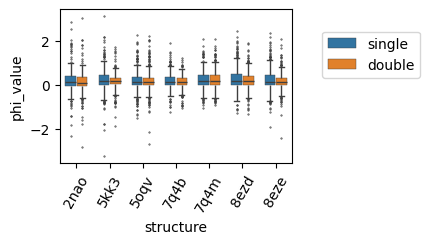

In [102]:
fig = plt.figure(figsize=(3, 2))

ax = plt.subplot(111)

sns.boxplot(data=dfs_for_barplots_altogether, x = 'structure', y = 'phi_value', 
               hue = 'single_or_double_filament',
            gap=.1,
            hue_order=['single','double'],
            width=.7, flierprops={"marker": '.', 'markersize':1},
            boxprops={"linewidth": 0.3}
                #order = ['N','C']
                  )

ax.legend(bbox_to_anchor=(1.1, 0.9))

plt.xticks(rotation=60)

#plt.ylim(-1.2, 2)

#plt.axhline(0, c='blue')
#plt.axhline(1, c='red')

plt.savefig('./figures/20240611_phi_values_min_abs_ddG_single_vs_double_comparison_UPD.pdf',
           bbox_inches = 'tight')

In [103]:
# let's look at phi with > 0.1 difference
# maybe could choose more specific threshold of what's bad here???

for run in foldX_runs:
    
    print(run)
    
    curr_df = differences_phi_dfs[run][(differences_phi_dfs[run]['double_vs_single_delta_phi'] > 0.1) | (differences_phi_dfs[run]['double_vs_single_delta_phi'] < -0.1)]
        
    print(curr_df['wt_aa_position'].value_counts()
         )
    
    for pos in list(curr_df['wt_aa_position'].value_counts().keys()):
        
        if curr_df['wt_aa_position'].value_counts()[pos] > 2:
            print(pos)
            curr_subdf = curr_df[curr_df['wt_aa_position'] == pos]
            
            print(curr_subdf.loc[:,['phi_single_filament','phi_double_filament','double_vs_single_delta_phi']])
    
    print()
    

2nao
wt_aa_position
M-35    10
L-34     8
I-31     6
V-39     6
G-9      4
G-37     4
I-41     4
H-14     3
F-19     3
I-32     2
H-6      1
V-36     1
L-17     1
F-20     1
Q-15     1
V-18     1
G-38     1
D-1      1
F-4      1
S-8      1
N-27     1
D-23     1
V-40     1
Name: count, dtype: int64
M-35
      phi_single_filament  phi_double_filament  double_vs_single_delta_phi
M35S             0.756282             0.466723                   -0.289559
M35E             1.879678             0.625574                   -1.254104
M35C             0.855415             0.661133                   -0.194283
M35R             1.843782             0.320933                   -1.522849
M35Q             0.818907             0.271345                   -0.547562
M35I             0.299333             0.160503                   -0.138829
M35A             1.002719             0.764440                   -0.238279
M35W             1.764532             0.254815                   -1.509718
M35T             0.62

# so in double filament analysis version phi values for intra-filament interacting positions are lower

# Only filtering phi values by: `max_ddG > abs(ddG) > min_ddG`

### Plotting selected phi values

In [88]:
min_ddG = 0.6 #1.67304

max_ddG = 10

In [89]:
# plot only those that are b/w 0 and 1 on both structures

#dfs_to_plot_phi_bw_0_and_1 = {}

for run in foldX_runs:
    print(run)
    dfs_to_plot_phi[run]['phi_min_max_abs_ddG'] = dfs_to_plot_phi[run]['all']
    dfs_to_plot_phi[run]['phi_min_max_abs_ddG'] = dfs_to_plot_phi[run]['phi_min_max_abs_ddG'][abs(dfs_to_plot[run]) > min_ddG]
    dfs_to_plot_phi[run]['phi_min_max_abs_ddG'] = dfs_to_plot_phi[run]['phi_min_max_abs_ddG'][abs(dfs_to_plot[run]) < max_ddG]
    

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [90]:
dfs_to_plot_phi['2nao']['phi_min_max_abs_ddG']

,D-1,A-2,E-3,F-4,R-5,H-6,D-7,S-8,G-9,Y-10,E-11,V-12,H-13,H-14,Q-15,K-16,L-17,V-18,F-19,F-20,A-21,E-22,D-23,V-24,G-25,S-26,N-27,K-28,G-29,A-30,I-31,I-32,G-33,L-34,M-35,V-36,G-37,G-38,V-39,V-40,I-41,A-42
G,NaN,NaN,NaN,0.095987,0.345837,0.075790,NaN,NaN,NaN,NaN,0.165780,-0.069501,NaN,0.069681,0.082040,0.128671,0.001116,-0.158324,NaN,0.033725,-0.002344,NaN,0.082560,NaN,NaN,0.131645,-0.565321,0.446461,NaN,-0.024820,0.269161,0.915150,NaN,0.553057,NaN,NaN,NaN,NaN,-2.822366,1.085496,0.513297,NaN
A,NaN,NaN,NaN,0.098281,0.478797,NaN,NaN,NaN,0.022254,NaN,NaN,NaN,NaN,NaN,-0.245077,0.303216,0.068152,-0.426951,NaN,-0.535933,NaN,NaN,-0.246362,NaN,0.139861,NaN,-0.180422,0.190484,0.147659,NaN,0.472649,NaN,0.556095,0.534471,0.764440,NaN,NaN,0.472915,NaN,1.363177,0.833940,NaN
V,NaN,0.687297,NaN,0.231755,NaN,NaN,0.384385,0.193680,0.017778,0.120606,NaN,NaN,-0.076751,NaN,0.339938,0.456599,-0.117860,NaN,NaN,NaN,-0.377585,0.007115,NaN,NaN,0.037127,NaN,NaN,0.220772,NaN,-0.177889,NaN,NaN,0.162908,NaN,0.136701,NaN,NaN,0.251394,NaN,NaN,NaN,NaN
L,-0.832200,-0.632264,-0.463922,NaN,NaN,-0.365775,NaN,NaN,0.072514,NaN,NaN,NaN,NaN,-0.079112,-0.019834,NaN,NaN,-0.503135,NaN,-0.198582,0.345330,NaN,-0.609801,NaN,0.317893,-0.064342,0.159001,NaN,NaN,-0.035545,-0.654553,-0.827139,0.156069,NaN,1.607451,0.047150,NaN,0.735394,-0.329556,NaN,0.610691,NaN
M,-0.189254,NaN,-0.045940,NaN,NaN,-0.135037,-0.061201,NaN,0.029848,NaN,-0.645973,NaN,NaN,-0.329691,-0.083387,NaN,NaN,-0.147679,NaN,-0.159054,0.151346,NaN,-0.980257,NaN,0.132607,-0.209889,0.003701,NaN,0.052174,0.056024,-0.685389,NaN,0.072285,0.031080,NaN,-0.029652,NaN,0.715435,-0.799820,NaN,0.911470,0.425968
I,NaN,NaN,-0.255187,NaN,NaN,NaN,NaN,NaN,0.017160,NaN,NaN,NaN,-0.147768,NaN,0.203582,NaN,-0.198307,NaN,NaN,NaN,NaN,NaN,-1.770922,-0.215088,0.035558,-0.063076,-0.062143,0.458584,NaN,-0.082728,NaN,NaN,0.141176,-0.390964,0.160503,NaN,NaN,0.299153,NaN,NaN,NaN,NaN
F,-0.135089,-0.038861,0.065777,NaN,NaN,-0.141273,NaN,NaN,-0.011932,NaN,-0.161827,0.214279,NaN,-0.340083,NaN,NaN,-0.100565,NaN,NaN,NaN,NaN,NaN,-1.471406,NaN,0.064652,-0.628526,NaN,NaN,NaN,NaN,NaN,0.312017,NaN,0.062963,0.865412,0.036491,NaN,0.768016,0.459026,NaN,-0.139359,0.037481
Y,-0.132568,-0.097426,0.082895,NaN,NaN,-0.147483,NaN,NaN,-0.034671,NaN,NaN,0.162980,NaN,-0.381228,0.547460,NaN,-0.066701,NaN,0.105058,0.017527,NaN,NaN,-1.612540,0.042778,0.084418,-0.548431,NaN,NaN,NaN,NaN,0.849770,0.183171,NaN,0.093518,0.407314,0.062453,1.676057,0.794649,0.379943,NaN,0.087789,-0.609812
W,-0.265794,-0.064267,0.195013,NaN,NaN,NaN,NaN,0.013941,0.021007,NaN,NaN,0.102598,NaN,-1.064539,0.873566,1.281159,-0.009910,0.406362,0.075636,0.142107,-0.896494,NaN,NaN,NaN,0.388094,NaN,NaN,0.694790,NaN,NaN,0.304598,0.201327,NaN,0.196710,0.254815,0.323728,1.466271,1.160334,0.325250,NaN,0.290339,-0.731216
K,NaN,NaN,NaN,0.336915,NaN,NaN,NaN,NaN,-0.005077,NaN,NaN,0.024079,NaN,NaN,NaN,NaN,-0.049090,NaN,0.118272,-0.014855,NaN,NaN,-0.036545,-0.002511,-0.025693,NaN,0.203404,NaN,NaN,0.107135,0.639565,0.506808,0.057088,0.140316,0.582168,NaN,1.388400,0.295232,0.757144,NaN,0.777228,NaN


In [91]:
masks_phi_min_abs_ddG = {}
for run in foldX_runs:
    masks_phi_min_abs_ddG[run] = dfs_to_plot_phi[run]['phi_min_max_abs_ddG'].isnull()

In [92]:
masks_phi_min_abs_ddG['2beg']

KeyError: '2beg'

In [93]:
masks_phi_min_abs_ddG_cons = {}
for run in foldX_runs:
    print(run)
    is_cons_mask = dfs_to_plot_phi[run]['conservative'].isnull()
    is_min_abs_ddG_mask = dfs_to_plot_phi[run]['phi_min_max_abs_ddG'].isnull()
    masks_phi_min_abs_ddG_cons[run] = is_cons_mask | is_min_abs_ddG_mask

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


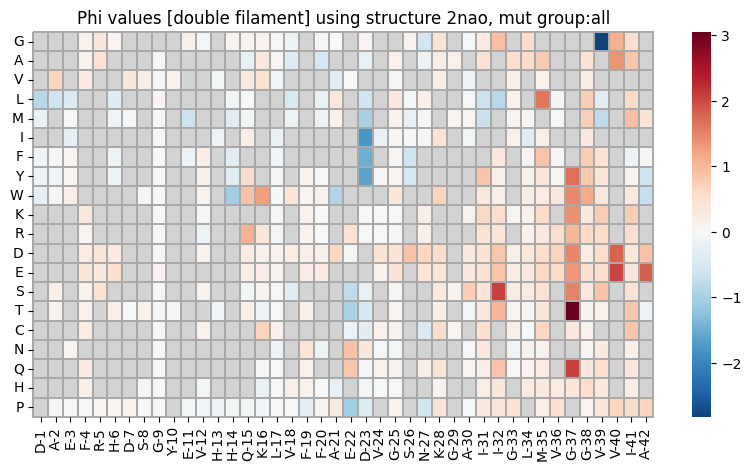

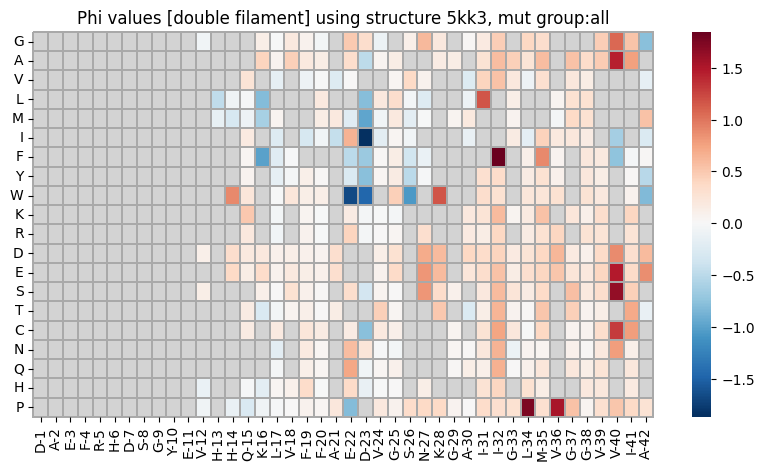

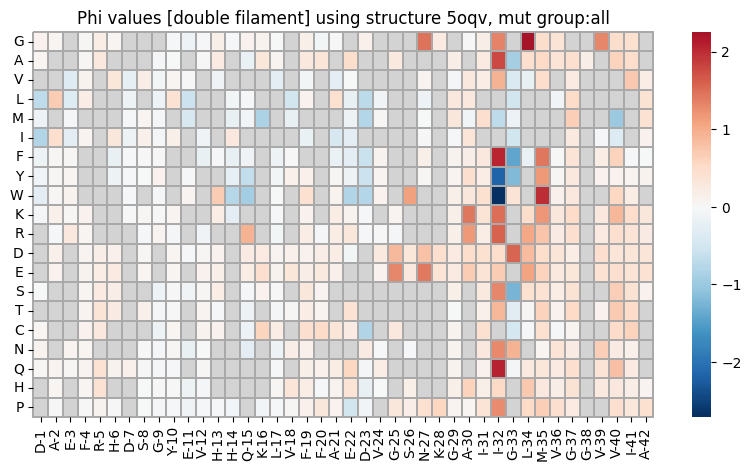

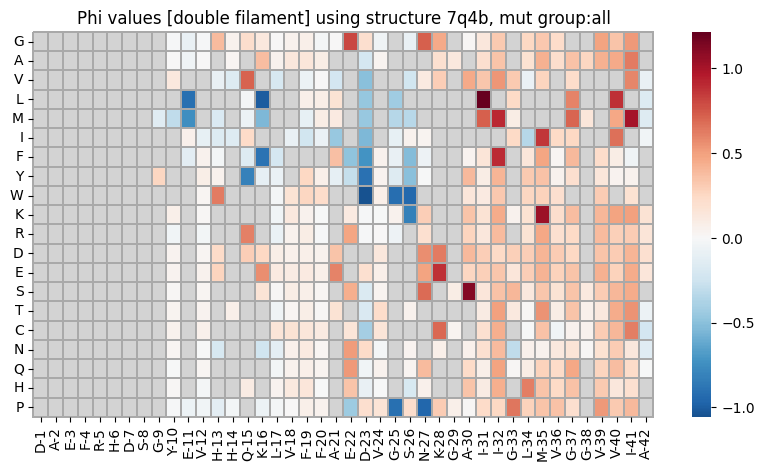

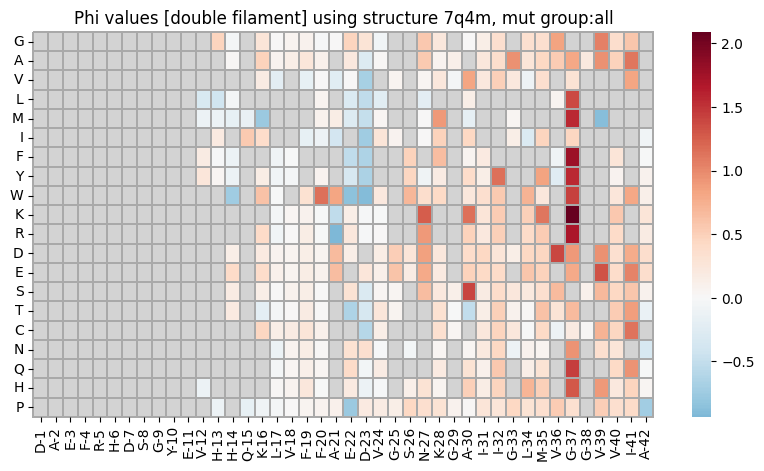

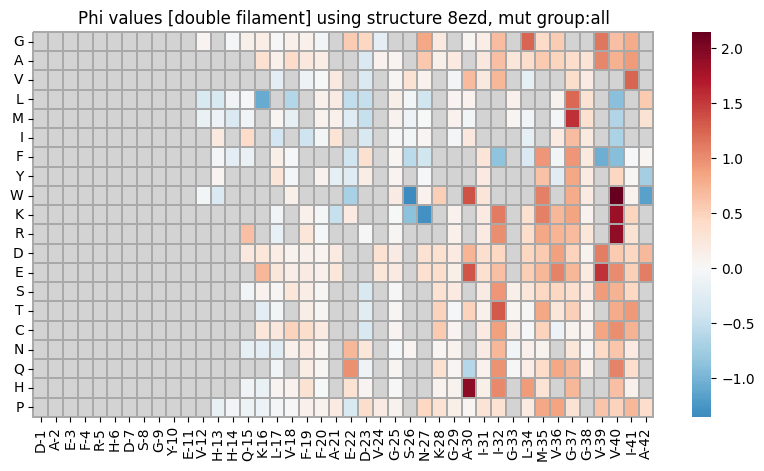

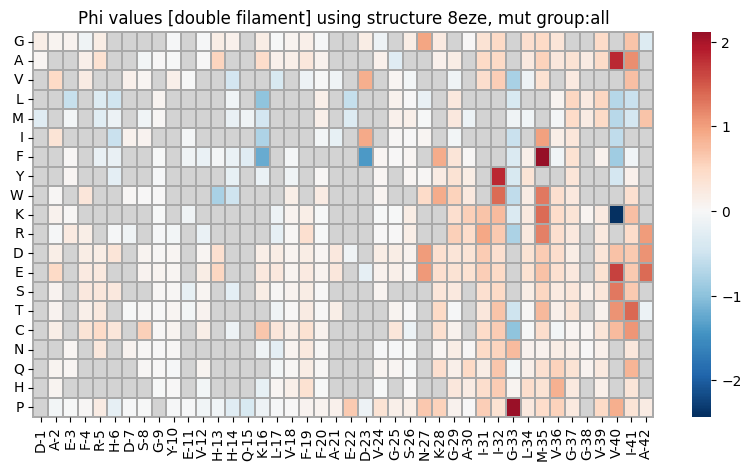

In [114]:
for run in foldX_runs:

    group = 'all' # all mutations' phi values

    fig = plt.figure(figsize=(10, 5))

    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run]['phi_min_max_abs_ddG'], cmap=cmap_universal, 
                #vmin = 0, vmax = 1,    
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                    #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                    mask=masks_phi_min_abs_ddG[run],
                    linewidths=0.005, linecolor='darkgrey', clip_on=False,
                    center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values [double filament] using structure ' + run + ', mut group:' + group)
    
    #plt.savefig('./figures/20240509_phi_values_double_filament_full_heatmap_structure_' + run + '.pdf', bbox_inches='tight', 
    #        transparent=True)

In [115]:
for run in foldX_runs:
    print(run)
    print(phi_values_min_max_abs_ddG[run]['all'][phi_values_min_max_abs_ddG[run]['all']['phi_value'] < 0]['ddEa_sign_ddG_sign'].value_counts())
    print()

2nao
ddEa_sign_ddG_sign
+_-    72
-_+    61
Name: count, dtype: int64

5kk3
ddEa_sign_ddG_sign
-_+    54
+_-    40
Name: count, dtype: int64

5oqv
ddEa_sign_ddG_sign
+_-    90
-_+    66
Name: count, dtype: int64

7q4b
ddEa_sign_ddG_sign
-_+    64
+_-    51
Name: count, dtype: int64

7q4m
ddEa_sign_ddG_sign
-_+    48
+_-    42
Name: count, dtype: int64

8ezd
ddEa_sign_ddG_sign
+_-    56
-_+    43
Name: count, dtype: int64

8eze
ddEa_sign_ddG_sign
-_+    69
+_-    67
Name: count, dtype: int64



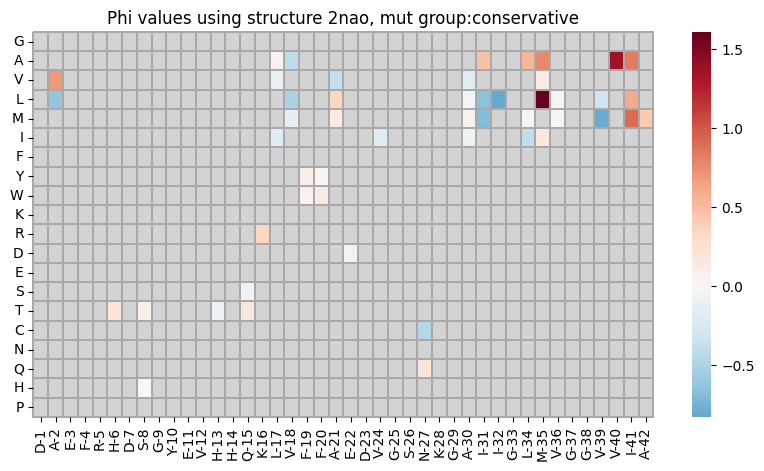

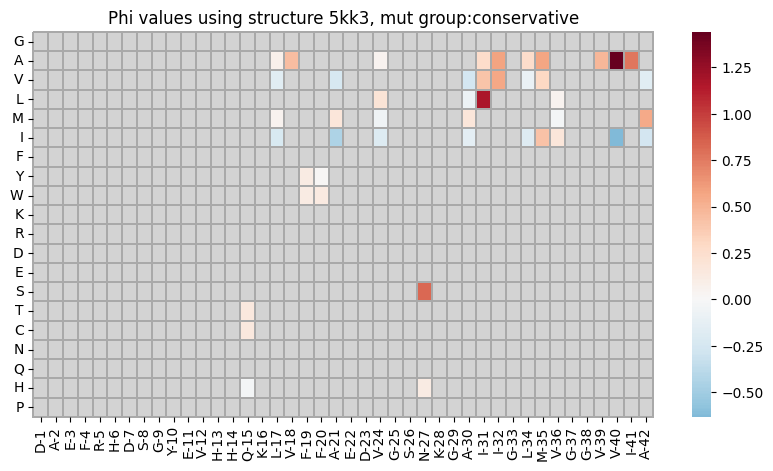

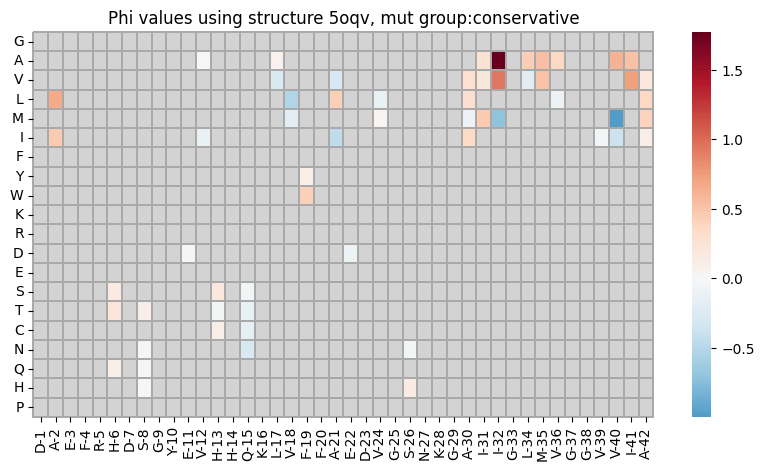

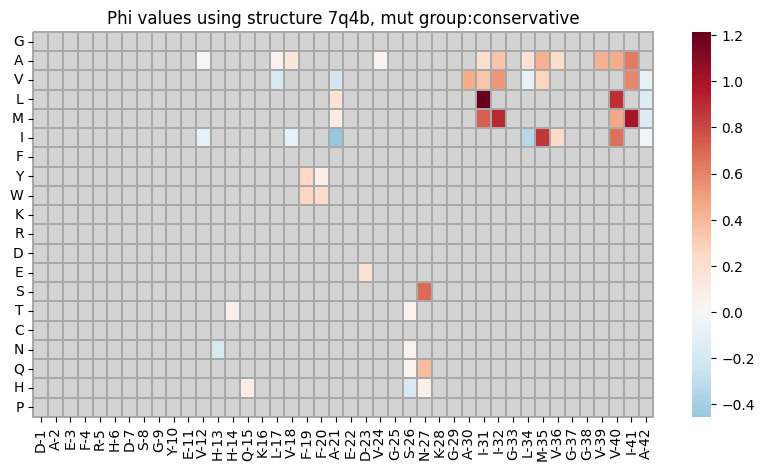

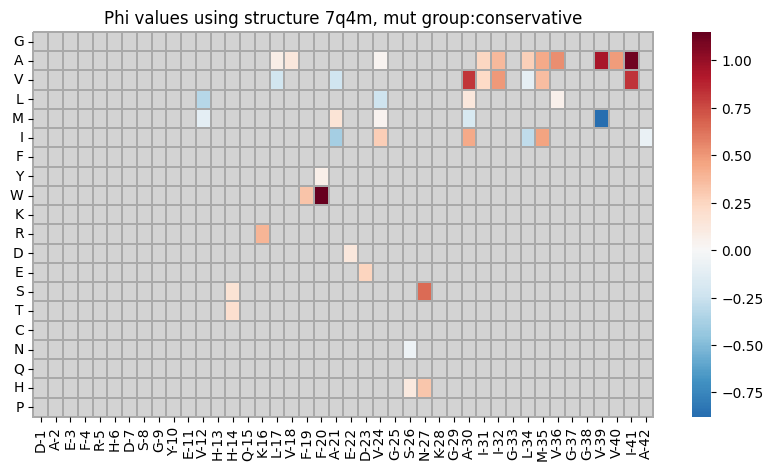

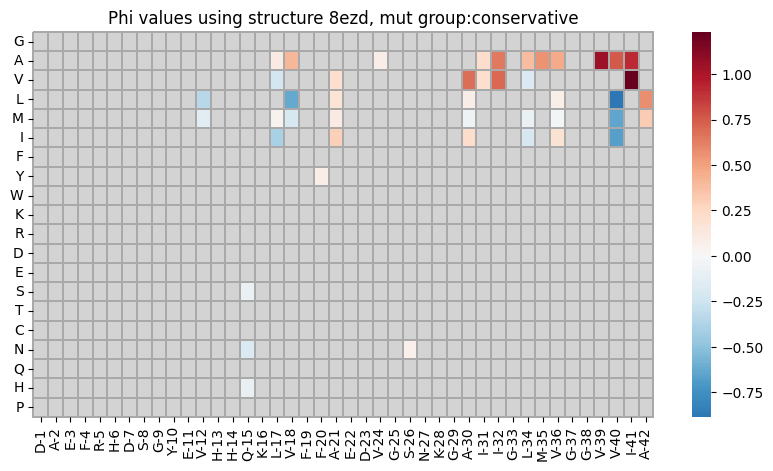

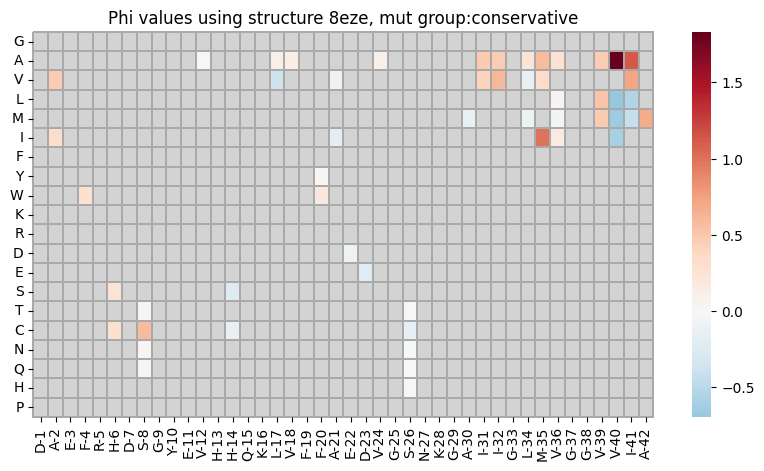

In [116]:
for run in foldX_runs:

    group = 'conservative' # all mutations' phi values

    fig = plt.figure(figsize=(10, 5))

    curr_mutations = list(set(weights_Nucleation[weights_Nucleation[group] == 1]['id']) & set(phi_values[run][group].index))

    sns.heatmap(dfs_to_plot_phi[run]['phi_min_max_abs_ddG'], cmap=cmap_universal, 
                #vmin = 0, vmax = 1,    
                #vmin = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.05),
                    #vmax = np.quantile(phi_values[run][group].loc[curr_mutations, 'phi_value'], 0.95),
                    mask=masks_phi_min_abs_ddG_cons[run],
                    linewidths=0.005, linecolor='darkgrey', clip_on=False,
                    center=0)
    plt.yticks(rotation=0) 
    #plt.xticks(rotation=0) 
    plt.title('Phi values using structure ' + run + ', mut group:' + group)

# now plot average! 

In [94]:
x_order = [elem + '-' + str(idx+1) for idx,elem in enumerate(list(AB_WT))]
#x_order

In [95]:
dfs_for_violinplots_min_max_abs_ddG = {}

for run in foldX_runs:
    print(run)
    dfs_for_violinplots_min_max_abs_ddG[run] = phi_values[run]['all'][(abs(phi_values[run]['all']['ddG']) > min_ddG) & (abs(phi_values[run]['all']['ddG']) < max_ddG)]    
    print(len(dfs_for_violinplots_min_max_abs_ddG[run]), 'selected mutations here out of total', len(phi_values[run]['all']))
    

2nao
461 selected mutations here out of total 798
5kk3
409 selected mutations here out of total 608
5oqv
546 selected mutations here out of total 798
7q4b
456 selected mutations here out of total 646
7q4m
400 selected mutations here out of total 589
8ezd
402 selected mutations here out of total 589
8eze
520 selected mutations here out of total 798


/tmp/ipykernel_3796164/4199493436.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dfs_for_violinplots_min_max_abs_ddG['5oqv']['phi_value'])


<Axes: xlabel='phi_value', ylabel='Density'>

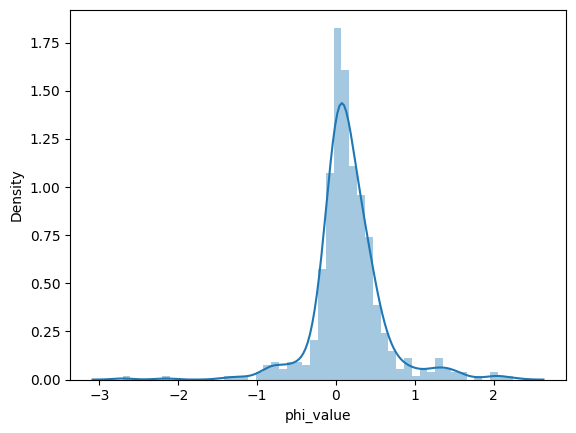

In [122]:
sns.distplot(dfs_for_violinplots_min_max_abs_ddG['5oqv']['phi_value'])

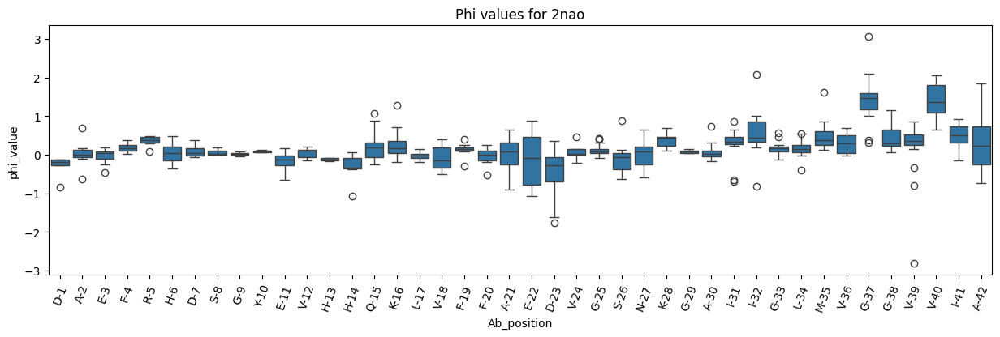

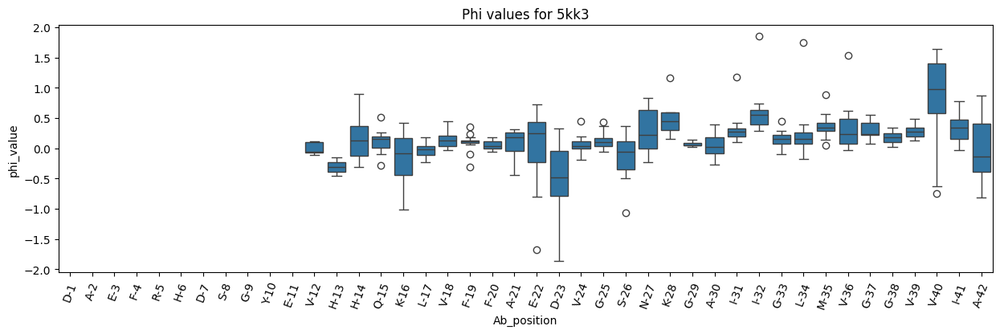

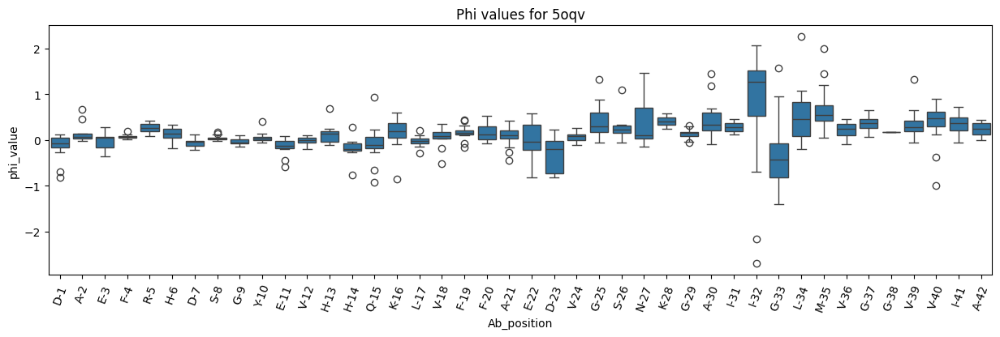

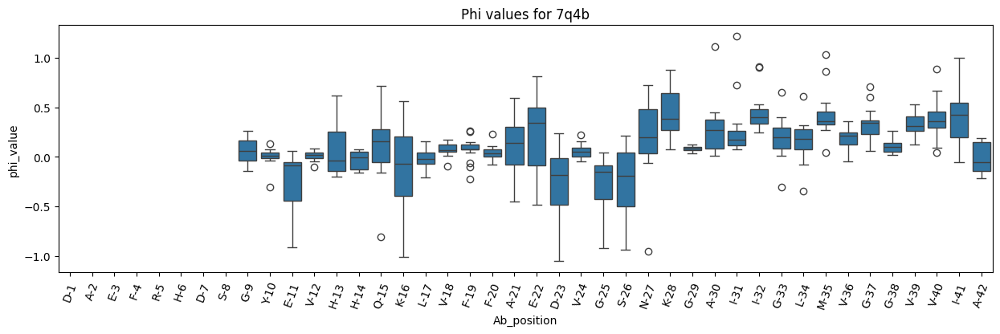

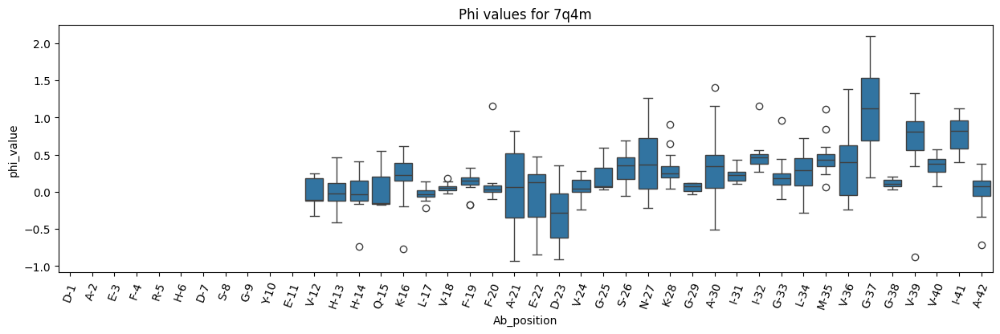

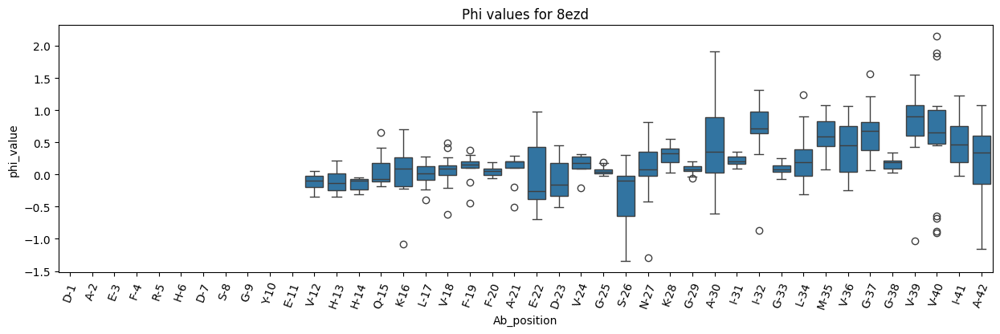

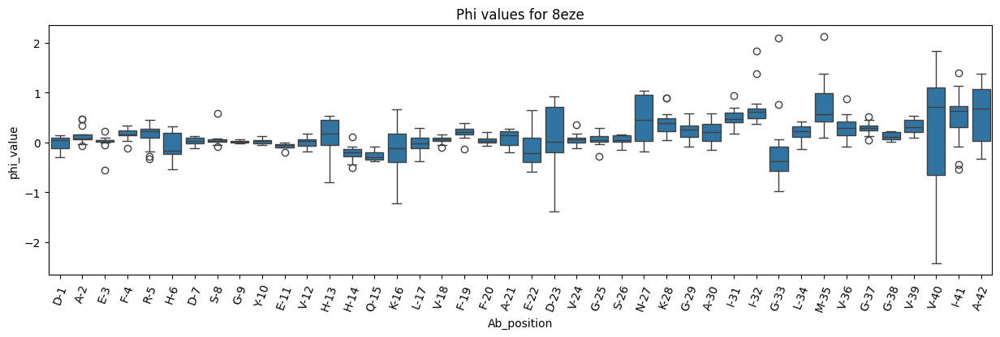

In [123]:
for run in foldX_runs:
    
    fig = plt.figure(figsize=(15, 4))

    sns.boxplot(data=dfs_for_violinplots_min_max_abs_ddG[run], x = 'Ab_position', y = 'phi_value', 
                   #density_norm = 'count', # density_norm{“area”, “count”, “width”}
                   #inner=None,
                order = x_order
                  )
    plt.title('Phi values for ' + run)
    plt.xticks(rotation=70)

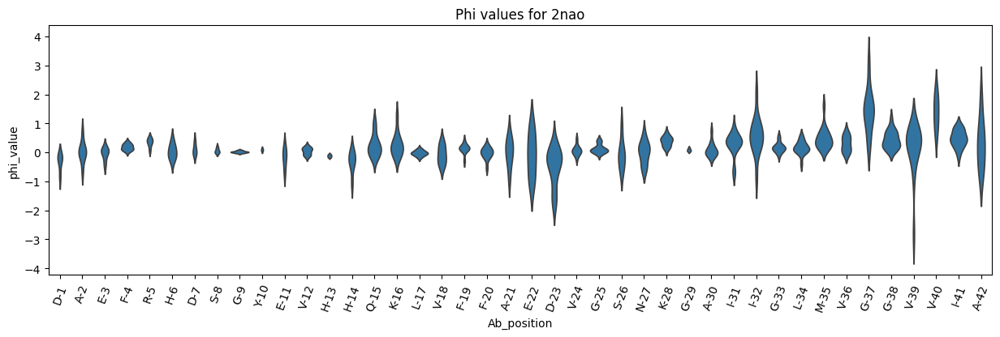

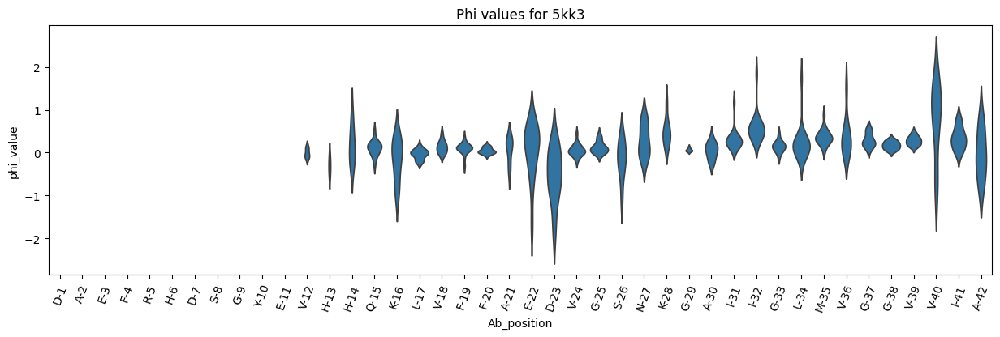

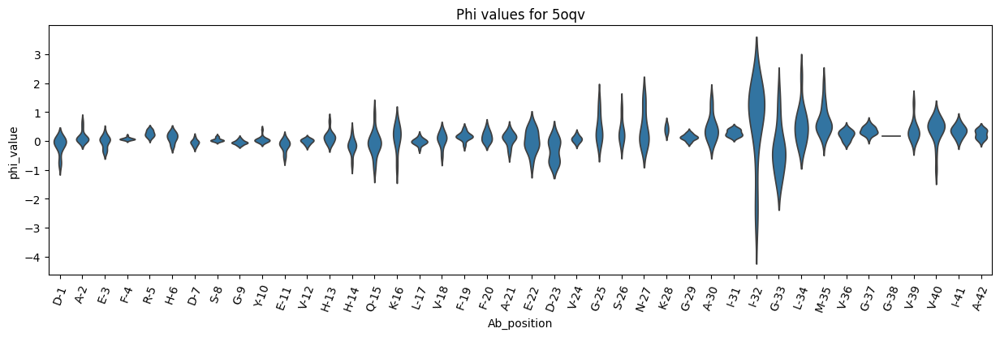

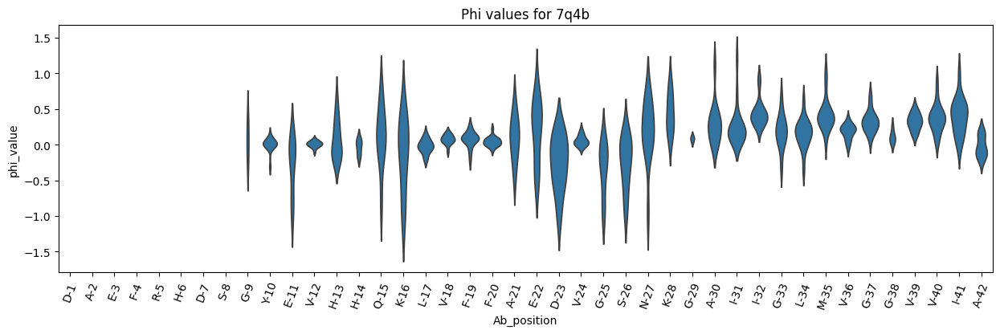

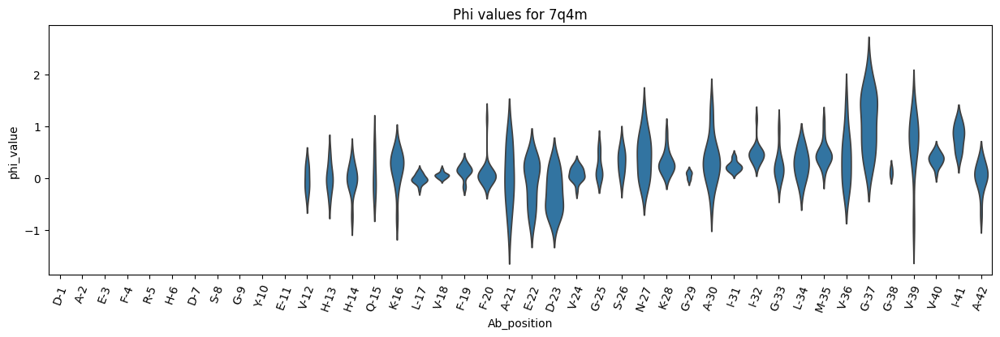

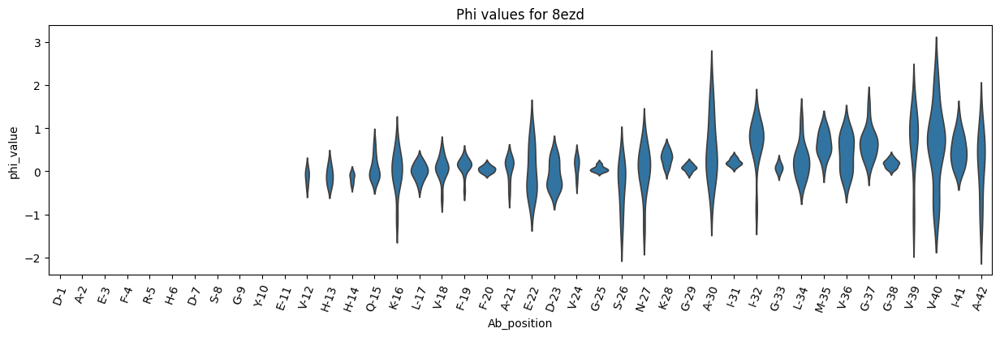

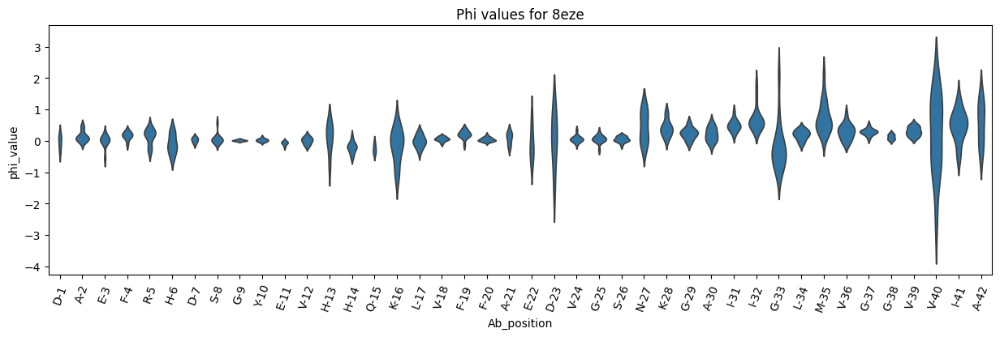

In [124]:
for run in foldX_runs:
    
    fig = plt.figure(figsize=(15, 4))

    sns.violinplot(data=dfs_for_violinplots_min_max_abs_ddG[run], x = 'Ab_position', y = 'phi_value', 
                   density_norm = 'count', # density_norm{“area”, “count”, “width”}
                   inner=None,
                order = x_order
                  )
    plt.title('Phi values for ' + run)
    plt.xticks(rotation=70)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41],
 [Text(0, 0, 'D-1'),
  Text(1, 0, 'A-2'),
  Text(2, 0, 'E-3'),
  Text(3, 0, 'F-4'),
  Text(4, 0, 'R-5'),
  Text(5, 0, 'H-6'),
  Text(6, 0, 'D-7'),
  Text(7, 0, 'S-8'),
  Text(8, 0, 'G-9'),
  Text(9, 0, 'Y-10'),
  Text(10, 0, 'E-11'),
  Text(11, 0, 'V-12'),
  Text(12, 0, 'H-13'),
  Text(13, 0, 'H-14'),
  Text(14, 0, 'Q-15'),
  Text(15, 0, 'K-16'),
  Text(16, 0, 'L-17'),
  Text(17, 0, 'V-18'),
  Text(18, 0, 'F-19'),
  Text(19, 0, 'F-20'),
  Text(20, 0, 'A-21'),
  Text(21, 0, 'E-22'),
  Text(22, 0, 'D-23'),
  Text(23, 0, 'V-24'),
  Text(24, 0, 'G-25'),
  Text(25, 0, 'S-26'),
  Text(26, 0, 'N-27'),
  Text(27, 0, 'K-28'),
  Text(28, 0, 'G-29'),
  Text(29, 0, 'A-30'),
  Text(30, 0, 'I-31'),
  Text(31, 0, 'I-32'),
  Text(32, 0, 'G-33'),
  Text(33, 0, 'L-

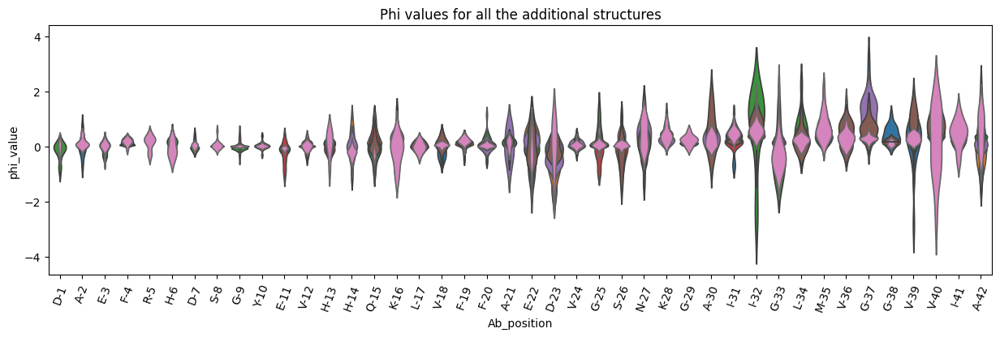

In [125]:
fig = plt.figure(figsize=(15, 4))

for run in foldX_runs:

    sns.violinplot(data=dfs_for_violinplots_min_max_abs_ddG[run], x = 'Ab_position', y = 'phi_value', 
                   density_norm = 'count', # density_norm{“area”, “count”, “width”}
                   inner=None,
                order = x_order
                  )

plt.title('Phi values for all the additional structures')
plt.xticks(rotation=70)

In [126]:
for run in foldX_runs:
    dfs_for_violinplots_min_max_abs_ddG[run]['structure'] = [run for i in range(0,len(dfs_for_violinplots_min_max_abs_ddG[run]))]
    

/tmp/ipykernel_3796164/1373508212.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_for_violinplots_min_max_abs_ddG[run]['structure'] = [run for i in range(0,len(dfs_for_violinplots_min_max_abs_ddG[run]))]
/tmp/ipykernel_3796164/1373508212.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_for_violinplots_min_max_abs_ddG[run]['structure'] = [run for i in range(0,len(dfs_for_violinplots_min_max_abs_ddG[run]))]
/tmp/ipykernel_3796164/1373508212.py:2: SettingWithCopyWarning: 
A value is trying to be

In [96]:
dfs_for_violinplots_min_max_abs_ddG_altogether = pd.concat(dfs_for_violinplots_min_max_abs_ddG.values(), axis=0)

In [97]:
dfs_for_violinplots_min_max_abs_ddG_altogether

,phi_value,ddEa,ddG,VDW_clashes_from_FoldX,Ab_position,new_aa,ddEa_sign,ddG_sign,ddEa_sign_ddG_sign
D23G,0.082560,-0.282565,-3.422550,-1.425795,D-23,G,-,-,-_-
I41Y,0.087789,0.140005,1.594795,2.402007,I-41,Y,+,+,+_+
I32L,-0.827139,1.351679,-1.634162,-0.316145,I-32,L,+,-,+_-
F20R,-0.022016,-0.049069,2.228767,-0.047809,F-20,R,-,+,-_+
Q15I,0.203582,-0.412183,-2.024650,0.401487,Q-15,I,-,-,-_-
...,...,...,...,...,...,...,...,...,...
G38N,0.014447,0.138501,9.586975,13.231275,G-38,N,+,+,+_+
M35W,1.275226,1.257964,0.986464,2.185258,M-35,W,+,+,+_+
H6F,-0.182954,0.198976,-1.087573,-0.236085,H-6,F,+,-,+_-
V24P,0.350690,0.658310,1.877188,6.952525,V-24,P,+,+,+_+


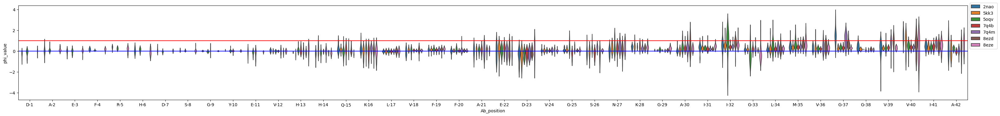

In [130]:
fig = plt.figure(figsize=(40, 4))

ax = plt.subplot(111)

sns.violinplot(data=dfs_for_violinplots_min_max_abs_ddG_altogether, x = 'Ab_position', y = 'phi_value', 
               hue = 'structure',
                   density_norm = 'count', # density_norm{“area”, “count”, “width”}
                   inner=None,
                order = x_order
                  )

ax.legend(bbox_to_anchor=(1, 1.05))

plt.axhline(0, c='blue')
plt.axhline(1, c='red')

#plt.savefig('./figures/20240418_phi_values_min_abs_ddG_additional_structure_double_filament_analysis.pdf',
#           bbox_inches = 'tight')

plt.savefig('./figures/20240611_phi_values_min_abs_ddG_additional_structure_double_filament_analysis_UPD.pdf',
           bbox_inches = 'tight')

(0.0, 1.0)

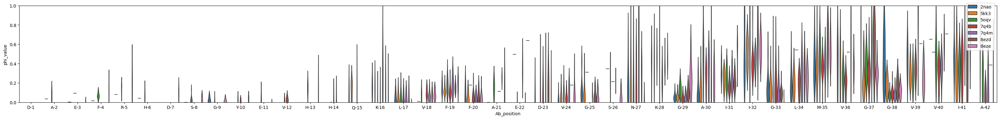

In [95]:
fig = plt.figure(figsize=(40, 4))

ax = plt.subplot(111)

sns.violinplot(data=dfs_for_violinplots_min_abs_ddG_altogether, x = 'Ab_position', y = 'phi_value', 
               hue = 'structure',
                   density_norm = 'count', # density_norm{“area”, “count”, “width”}
                   inner=None,
                order = x_order
                  )

ax.legend(bbox_to_anchor=(1, 1.05))


plt.ylim(0,1)
#plt.axhline(0, c='blue')
#plt.axhline(1, c='red')

#plt.savefig('./figures/20240402_phi_values_min_abs_ddG_additional_structure.pdf',
#           bbox_inches = 'tight')

## Stat test for C-terminal vs N-terminal phi values

In [98]:
for run in foldX_runs:
    dfs_for_violinplots_min_max_abs_ddG[run]['position'] = [Ab_position.split('-')[1] for Ab_position in dfs_for_violinplots_min_max_abs_ddG[run]['Ab_position']]
    dfs_for_violinplots_min_max_abs_ddG[run]['terminus'] = ['C-terminus' if int(pos) > 27 else 'N-terminus' for pos in dfs_for_violinplots_min_max_abs_ddG[run]['position']]
    

/tmp/ipykernel_326664/3179389209.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_for_violinplots_min_max_abs_ddG[run]['position'] = [Ab_position.split('-')[1] for Ab_position in dfs_for_violinplots_min_max_abs_ddG[run]['Ab_position']]
/tmp/ipykernel_326664/3179389209.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_for_violinplots_min_max_abs_ddG[run]['terminus'] = ['C-terminus' if int(pos) > 27 else 'N-terminus' for pos in dfs_for_violinplots_min_max_abs_ddG[run]['position']]
/tmp/ipykernel_

In [133]:
dfs_for_violinplots_min_max_abs_ddG_altogether = pd.concat(dfs_for_violinplots_min_max_abs_ddG.values(), axis=0)

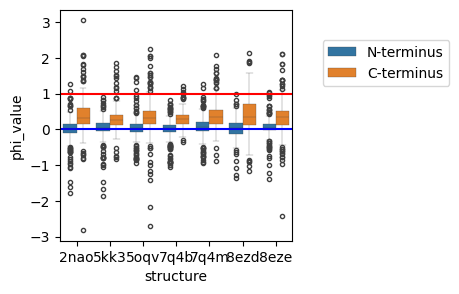

In [136]:
fig = plt.figure(figsize=(3, 3))

ax = plt.subplot(111)

sns.boxplot(data=dfs_for_violinplots_min_max_abs_ddG_altogether, x = 'structure', y = 'phi_value', 
               hue = 'terminus',
            hue_order=['N-terminus','C-terminus'],
            flierprops={"marker": "."},
            linewidth=0.2
            
                #order = ['N','C']
                  )

ax.legend(bbox_to_anchor=(1.1, 0.9))

#plt.ylim(-1.2, 1.5)

plt.axhline(0, c='blue')
plt.axhline(1, c='red')

plt.savefig('./figures/20240611_phi_values_double_filament_min_max_abs_ddG_all_structures_UPD.pdf',
           bbox_inches = 'tight')

## Stat test for APR2 vs APR1 phi values

In [99]:
dfs_for_violinplots_min_max_abs_ddG['7q4b']

,phi_value,ddEa,ddG,VDW_clashes_from_FoldX,Ab_position,new_aa,ddEa_sign,ddG_sign,ddEa_sign_ddG_sign,position,terminus
D23G,0.205030,-0.282565,-1.378162,-0.042000,D-23,G,-,-,-_-,23,N-terminus
I41Y,0.048523,0.140005,2.885350,3.309425,I-41,Y,+,+,+_+,41,C-terminus
V36G,0.224774,0.966701,4.300775,-0.032151,V-36,G,+,+,+_+,36,C-terminus
A30Y,0.389745,1.182288,3.033488,8.236550,A-30,Y,+,+,+_+,30,C-terminus
N27S,0.686044,0.783892,1.142627,0.012478,N-27,S,+,+,+_+,27,N-terminus
...,...,...,...,...,...,...,...,...,...,...,...
L34C,-0.006189,-0.018686,3.019350,-0.016096,L-34,C,-,+,-_+,34,C-terminus
N27G,0.719613,0.936001,1.300700,-0.015141,N-27,G,+,+,+_+,27,N-terminus
G38N,0.016226,0.138501,8.535512,14.488100,G-38,N,+,+,+_+,38,C-terminus
M35W,0.280276,1.257964,4.488313,7.357450,M-35,W,+,+,+_+,35,C-terminus


In [104]:
def assign_APR_region(mut_id):
    
    mut_id_int = int(mut_id)
    
    if mut_id_int in [17,18,19,20,21]:
        result = 'APR1'
    elif mut_id_int in [29,30,31,32,33,34,35,36,37,38,39,40,41,42]:
        result = 'APR2'
    else:
        result = 'NA'
        
    return(result)

In [106]:
for run in foldX_runs:
    dfs_for_violinplots_min_max_abs_ddG[run]['position'] = [Ab_position.split('-')[1] for Ab_position in dfs_for_violinplots_min_max_abs_ddG[run]['Ab_position']]
    dfs_for_violinplots_min_max_abs_ddG[run]['APR_region'] = dfs_for_violinplots_min_max_abs_ddG[run]['position'].apply(lambda x: assign_APR_region(x))

/tmp/ipykernel_326664/3544190206.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_for_violinplots_min_max_abs_ddG[run]['position'] = [Ab_position.split('-')[1] for Ab_position in dfs_for_violinplots_min_max_abs_ddG[run]['Ab_position']]
/tmp/ipykernel_326664/3544190206.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_for_violinplots_min_max_abs_ddG[run]['APR_region'] = dfs_for_violinplots_min_max_abs_ddG[run]['position'].apply(lambda x: assign_APR_region(x))


In [108]:
dfs_for_violinplots_min_max_abs_ddG['7q4b']['APR_region'].value_counts()

APR_region
APR2    208
NA      168
APR1     80
Name: count, dtype: int64

In [115]:
dfs_for_violinplots_min_max_abs_ddG_APR = {}
for run in foldX_runs:
    print(run)
    dfs_for_violinplots_min_max_abs_ddG_APR[run] = dfs_for_violinplots_min_max_abs_ddG[run][dfs_for_violinplots_min_max_abs_ddG[run]['APR_region'] != 'NA']
    dfs_for_violinplots_min_max_abs_ddG_APR[run]['structure'] = [run for i in range(len(dfs_for_violinplots_min_max_abs_ddG_APR[run]))]
    

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


/tmp/ipykernel_326664/153762407.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_for_violinplots_min_max_abs_ddG_APR[run]['structure'] = [run for i in range(len(dfs_for_violinplots_min_max_abs_ddG_APR[run]))]
/tmp/ipykernel_326664/153762407.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_for_violinplots_min_max_abs_ddG_APR[run]['structure'] = [run for i in range(len(dfs_for_violinplots_min_max_abs_ddG_APR[run]))]
/tmp/ipykernel_326664/153762407.py:5: SettingWithCopyWarning: 
A value is trying

In [116]:
dfs_for_violinplots_min_max_abs_ddG_altogether_APR = pd.concat(dfs_for_violinplots_min_max_abs_ddG_APR.values(), axis=0)

In [117]:
dfs_for_violinplots_min_max_abs_ddG_altogether_APR.columns

Index(['phi_value', 'ddEa', 'ddG', 'VDW_clashes_from_FoldX', 'Ab_position',
       'new_aa', 'ddEa_sign', 'ddG_sign', 'ddEa_sign_ddG_sign', 'position',
       'terminus', 'APR_region', 'mut_id', 'structure'],
      dtype='object')

In [122]:
phi_APR1_double = list(dfs_for_violinplots_min_max_abs_ddG_altogether_APR[dfs_for_violinplots_min_max_abs_ddG_altogether_APR['APR_region'] == 'APR1']['phi_value'])
phi_APR2_double = list(dfs_for_violinplots_min_max_abs_ddG_altogether_APR[dfs_for_violinplots_min_max_abs_ddG_altogether_APR['APR_region'] == 'APR2']['phi_value'])


In [123]:
scipy.stats.mannwhitneyu(phi_APR2_double, phi_APR1_double, alternative='greater')

MannwhitneyuResult(statistic=556478.0, pvalue=1.0834154075690015e-82)

In [124]:
for run in foldX_runs:
    print(run)
    dfs_for_violinplots_min_max_abs_ddG_APR[run] 
    
    phi_APR1_double = list(dfs_for_violinplots_min_max_abs_ddG_APR[run][dfs_for_violinplots_min_max_abs_ddG_APR[run]['APR_region'] == 'APR1']['phi_value'])
    phi_APR2_double = list(dfs_for_violinplots_min_max_abs_ddG_APR[run][dfs_for_violinplots_min_max_abs_ddG_APR[run]['APR_region'] == 'APR2']['phi_value'])

    print(scipy.stats.mannwhitneyu(phi_APR2_double, phi_APR1_double, alternative='greater'))

2nao
MannwhitneyuResult(statistic=8815.0, pvalue=2.8399868078588276e-13)
5kk3
MannwhitneyuResult(statistic=11410.0, pvalue=5.494834905780485e-13)
5oqv
MannwhitneyuResult(statistic=11222.0, pvalue=9.889423840599526e-11)
7q4b
MannwhitneyuResult(statistic=13865.0, pvalue=9.897367628803546e-19)
7q4m
MannwhitneyuResult(statistic=11540.0, pvalue=2.3756782058001336e-16)
8ezd
MannwhitneyuResult(statistic=11747.0, pvalue=2.5396824094503993e-12)
8eze
MannwhitneyuResult(statistic=11168.0, pvalue=2.474281518568573e-11)


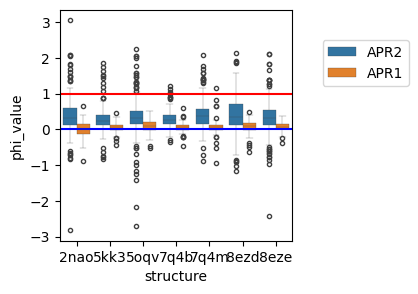

In [118]:
fig = plt.figure(figsize=(3, 3))

ax = plt.subplot(111)

sns.boxplot(data=dfs_for_violinplots_min_max_abs_ddG_altogether_APR, x = 'structure', y = 'phi_value', 
               hue = 'APR_region',
            #hue_order=['N-terminus','C-terminus'],
            flierprops={"marker": "."},
            linewidth=0.2
            
                #order = ['N','C']
                  )

ax.legend(bbox_to_anchor=(1.1, 0.9))

#plt.ylim(-1.2, 1.5)

plt.axhline(0, c='blue')
plt.axhline(1, c='red')

plt.savefig('./figures/20240614_phi_values_double_filament_min_max_abs_ddG_all_structures_APR_regions.pdf',
           bbox_inches = 'tight')

In [137]:
# stats saved from each test

df_stats = pd.DataFrame(index = foldX_runs, columns = ['statistic','p_value'])

for run in foldX_runs:
    C_term_phi_values = dfs_for_violinplots_min_max_abs_ddG[run][dfs_for_violinplots_min_max_abs_ddG[run]['terminus'] == 'C-terminus']['phi_value']
    N_term_phi_values = dfs_for_violinplots_min_max_abs_ddG[run][dfs_for_violinplots_min_max_abs_ddG[run]['terminus'] == 'N-terminus']['phi_value']
    
    curr_test = scipy.stats.mannwhitneyu(C_term_phi_values, N_term_phi_values, alternative='greater')
    
    df_stats.loc[run,'statistic'] = curr_test[0]
    df_stats.loc[run,'p_value'] = curr_test[1]
    

In [138]:
df_stats

,statistic,p_value
2nao,41244.0,0.0
5kk3,31234.0,0.0
5oqv,55474.0,0.0
7q4b,42633.0,0.0
7q4m,30833.0,0.0
8ezd,31500.0,0.0
8eze,51174.0,0.0


In [139]:
import sys
sys.float_info

sys.float_info(max=1.7976931348623157e+308, max_exp=1024, max_10_exp=308, min=2.2250738585072014e-308, min_exp=-1021, min_10_exp=-307, dig=15, mant_dig=53, epsilon=2.220446049250313e-16, radix=2, rounds=1)

# Producing phi-value colour vectors to overlay on the atomic structures of Ab42

In [96]:
mutation_groups

['all',
 'conservative',
 'mild_ddEa_effect_window_1.5',
 'mild_ddEa_effect_window_1',
 'mild_ddEa_effect_window_0.5',
 'mild_ddEa_effect_window_0.2',
 'mild_ddEa_effect_window_0.1',
 'mild_ddEa_effect_window_0.05',
 'conservative_and_mild_ddEa_effect_window_1.5',
 'conservative_and_mild_ddEa_effect_window_1',
 'conservative_and_mild_ddEa_effect_window_0.5',
 'conservative_and_mild_ddEa_effect_window_0.2',
 'conservative_and_mild_ddEa_effect_window_0.1',
 'conservative_and_mild_ddEa_effect_window_0.05']

In [97]:
# vectors to be translated into color
phi_values_for_atomic_representation_min_abs_ddG = {}

for run in foldX_runs:
    phi_values_for_atomic_representation_min_abs_ddG[run] = list(dfs_to_plot_phi[run]['phi_min_abs_ddG'].mean())

In [98]:
phi_min_abs_ddG = {}

for run in foldX_runs:
    phi_min_abs_ddG[run] = dfs_to_plot_phi[run]['phi_min_abs_ddG']
    
    # go over all elements and check that if mut not conservative I write np.nan there
    for aa in list(dfs_to_plot_phi[run]['phi_min_abs_ddG'].index):
        for pos in list(dfs_to_plot_phi[run]['phi_min_abs_ddG'].columns):
            curr_mut_id = pos.split('-')[0] + pos.split('-')[1] + aa
            
            if curr_mut_id in list(weights_Nucleation['id']):
                
                is_conservative = weights_Nucleation.set_index('id', inplace=False).loc[curr_mut_id, 'conservative']

                #if is_conservative == 0:
                    # overwrite to np.nan
                    #phi_cons_bw_0_and_1_min_ddG[run].loc[aa, pos] = np.nan

### now skip to "Working with PDB"

In [211]:
# working with phi values, no ddG capping 

# this is for (A) all mutations
per_position_phi_values_average_all_mutations = {}
per_position_phi_values_max_all_mutations = {}


for run in foldX_runs:
    print(run)
    
    positions = list(dfs_to_plot_phi[run].columns)

    per_position_phi_values_average_all_mutations[run] = []
    per_position_phi_values_max_all_mutations[run] = []
    
    for position in positions:
        
        if np.isnan(dfs_to_plot_phi[run].loc[:,position]).all() == True:
            per_position_phi_values_average_all_mutations[run].append(np.nan)
            per_position_phi_values_max_all_mutations[run].append(np.nan)
        else:
            curr_average = np.round(dfs_to_plot_phi[run][dfs_to_plot_phi[run][position].notnull()][position].mean(), 2)
            per_position_phi_values_average_all_mutations[run].append(curr_average)
            
            curr_max = np.round(max(dfs_to_plot_phi[run][dfs_to_plot_phi[run][position].notnull()][position]), 2)
            per_position_phi_values_max_all_mutations[run].append(curr_max)
        
        

7q4b
7q4m


In [212]:
dfs_ddEa_mut['conservative'].index

Index(['G', 'A', 'V', 'L', 'M', 'I', 'F', 'Y', 'W', 'K', 'R', 'D', 'E', 'S',
       'T', 'C', 'N', 'Q', 'H', 'P', '*'],
      dtype='object')

In [213]:
np.unique(dfs_to_plot_phi['7q4b'] == 0)

array([False])

In [214]:
np.unique(dfs_to_plot_phi['7q4m'] == 0)

array([False])

In [215]:
overlay_dfs_phi = {}

for run in foldX_runs:
    overlay_dfs_phi[run] = {}
    
    for group in mutation_groups:
        # skipping stop codon row
        overlay_dfs_phi[run][group] = dfs_ddEa_mut[group].loc[['G', 'A', 'V', 'L', 'M', 'I', 'F', 'Y', 'W', 'K', 'R', 'D', 'E', 'S',
           'T', 'C', 'N', 'Q', 'H', 'P']] * dfs_to_plot_phi[run] 
        overlay_dfs_phi[run][group] = overlay_dfs_phi[run][group]#.fillna(0)

In [216]:
# in here 0 or NaN means we are not considering this particular mutation in the group (conservative or other)
overlay_dfs_phi['7q4b']['conservative']

,D-1,A-2,E-3,F-4,R-5,H-6,D-7,S-8,G-9,Y-10,...,G-33,L-34,M-35,V-36,G-37,G-38,V-39,V-40,I-41,A-42
G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.000000,...,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000
A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-0.000000,...,0.0,0.303115,0.423672,0.525360,0.0,0.0,1.024270,0.464315,0.869566,NaN
V,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.000000,...,0.0,-0.196055,0.274912,NaN,0.0,0.0,NaN,NaN,0.891000,-0.098706
L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,0.000000,...,0.0,NaN,-9.611140,0.102989,0.0,0.0,-0.678595,0.832204,-3.310113,-0.166772
M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,-0.000000,...,0.0,0.311590,NaN,-0.066151,0.0,0.0,-0.779519,0.613222,6.098777,-0.180839
I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.000000,...,0.0,-0.485968,0.860314,0.172698,0.0,0.0,0.072979,3.900219,NaN,-0.042049
F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-0.054241,...,0.0,0.000000,0.000000,-0.000000,0.0,0.0,-0.000000,0.000000,-0.000000,-0.000000
Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,0.0,-0.000000,0.000000,-0.000000,0.0,0.0,-0.000000,0.000000,0.000000,0.000000
W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,-0.857226,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,-0.000000,0.000000,0.000000,0.000000
K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000


In [217]:
# working with phi values, no ddG capping 

# this is for (B) conservative; (C) mild effect; and (D) conservative & mild effect mutations

per_position_phi_values_average = {}
per_position_phi_values_max = {}

for run in foldX_runs:
    print(run)
    
    per_position_phi_values_average[run] = {}
    per_position_phi_values_max[run] = {}
    
    for group in mutation_groups:
        
        positions = list(overlay_dfs_phi[run][group].columns)

        per_position_phi_values_average[run][group] = []
        per_position_phi_values_max[run][group] = []

        for position in positions:

            if np.isnan(overlay_dfs_phi[run][group].loc[:,position]).all() == True:
                per_position_phi_values_average[run][group].append(np.nan)
                per_position_phi_values_max[run][group].append(np.nan)
            else:
                curr_average = np.round(overlay_dfs_phi[run][group][overlay_dfs_phi[run][group][position].notnull()][position].mean(), 2)
                per_position_phi_values_average[run][group].append(curr_average)

                curr_max = np.round(max(overlay_dfs_phi[run][group][overlay_dfs_phi[run][group][position].notnull()][position]), 2)
                per_position_phi_values_max[run][group].append(curr_max)



7q4b
7q4m


In [218]:
per_position_phi_values_average_all_mutations['7q4b']

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.4,
 0.76,
 0.54,
 -0.17,
 0.07,
 -3.23,
 4.04,
 -0.13,
 -0.14,
 -0.06,
 0.09,
 0.04,
 3.22,
 -6.28,
 -0.25,
 0.06,
 -0.49,
 0.31,
 0.62,
 1.94,
 0.04,
 0.16,
 0.26,
 0.83,
 1.44,
 0.2,
 -0.11,
 5.87,
 0.49,
 0.1,
 1.25,
 0.53,
 0.8,
 0.18]

In [219]:
per_position_phi_values_average_all_mutations['7q4m']

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 -0.29,
 -0.62,
 11.17,
 1.26,
 0.83,
 -0.03,
 0.02,
 0.13,
 0.08,
 -0.05,
 -0.14,
 -0.27,
 0.11,
 0.39,
 0.51,
 -63.3,
 -0.55,
 0.04,
 0.38,
 -0.42,
 0.38,
 0.15,
 0.26,
 0.69,
 -1.24,
 1.23,
 0.08,
 -5.94,
 0.03,
 0.76,
 -0.12]

In [220]:
per_position_phi_values_average['7q4b']['conservative']

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.0,
 -0.05,
 -0.01,
 -0.05,
 0.08,
 -3.51,
 0.14,
 0.08,
 -0.07,
 -0.04,
 0.03,
 0.01,
 -0.02,
 0.07,
 0.01,
 0.01,
 0.0,
 0.03,
 0.34,
 2.18,
 0.0,
 0.08,
 0.13,
 0.52,
 0.0,
 -0.0,
 -0.42,
 0.04,
 0.0,
 0.0,
 -0.02,
 0.31,
 0.24,
 -0.03]

In [151]:
curr_df = pd.DataFrame(per_position_phi_values_average['7q4b'])
curr_cmap = matplotlib.colormaps.get('RdBu_r')
curr_cmap.set_bad("lightgrey")
curr_mask = curr_df.isnull()

In [165]:
max(curr_df[curr_df[0].notnull()][0])

6.3

In [166]:
min(curr_df[curr_df[0].notnull()][0])

-5.91

In [155]:
curr_df[0]

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8    -0.40
9    -0.76
10   -0.54
11    0.17
12   -0.07
13    3.24
14   -4.04
15    0.13
16    0.13
17    0.01
18   -0.23
19   -0.13
20   -3.22
21    6.30
22    0.25
23   -0.15
24    0.49
25   -0.32
26   -0.76
27   -1.99
28   -0.41
29   -0.46
30   -0.60
31   -1.51
32   -1.84
33   -0.36
34   -0.38
35   -5.91
36   -1.32
37   -0.88
38   -1.29
39   -1.03
40   -0.94
41   -0.33
Name: 0, dtype: float64

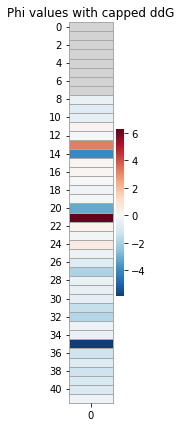

In [147]:
fig = plt.figure(figsize=(1, 7))
sns.heatmap(pd.DataFrame(per_position_phi_values_average['7q4b']), cmap=curr_cmap, 
            #vmin = np.quantile(values[run], 0.05),
            #vmax = np.quantile(values[run], 0.95),
            mask=curr_mask,
            linewidths=1, linecolor='darkgrey', clip_on=False,
            center=0
           )
plt.yticks(rotation=0) 
#plt.xticks(rotation=0) 
plt.title('Phi values with capped ddG')

plt.show()

## Working with PDB

##### Hack from Magda: rewrite the last column in PDB file (called B-factor) for monomer files and colour by it in pymol

- What/where B-factor is: https://proteinstructures.com/structure/protein-databank/
- How to colour by B-factor in PyMOL: https://pymolwiki.org/index.php/Advanced_Coloring#Assign_color_by_B-factor


In [100]:
# read in monomer pdb files, created in PyMOL and then manually resaved into .csv

pdb_files_monomer = {}

pdb_lines = {}

for run in foldX_runs:
    print(run) 
    curr_path = '/lustre/scratch126/gengen/projects/amyloid_beta_epistasis/Phi_analysis/Single_4_stack_filament_analysis/'
    
    if run in ['7q4b','7q4m']:
        pdb_files_monomer[run] = pd.read_csv(curr_path + run + '/' + run + '_monomer.csv', sep='\t', header=None)
    
    else:
        pdb_files_monomer[run] = pd.read_csv(curr_path + 'other_structures/' + run + '/' + run + '_monomer.csv', sep='\t', header=None)
    
    # make a list of pdb lines 
    pdb_lines[run] = [pdb_files_monomer[run].loc[idx,0] for idx in list(pdb_files_monomer[run].index)]
    
    #for row in list(pdb_files_monomer[run].index):
        
    

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [101]:
pdb_lines['2nao'][:5]

['CRYST1    1.000    1.000    1.000  90.00  90.00  90.00 P 1           1',
 'ATOM      1  N   ASP C   1       9.418   6.106  -2.825  1.00  0.00           N  ',
 'ATOM      2  CA  ASP C   1       9.979   5.159  -3.782  1.00  0.00           C  ',
 'ATOM      3  C   ASP C   1       9.857   5.689  -5.207  1.00  0.00           C  ',
 'ATOM      4  O   ASP C   1       8.756   5.795  -5.748  1.00  0.00           O  ']

In [113]:
pdb_lines['2nao'][70:150]

['ATOM     70  HA  ARG C   5      12.586   2.209 -15.738  1.00  0.00           H  ',
 'ATOM     71  HB2 ARG C   5       9.688   1.961 -15.388  1.00  0.00           H  ',
 'ATOM     72  HB3 ARG C   5      10.268   1.295 -16.908  1.00  0.00           H  ',
 'ATOM     73  HG2 ARG C   5      10.577  -0.554 -15.678  1.00  0.00           H  ',
 'ATOM     74  HG3 ARG C   5      12.077   0.249 -15.209  1.00  0.00           H  ',
 'ATOM     75  HD2 ARG C   5      11.409   0.418 -13.092  1.00  0.00           H  ',
 'ATOM     76  HD3 ARG C   5       9.873   1.137 -13.575  1.00  0.00           H  ',
 'ATOM     77  HE  ARG C   5       9.482  -1.471 -14.102  1.00  0.00           H  ',
 'ATOM     78 HH11 ARG C   5      10.679   0.206 -11.296  1.00  0.00           H  ',
 'ATOM     79 HH12 ARG C   5      10.082  -0.973 -10.175  1.00  0.00           H  ',
 'ATOM     80 HH21 ARG C   5       8.692  -3.030 -12.636  1.00  0.00           H  ',
 'ATOM     81 HH22 ARG C   5       8.953  -2.814 -10.939  1.00  0

In [103]:
'ATOM      1  N   LEU B  17     -15.873  -7.040  -8.510  1.00  0.00           N'[23:26]

' 17'

In [104]:
int(' 17')

17

In [143]:
# using all mutations and average phi value

# the B-factor values are the only ones with 2 decimals
# find the values and replace with colormap values

pdb_lines_w_phi_min_abs_ddG = {}

for run in foldX_runs:
    print(run)
    
    pdb_lines_w_phi_min_abs_ddG[run] = []
    
    for i in range(len(pdb_lines[run])):
        curr_pdb_line = pdb_lines[run][i]
        
        #print(curr_pdb_line)
        
        # only proceed if the line starts with 'ATOM'
        curr_beginning = curr_pdb_line.split()[0]
        if curr_beginning == 'ATOM':
            
            #curr_position_id_in_Ab = curr_pdb_line.split()[5]
            
            curr_position_id_in_Ab = curr_pdb_line[23:26]
                        
            #print(curr_position_id_in_Ab)

            # replacing this value
            curr_B_factor = curr_pdb_line.split()[-2]
            # with this value, trying average for now
            # here the index is 8 (pos-1) for pos 9 (pos) bc enumeration starts with 0
            curr_phi_value = np.round(phi_values_for_atomic_representation_min_abs_ddG[run][int(curr_position_id_in_Ab)-1],2) #per_position_phi_values_average[run][int(curr_position_id_in_Ab)-1]

            curr_phi_value = str(curr_phi_value)
            
            # if it's a value like 0.4 (without 2nd decimal point), need to add 0 at the end
            # otherwise pymol representation will break in a weird way (introduce gaps)
            
            if str(curr_phi_value) != 'nan':
            
                if len(str(curr_phi_value)) == 3:
                    old_curr_phi_value = curr_phi_value
                    curr_phi_value = str(curr_phi_value) + '0'
                    #print('making', old_curr_phi_value, 'into', curr_phi_value)

                curr_new_pdb_line = curr_pdb_line.replace(curr_B_factor, curr_phi_value)
                pdb_lines_w_phi_min_abs_ddG[run].append(curr_new_pdb_line)
            
            # if nan, put 0 there to be sure we don't skew the [-1,1] range
            else:
                curr_new_pdb_line = curr_pdb_line.replace(' ' + curr_B_factor + ' ', ' 00.00 ') # was 100.00 with PyMOL
                pdb_lines_w_phi_min_abs_ddG[run].append(curr_new_pdb_line)
        
            
        else:    
            pdb_lines_w_phi_min_abs_ddG[run].append(curr_pdb_line)
    
    

    


2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [144]:
'20.009'.replace(' 0.00 ', 'X')

'20.009'

In [145]:
for run in foldX_runs:
    print(run)
    print(pd.DataFrame(index = [i+1 for i in range(len(phi_values_for_atomic_representation_min_abs_ddG[run]))],
             data = {'phi': phi_values_for_atomic_representation_min_abs_ddG[run]}) )


2nao
         phi
1        NaN
2   0.032808
3   0.003503
4   0.015695
5   0.079526
6   0.040717
7        NaN
8  -0.002793
9   0.019615
10       NaN
11 -0.076471
12       NaN
13       NaN
14 -0.091079
15  0.047066
16  0.106557
17 -0.013730
18  0.007005
19  0.149373
20  0.075535
21 -0.002344
22       NaN
23 -0.230950
24  0.037493
25  0.128144
26       NaN
27  0.146416
28  0.412660
29  0.043980
30  0.051620
31  0.332117
32  0.493900
33  0.144825
34  0.191073
35  0.392828
36  0.364742
37  0.691222
38  0.437023
39  0.353783
40  0.650588
41  0.458415
42       NaN
5kk3
         phi
1        NaN
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12 -0.072738
13       NaN
14       NaN
15  0.123535
16  0.083563
17  0.021170
18  0.048117
19  0.120931
20  0.038002
21       NaN
22  0.494544
23 -0.693028
24  0.037435
25  0.089839
26  0.345601
27  0.175786
28  0.386585
29  0.046356
30  0.066427
31  0.240934
32  0.509421
33

In [146]:
for run in foldX_runs:
    print(run)
    curr_min = np.min([elem for elem in phi_values_for_atomic_representation_min_abs_ddG[run] if str(elem) != 'nan'])
    curr_max = np.max([elem for elem in phi_values_for_atomic_representation_min_abs_ddG[run] if str(elem) != 'nan'])
    
    print(curr_min, curr_max)

2nao
-0.23095033592040431 0.6912221430976082
5kk3
-0.6930278370218541 0.5177418723016869
5oqv
-0.3876362871886975 0.5405369933608319
7q4b
-0.43995019040055383 0.4672872411421436
7q4m
-0.37218346312432904 0.8337234270919875
8ezd
-0.5150321933875948 0.671468581670555
8eze
-0.5040617224363361 0.70491791315214


In [148]:
# saving for visualisation in ChimeraX
# write file and try to open in pymol

for run in foldX_runs:
    print(run)
    
    with open(run + '_monomer_with_phi_values_average_only_phi_with_abs_ddG_more_than_min_ddG_double_filament_analysis_for_ChimeraX.pdb', 'a') as file:
        for line in pdb_lines_w_phi_min_abs_ddG[run]:
            file.write(line + '\n')

2nao
5kk3
5oqv
7q4b
7q4m
8ezd
8eze


In [86]:
colspecs = [(0, 6), (6, 11), (12, 16), (16, 17), (17, 20), (21, 22), (22, 26),
            (26, 27), (30, 38), (38, 46), (46, 54), (54, 60), (60, 66), (76, 78),
            (78, 80)]

names = ['ATOM', 'serial', 'name', 'altloc', 'resname', 'chainid', 'resseq',
         'icode', 'x', 'y', 'z', 'occupancy', 'tempfactor', 'element', 'charge']

pdb = pd.read_fwf(pdb_files_monomer['7q4b'], names=names, colspecs=colspecs)

TypeError: argument of type 'method' is not iterable

In [87]:
pdb_files_monomer['7q4b'].index

RangeIndex(start=0, stop=251, step=1)

In [88]:
pdb_files_monomer['7q4b'].loc[0,0]

'ATOM      1  N   GLY E   9     122.972  95.788 119.286  1.00 72.03           N  '

In [90]:
pdb_files_monomer['7q4b'].loc[250,0]

'ATOM    251  OXT ALA E  42      74.295  81.437 115.178  1.00 63.17           O1-'

In [ ]:
/lustre/scratch126/gengen/projects/amyloid_beta_epistasis/FoldX_Ab/7q4b/7q

In [127]:
pdb_files_monomer['7q4b'].loc[0,0].split()[5]

'9'

In [67]:
dfs_to_plot_phi[]

{'7q4b':    D-1  A-2  E-3  F-4  R-5  H-6  D-7  S-8       G-9       Y-10  ...  \
 G  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN       NaN   0.017391  ...   
 A  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN -0.295699   0.000645  ...   
 V  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN -0.292206  -0.147984  ...   
 L  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  1.140687 -11.982534  ...   
 M  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  0.140511   0.362713  ...   
 I  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN -5.015042  -3.210119  ...   
 F  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN -0.262903   0.054241  ...   
 Y  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN -0.198809        NaN  ...   
 W  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  0.094342   0.857226  ...   
 K  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN -1.481281  -0.113269  ...   
 R  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  2.130043   0.044458  ...   
 D  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN -0.499687  -0.055687  ...   
 E  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN -0.771700  -0

In [ ]:
dfs_to_plot_phi_w_capped_ddG

In [ ]:
pd.DataFrame(columns = ['ATOM','atom_serial_number','atom_name',
                                                 #'altloc', # don't have this
                                                 'resname', 'chainid', 'resseq', 
                                                 #'icode', # don't have this
                                                 'x', 'y', 'z', 'occupancy', 'tempfactor', 
                                                 'element_and_charge' # uniting this as it's not separated by space
                                                ])
    

In [ ]:
cmaps_phi_w_capped_ddG = {}
masks_phi_w_capped_ddG = {}

for run in foldX_runs:
    masks_phi_w_capped_ddG[run] = dfs_to_plot_phi_w_capped_ddG[run].isnull()

    cmaps_phi_w_capped_ddG[run] = matplotlib.colormaps.get('viridis')
    cmaps_phi_w_capped_ddG[run].set_bad("lightgrey")

In [66]:
cmap = matplotlib.cm.get_cmap('Spectral')
rgba = cmap(0.5)
print(rgba)

(0.998077662437524, 0.9992310649750096, 0.7460207612456747, 1.0)


## Checking out Van der Waals clashes for ddG predictions

Text(0.5, 1.0, 'corr=0.9314385762792521')

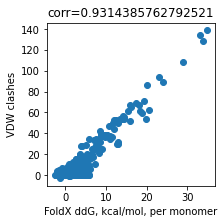

In [30]:
x = difs['7q4b']['total energy']/4 # per monomer
y = difs['7q4b']['Van der Waals clashes']
labels = difs['7q4b']['mutation']

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(x, y)

#plt.axline((0, 0), (1, 1), linewidth=1, color='r')

plt.xlabel('FoldX ddG, kcal/mol, per monomer')
plt.ylabel('VDW clashes')
plt.title('corr=' + str(np.corrcoef(x, y)[0][1]))


#for i, txt in enumerate(mutations):
#    ax.annotate(txt, (x[i], y[i]), fontsize=10)

Text(0.5, 1.0, 'corr=0.9435005615495271')

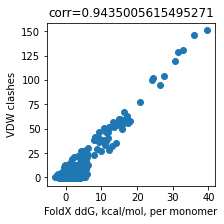

In [31]:
x = difs['7q4m']['total energy']/4 # per monomer
y = difs['7q4m']['Van der Waals clashes']
labels = difs['7q4m']['mutation']

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(x, y)

#plt.axline((0, 0), (1, 1), linewidth=1, color='r')

plt.xlabel('FoldX ddG, kcal/mol, per monomer')
plt.ylabel('VDW clashes')
plt.title('corr=' + str(np.corrcoef(x, y)[0][1]))


#for i, txt in enumerate(mutations):
#    ax.annotate(txt, (x[i], y[i]), fontsize=10)